# Predict the weekly sales of walmart stores by section using historical sales, markdown data and macro-economic indicators 

- Price Markdown is a method of reducing the sale price of a product

In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
ls

LICENSE              features.csv         stores.csv
README.md            sales_data.csv       walmart_sales.ipynb


In [5]:
#reading the required data files
sales_data = pd.read_csv('sales_data.csv')
stores_data = pd.read_csv('stores.csv')
features_data = pd.read_csv('features.csv')

# Exploratory Data Analysis (EDA)

In [6]:
sales_data.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,2010-02-05,24924.50,False
1,1,1,2010-02-12,46039.49,True
2,1,1,2010-02-19,41595.55,False
3,1,1,2010-02-26,19403.54,False
4,1,1,2010-03-05,21827.90,False


In [7]:
sales_data.isna().sum()

Store           0
Dept            0
Date            0
Weekly_Sales    0
IsHoliday       0
dtype: int64

In [8]:
sales_data.dtypes

Store             int64
Dept              int64
Date             object
Weekly_Sales    float64
IsHoliday          bool
dtype: object

In [9]:
sales_data.shape

(421570, 5)

In [10]:
sales_data.nunique()

Store               45
Dept                81
Date               143
Weekly_Sales    359464
IsHoliday            2
dtype: int64

`Observation`: Date is week day

In [11]:
sales_data.describe()

,Store,Dept,Weekly_Sales
count,421570.000000,421570.000000,421570.000000
mean,22.200546,44.260317,15981.258123
std,12.785297,30.492054,22711.183519
min,1.000000,1.000000,-4988.940000
25%,11.000000,18.000000,2079.650000
50%,22.000000,37.000000,7612.030000
75%,33.000000,74.000000,20205.852500
max,45.000000,99.000000,693099.360000


In [12]:
#now we wanna see if this is a systematic issue or random
sales_data_check = sales_data.loc[sales_data['Weekly_Sales'] <= 0]
sales_data_check.shape

(1358, 5)

In [14]:
sales_data_check.describe()

,Store,Dept,Weekly_Sales
count,1358.000000,1358.000000,1358.000000
mean,23.727541,50.142121,-64.920147
std,12.078568,24.063071,225.877919
min,1.000000,5.000000,-4988.940000
25%,14.000000,32.250000,-38.000000
50%,22.000000,47.000000,-12.000000
75%,35.000000,59.000000,-3.855000
max,45.000000,99.000000,0.000000


In [15]:
sales_data_check.nunique()

Store            45
Dept             51
Date            143
Weekly_Sales    679
IsHoliday         2
dtype: int64

`Observation`: this is not systematic issue, this is random issue

In [16]:
sales_data_check.shape[0]/sales_data.shape[0]

0.003221291837654482

In [17]:
sales_data['Store'] = sales_data['Store'].astype(str)
sales_data['Dept'] = sales_data['Dept'].astype(str)
sales_data['IsHoliday'] = sales_data['IsHoliday']*1

In [18]:
#Since it affects a small percentage of the data, lets drop these records
sales_data2 = sales_data.loc[sales_data['Weekly_Sales']>0]
sales_data2.shape

(420212, 5)

In [19]:
sales_data2.dtypes

Store            object
Dept             object
Date             object
Weekly_Sales    float64
IsHoliday         int64
dtype: object

In [20]:
#Creating a function that does all of the above tasks in one go
def get_basic_stats(dfname):
    print("Shape of dataframe is " + str(dfname.shape))
    print("Below are datatypes of columns in DF")
    print(dfname.dtypes.sort_values())
    print("Below are missing values in each column")
    print(dfname.isna().sum().sort_values())
    print("Below are the number of unique values taken by a column")
    print(dfname.nunique().sort_values())
    print("Below are some records in DF")
    print(dfname.head())
    print("Basic Stats for numeric variables")
    print(dfname.describe())

In [21]:
get_basic_stats(features_data)

Shape of dataframe is (8190, 12)
Below are datatypes of columns in DF
IsHoliday          bool
Store             int64
Temperature     float64
Fuel_Price      float64
MarkDown1       float64
MarkDown2       float64
MarkDown3       float64
MarkDown4       float64
MarkDown5       float64
CPI             float64
Unemployment    float64
Date             object
dtype: object
Below are missing values in each column
Store              0
Date               0
Temperature        0
Fuel_Price         0
IsHoliday          0
CPI              585
Unemployment     585
MarkDown5       4140
MarkDown1       4158
MarkDown3       4577
MarkDown4       4726
MarkDown2       5269
dtype: int64
Below are the number of unique values taken by a column
IsHoliday          2
Store             45
Date             182
Unemployment     404
Fuel_Price      1011
CPI             2505
MarkDown2       2715
MarkDown3       2885
MarkDown4       3405
MarkDown1       4023
MarkDown5       4045
Temperature     4178
dtype: int64
Be

get_basic_stats(stores_data)

In [22]:
get_basic_stats(stores_data)

Shape of dataframe is (45, 3)
Below are datatypes of columns in DF
Store     int64
Size      int64
Type     object
dtype: object
Below are missing values in each column
Store    0
Type     0
Size     0
dtype: int64
Below are the number of unique values taken by a column
Type      3
Size     40
Store    45
dtype: int64
Below are some records in DF
   Store Type    Size
0      1    A  151315
1      2    A  202307
2      3    B   37392
3      4    A  205863
4      5    B   34875
Basic Stats for numeric variables
           Store           Size
count  45.000000      45.000000
mean   23.000000  130287.600000
std    13.133926   63825.271991
min     1.000000   34875.000000
25%    12.000000   70713.000000
50%    23.000000  126512.000000
75%    34.000000  202307.000000
max    45.000000  219622.000000


In [23]:
#coverting variable to correct datatype
features_data['Store'] = features_data['Store'].astype(str)
stores_data['Store'] = stores_data['Store'].astype(str)

In [25]:
features_data2 = features_data.drop(['IsHoliday'], axis=1)

In [26]:
features_data2.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106


# Missing Value Imputation

In [27]:
features_data2['Unemployment'].fillna(features_data2['Unemployment'].mean(), inplace=True)
features_data2['CPI'].fillna(features_data2['CPI'].mean(), inplace=True)

In [28]:
#Markdown variables are missing in over half of the cases, and the most logical reason for that seems to be the absence \
#of any markdown in those cases  
features_data2.fillna(0, inplace=True)

In [29]:
stores_data.head()

,Store,Type,Size
0,1,A,151315
1,2,A,202307
2,3,B,37392
3,4,A,205863
4,5,B,34875


In [38]:
stores_data.groupby('Type').agg({'Size':'mean'})

,Size
Type,
A,177247.727273
B,101190.705882
C,40541.666667


In [44]:
stores_data.head()

,Store,Type,Size
0,1,A,151315
1,2,A,202307
2,3,B,37392
3,4,A,205863
4,5,B,34875


In [45]:
sales_data2.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,2010-02-05,24924.50,0
1,1,1,2010-02-12,46039.49,1
2,1,1,2010-02-19,41595.55,0
3,1,1,2010-02-26,19403.54,0
4,1,1,2010-03-05,21827.90,0


In [46]:
features_data2.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment
0,1,2010-02-05,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106
1,1,2010-02-12,38.51,2.548,0.0,0.0,0.0,0.0,0.0,211.242170,8.106
2,1,2010-02-19,39.93,2.514,0.0,0.0,0.0,0.0,0.0,211.289143,8.106
3,1,2010-02-26,46.63,2.561,0.0,0.0,0.0,0.0,0.0,211.319643,8.106
4,1,2010-03-05,46.50,2.625,0.0,0.0,0.0,0.0,0.0,211.350143,8.106


# Data preparation

In [39]:
#Stores unique key = Store
#Features Data - Store+Date
#Store+Dept+Date

In [60]:
features_data2.groupby(['Store','Date']).size().shape[0]

8190

In [62]:
features_data2.shape

(8190, 11)

In [74]:
sales_data.groupby(['Store','Dept','Date']).size().shape[0]

421570

In [75]:
sales_data.shape[0]

421570

In [72]:
features_data2.groupby(['Store','Date']).size().shape[0] - features_data2.shape[0]

0

In [73]:
sales_data.groupby(['Store', 'Dept', 'Date']).size().shape[0] - sales_data.shape[0]

0

# Merged Data store, sales and features based on common column

In [76]:
#Merging datasets
sales_features_data = pd.merge(sales_data2, features_data2, on=['Store', 'Date'], how='inner')
sales_features_data.shape

(420212, 14)

In [77]:
sales_features_data.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment
0,1,1,2010-02-05,24924.50,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106
1,1,2,2010-02-05,50605.27,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106
2,1,3,2010-02-05,13740.12,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106
3,1,4,2010-02-05,39954.04,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106
4,1,5,2010-02-05,32229.38,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106


In [78]:
combined_data = pd.merge(sales_features_data, stores_data, on='Store', how='inner')
combined_data.shape

(420212, 16)

In [79]:
combined_data.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Type,Size
0,1,1,2010-02-05,24924.50,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,A,151315
1,1,2,2010-02-05,50605.27,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,A,151315
2,1,3,2010-02-05,13740.12,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,A,151315
3,1,4,2010-02-05,39954.04,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,A,151315
4,1,5,2010-02-05,32229.38,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,A,151315


In [80]:
combined_data.isnull().sum()

Store           0
Dept            0
Date            0
Weekly_Sales    0
IsHoliday       0
Temperature     0
Fuel_Price      0
MarkDown1       0
MarkDown2       0
MarkDown3       0
MarkDown4       0
MarkDown5       0
CPI             0
Unemployment    0
Type            0
Size            0
dtype: int64

In [81]:
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 420212 entries, 0 to 420211
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Store         420212 non-null  object 
 1   Dept          420212 non-null  object 
 2   Date          420212 non-null  object 
 3   Weekly_Sales  420212 non-null  float64
 4   IsHoliday     420212 non-null  int64  
 5   Temperature   420212 non-null  float64
 6   Fuel_Price    420212 non-null  float64
 7   MarkDown1     420212 non-null  float64
 8   MarkDown2     420212 non-null  float64
 9   MarkDown3     420212 non-null  float64
 10  MarkDown4     420212 non-null  float64
 11  MarkDown5     420212 non-null  float64
 12  CPI           420212 non-null  float64
 13  Unemployment  420212 non-null  float64
 14  Type          420212 non-null  object 
 15  Size          420212 non-null  int64  
dtypes: float64(10), int64(2), object(4)
memory usage: 54.5+ MB


# Convert Date format from string

In [82]:
#getting the date variable in the correct format
combined_data['Date2'] = pd.to_datetime(combined_data['Date'], format = '%Y-%m-%d')

In [85]:
combined_data['Date2'].describe()

/var/folders/70/xyz7khq54gx8qklx52wtt6tw0000gn/T/ipykernel_57814/3727710838.py:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  combined_data['Date2'].describe()


count                  420212
unique                    143
top       2011-12-23 00:00:00
freq                     3018
first     2010-02-05 00:00:00
last      2012-10-26 00:00:00
Name: Date2, dtype: object

In [83]:
#match the number of weeks of difference with the number of distinct weeks in the data
print(combined_data['Date2'].nunique())
(combined_data['Date2'].max() - combined_data['Date2'].min())/7 #1 week should be added to this

143


Timedelta('142 days 00:00:00')

`Observation`: No date is missing

In [87]:
combined_data.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Type,Size,Date2
0,1,1,2010-02-05,24924.50,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,A,151315,2010-02-05
1,1,2,2010-02-05,50605.27,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,A,151315,2010-02-05
2,1,3,2010-02-05,13740.12,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,A,151315,2010-02-05
3,1,4,2010-02-05,39954.04,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,A,151315,2010-02-05
4,1,5,2010-02-05,32229.38,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,A,151315,2010-02-05


In [88]:
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 420212 entries, 0 to 420211
Data columns (total 17 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Store         420212 non-null  object        
 1   Dept          420212 non-null  object        
 2   Date          420212 non-null  object        
 3   Weekly_Sales  420212 non-null  float64       
 4   IsHoliday     420212 non-null  int64         
 5   Temperature   420212 non-null  float64       
 6   Fuel_Price    420212 non-null  float64       
 7   MarkDown1     420212 non-null  float64       
 8   MarkDown2     420212 non-null  float64       
 9   MarkDown3     420212 non-null  float64       
 10  MarkDown4     420212 non-null  float64       
 11  MarkDown5     420212 non-null  float64       
 12  CPI           420212 non-null  float64       
 13  Unemployment  420212 non-null  float64       
 14  Type          420212 non-null  object        
 15  Size          420

# Dividing data into train and test 

In [91]:
#Getting the date that comes at 70% of the data and using it to divide the original data
unique_dates = pd.DataFrame(combined_data['Date2'].unique(), columns = ['date'])
unique_dates.sort_values('date', inplace = True)
splitter = round(unique_dates.shape[0]*0.7, 0)
split_date=unique_dates.iloc[int(splitter)-1]['date']
split_date

Timestamp('2011-12-30 00:00:00')

In [92]:
#Using that date to make the split
combined_data_train = combined_data.loc[combined_data['Date2'] <= split_date]
combined_data_test = combined_data.loc[combined_data['Date2'] > split_date]
combined_data_train.shape[0]/combined_data.shape[0]

0.6977525629920136

# Univariate Analysis

(array([7157., 7140., 6309., 7175., 6286., 7121., 6796., 6909., 6158.,
        7206., 6988., 6736., 7324., 6995., 6886., 6482., 6823., 6818.,
        7077., 7119., 6651., 6733., 7017., 7137., 6824., 6867., 7127.,
        7058., 6604., 4990., 7071., 7122., 4470., 7177., 6586., 4321.,
        4947., 5066., 6885., 6979., 6987., 4729., 4707., 4932., 6712.]),
 array([ 0.        ,  0.97777778,  1.95555556,  2.93333333,  3.91111111,
         4.88888889,  5.86666667,  6.84444444,  7.82222222,  8.8       ,
         9.77777778, 10.75555556, 11.73333333, 12.71111111, 13.68888889,
        14.66666667, 15.64444444, 16.62222222, 17.6       , 18.57777778,
        19.55555556, 20.53333333, 21.51111111, 22.48888889, 23.46666667,
        24.44444444, 25.42222222, 26.4       , 27.37777778, 28.35555556,
        29.33333333, 30.31111111, 31.28888889, 32.26666667, 33.24444444,
        34.22222222, 35.2       , 36.17777778, 37.15555556, 38.13333333,
        39.11111111, 40.08888889, 41.06666667, 42.04444444,

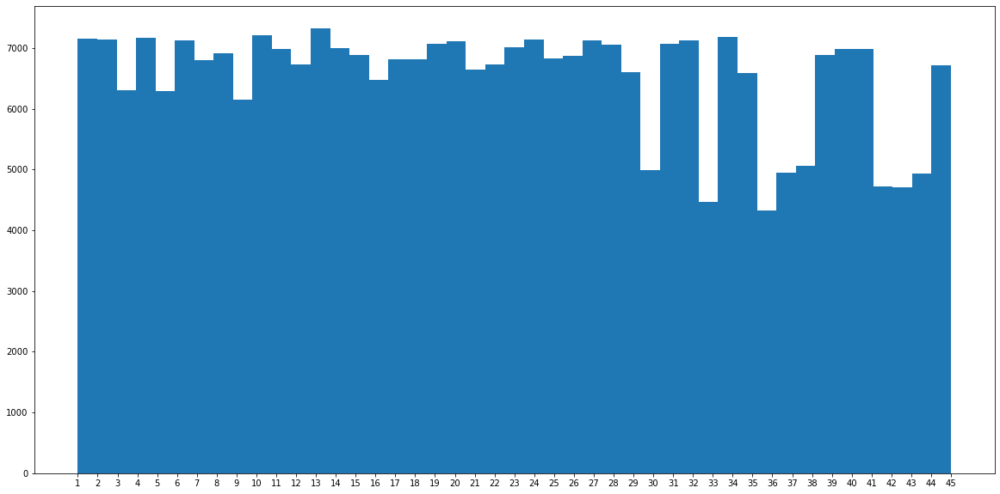

In [93]:
plt.figure(figsize=(20,10))
plt.hist(list(combined_data_train['Store']), bins = combined_data_train['Store'].nunique() )

/var/folders/70/xyz7khq54gx8qklx52wtt6tw0000gn/T/ipykernel_57814/3231068424.py:1: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cat_columns = combined_data_train.select_dtypes(np.object).columns.tolist()


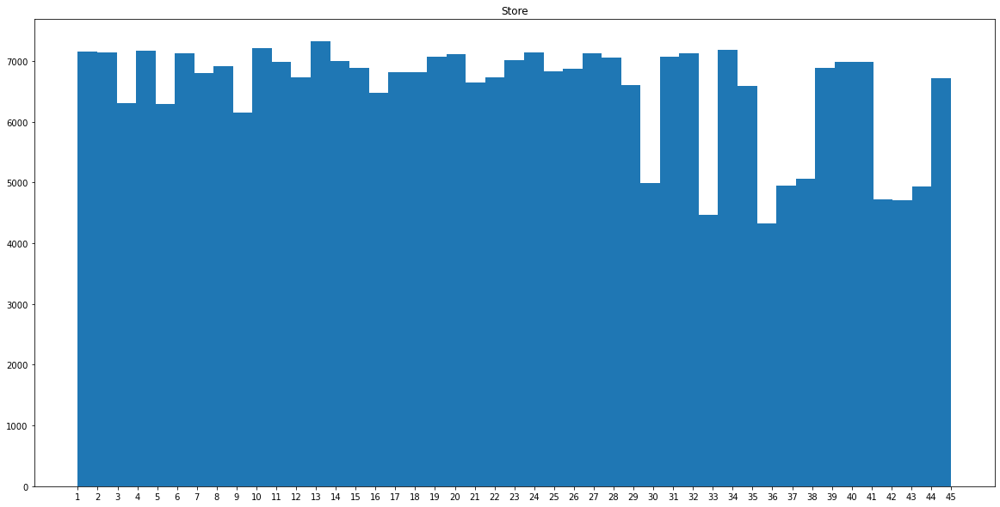

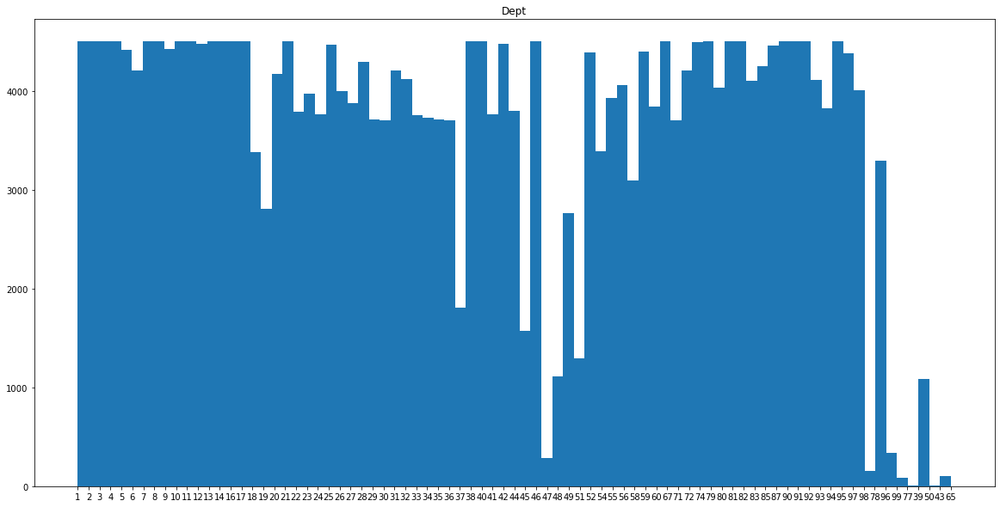

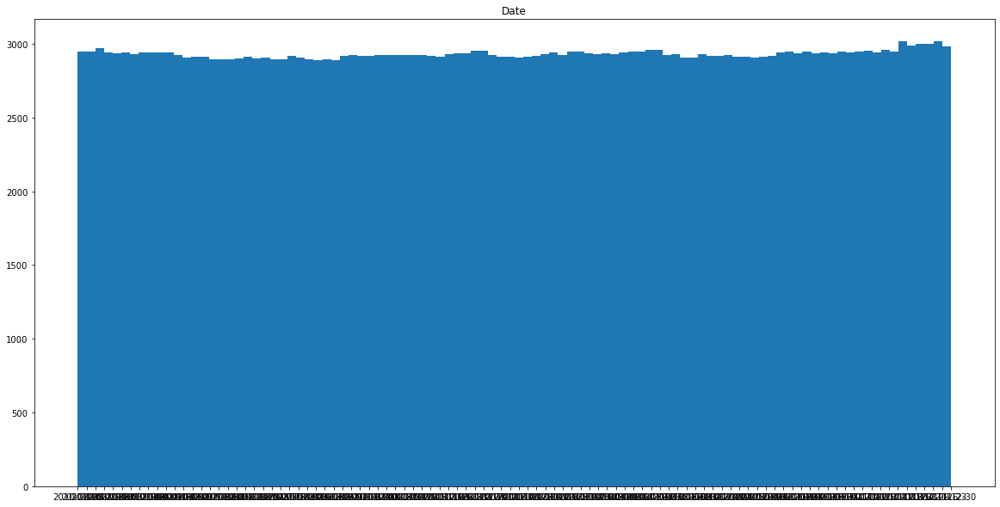

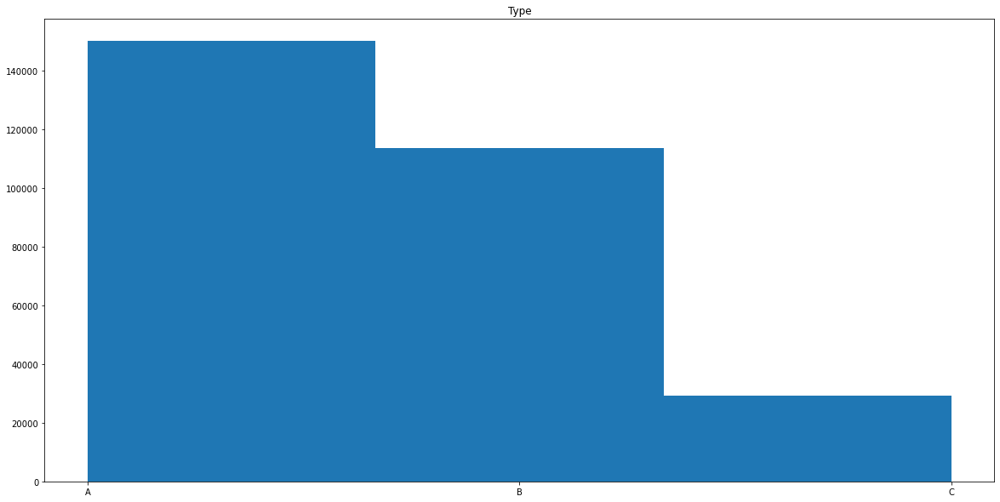

In [94]:
cat_columns = combined_data_train.select_dtypes(np.object).columns.tolist()
#univariate analysis of categorical variables
for var in cat_columns:
    plt.figure(figsize = (20,10))
    plt.hist(list(combined_data_train[var]), bins = combined_data_train[var].nunique() )
    plt.title(var)
    plt.show

# Create Boxplot for Numerical variable

In [95]:

num_columns = combined_data_train.select_dtypes(np.number).columns.tolist()
mark_columns = [x for x in num_columns if 'Mark' in x]
mark_columns
nonmark_columns = list(set(num_columns).difference(set(mark_columns)))
nonmark_columns

['Unemployment',
 'IsHoliday',
 'Temperature',
 'Fuel_Price',
 'CPI',
 'Weekly_Sales',
 'Size']

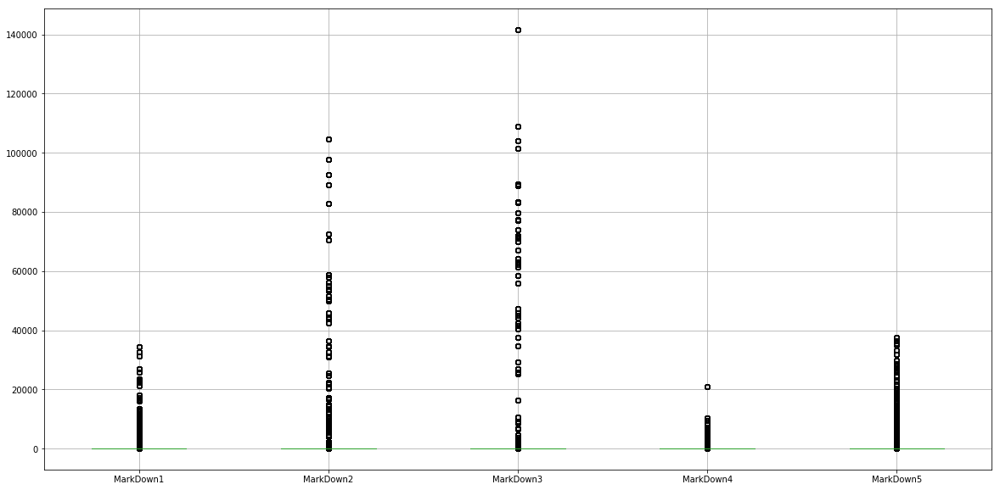

In [96]:
combined_data_train.boxplot(column = mark_columns, figsize=(20,10))

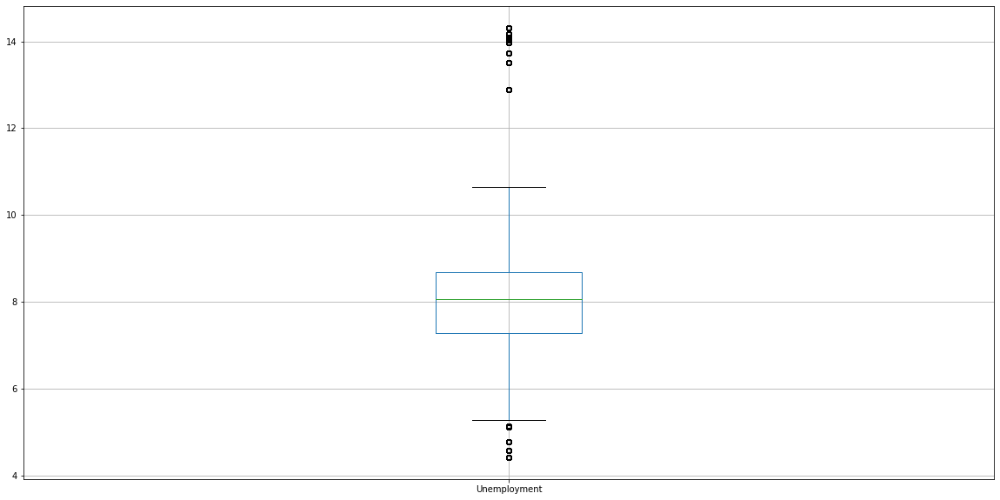

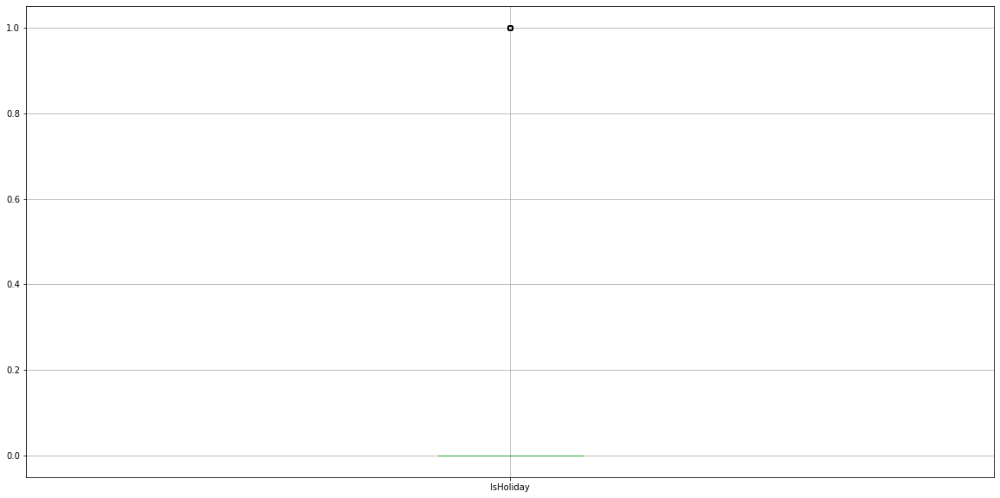

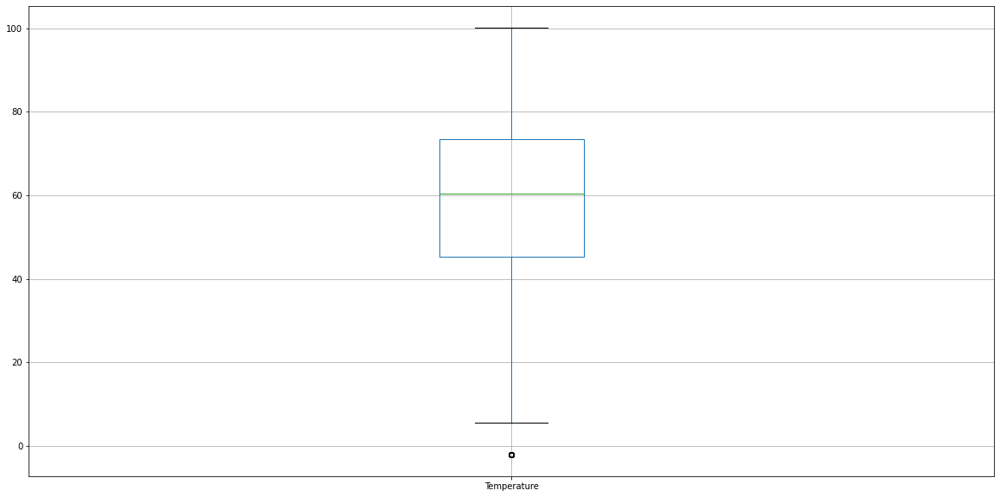

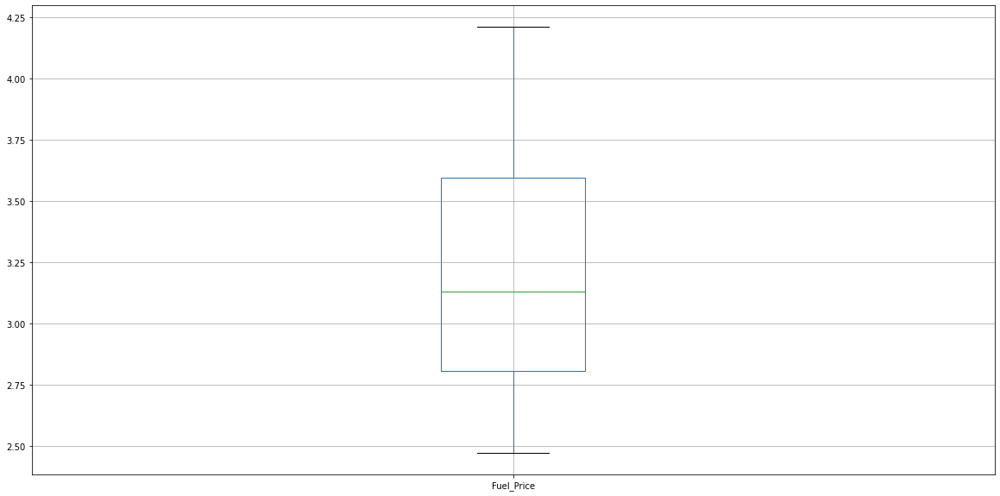

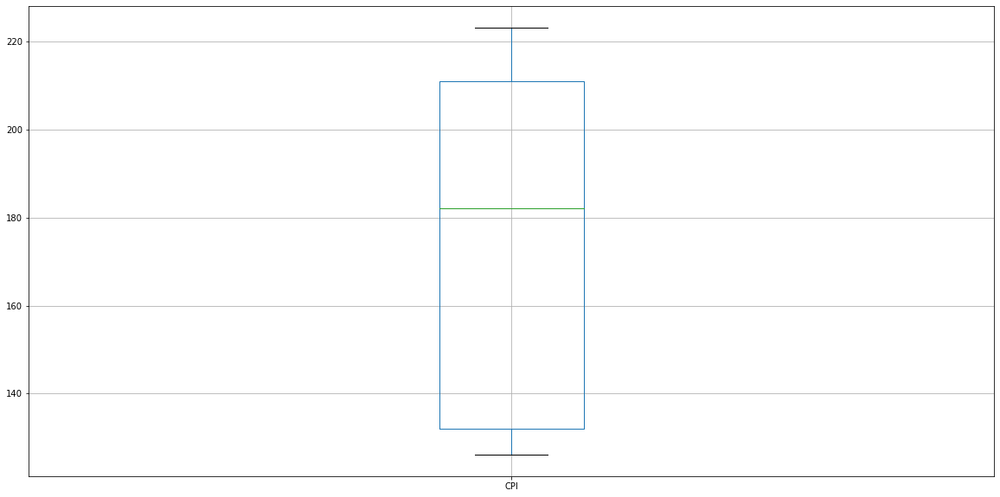

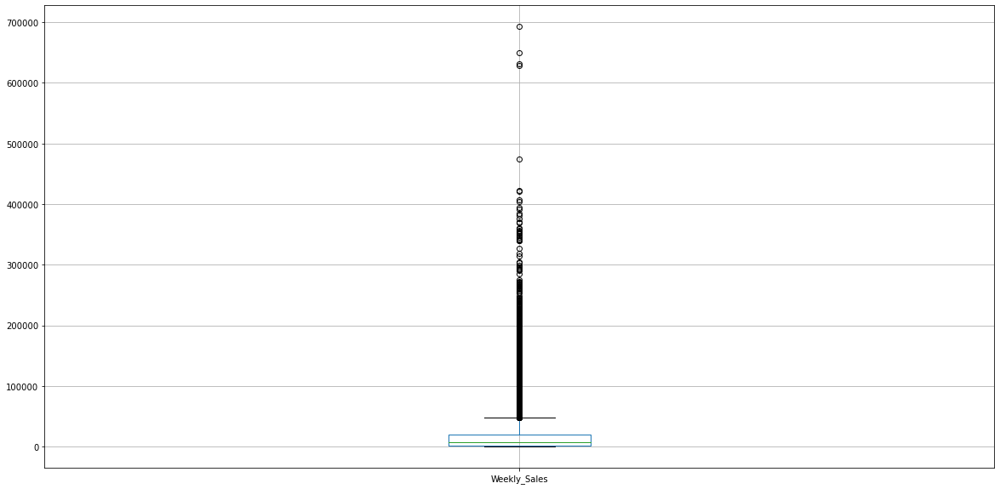

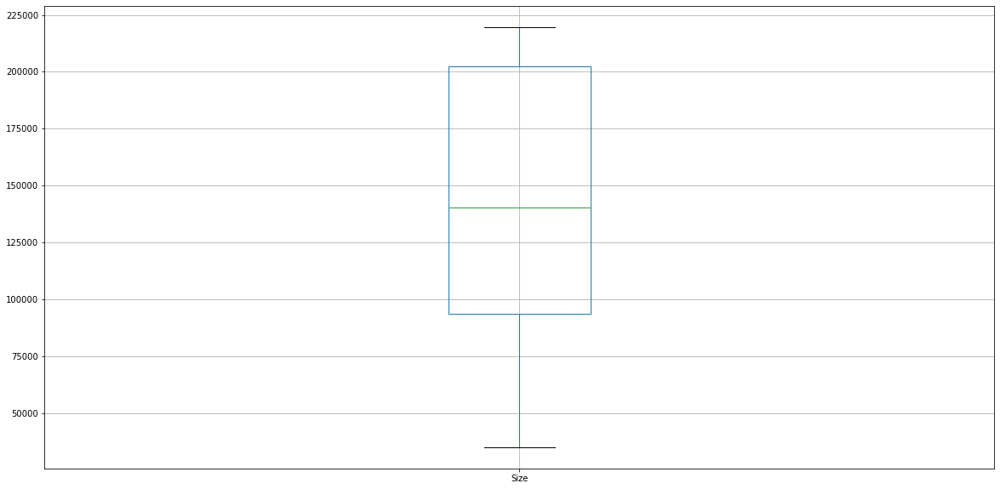

In [96]:
for var in nonmark_columns:
    combined_data_train.boxplot(column = var, figsize=(20,10))
    plt.show()

# Bivariate Analysis

In [97]:
#Keeping the numeric predictors
train_num = combined_data_train[num_columns]
train_num = train_num.drop(['Weekly_Sales'], axis=1)
train_num.head()

,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Size
0,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,151315
1,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,151315
2,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,151315
3,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,151315
4,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,151315


In [98]:
#Checking the highly correlated variables
corr_values = train_num.corr().unstack().reset_index()
print(corr_values.shape)
corr_values2 = corr_values[corr_values['level_0'] > corr_values['level_1'] ]
print(corr_values2.shape)
corr_values2.columns = ['var1', 'var2', 'corr_value']
corr_values2['corr_abs'] = corr_values2['corr_value'].abs()
corr_values2.sort_values( 'corr_abs', ascending=False, inplace=True)
corr_values2.head(10)

(121, 3)
(55, 3)


/var/folders/70/xyz7khq54gx8qklx52wtt6tw0000gn/T/ipykernel_57814/2354861966.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  corr_values2['corr_abs'] = corr_values2['corr_value'].abs()
/opt/homebrew/Caskroom/miniforge/base/envs/tensorflow/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


,var1,var2,corr_value,corr_abs
69,MarkDown4,MarkDown1,0.764146,0.764146
83,MarkDown5,MarkDown4,0.673759,0.673759
80,MarkDown5,MarkDown1,0.573937,0.573937
47,MarkDown2,MarkDown1,0.364552,0.364552
107,Unemployment,CPI,-0.298205,0.298205
55,MarkDown3,IsHoliday,0.296824,0.296824
44,MarkDown2,IsHoliday,0.272442,0.272442
70,MarkDown4,MarkDown2,0.232324,0.232324
30,Fuel_Price,CPI,-0.180454,0.180454
11,Temperature,IsHoliday,-0.178936,0.178936


<AxesSubplot:>

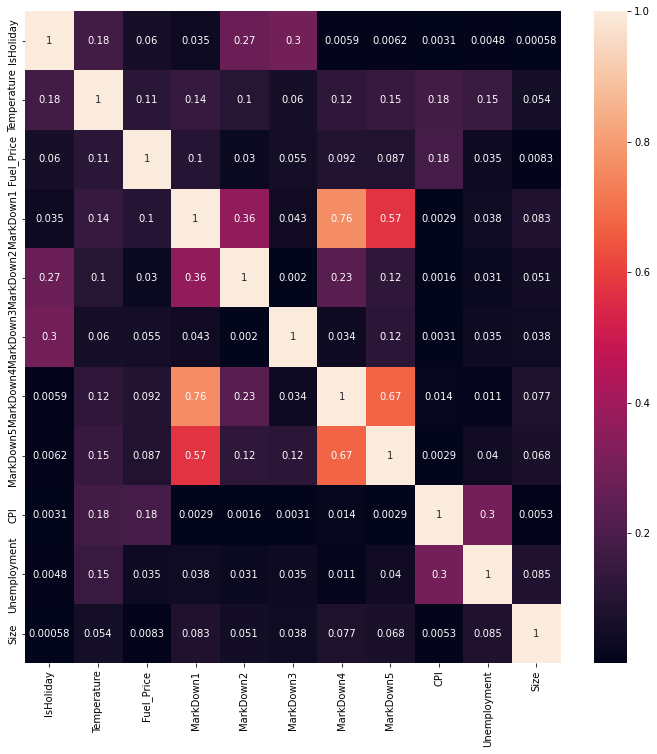

In [99]:
#creating a heat map to see the degree of correlation visually
plt.figure(figsize=(12, 12))
vg_corr = train_num.corr().abs()
sns.heatmap(vg_corr, xticklabels = vg_corr.columns.values,yticklabels = vg_corr.columns.values, annot = True)

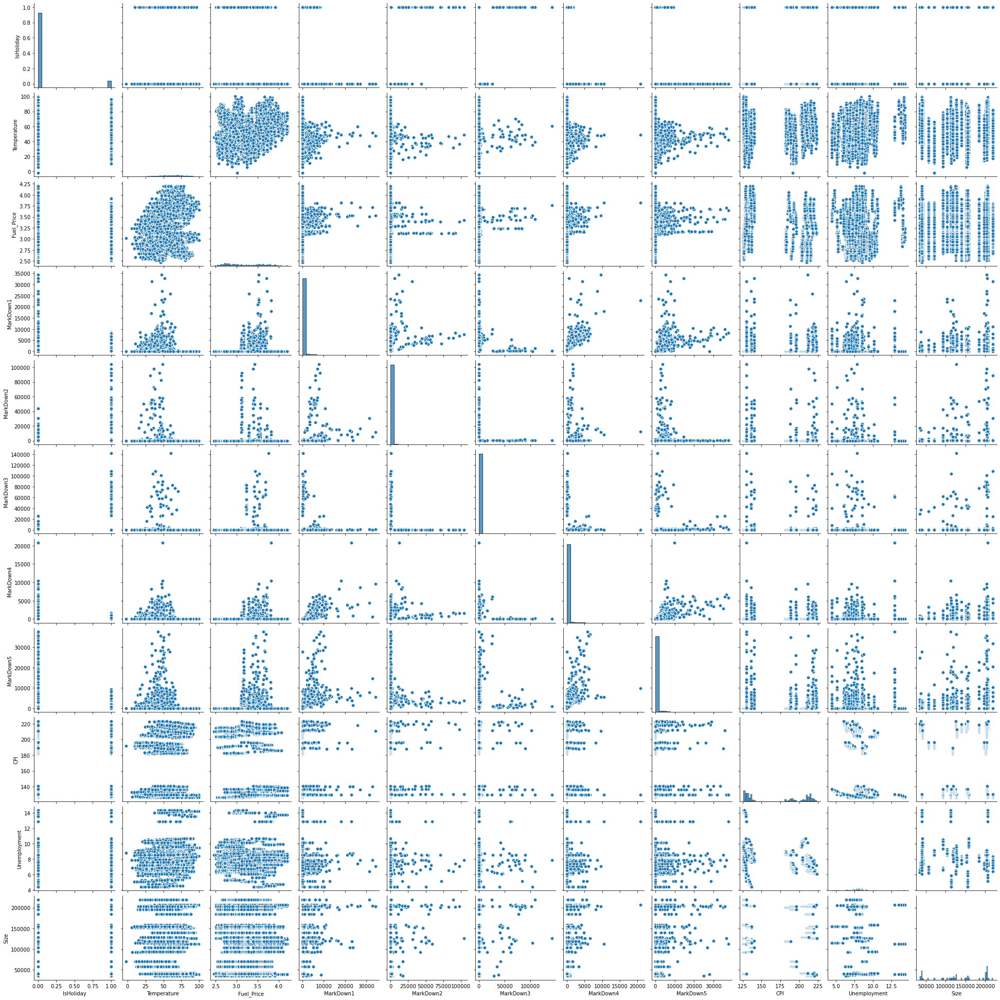

In [100]:
#Plotting each numeric predictor against the other
sns.pairplot(train_num)

# Variable trend with Dependent Variable

Store
    Store  Weekly_Sales
0       1  1.542039e+06
11      2  1.938904e+06
22      3  3.956343e+05
33      4  2.067737e+06
40      5  3.130725e+05
Dept
    Dept  Weekly_Sales
0      1  8.819285e+05
10     2  1.955582e+06
21     3  5.210935e+05
32     4  1.161434e+06
43     5  1.021350e+06


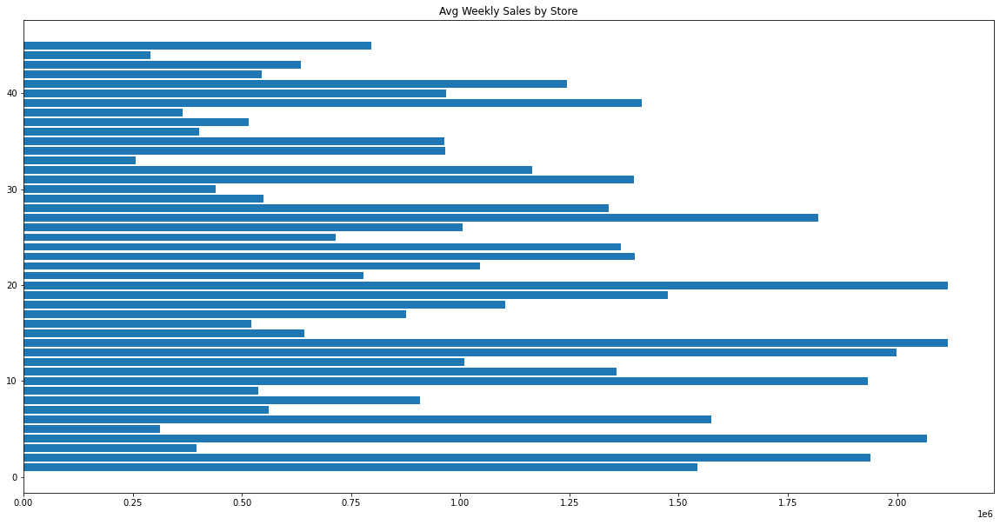

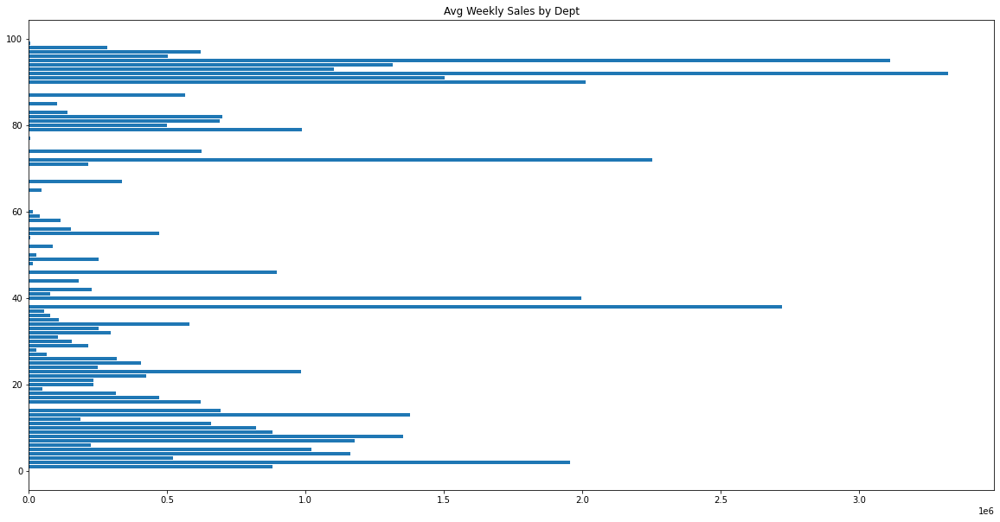

In [102]:
#Looking at average weekly Sales by STORE, DEPT...directly taking average will lead to incorrect result..
for var in ['Store', 'Dept']:
    print(var)
    agg_temp = combined_data_train.groupby([var, 'Date2'], as_index=False).agg({'Weekly_Sales': 'sum'})
    agg_temp2 = agg_temp.groupby([var], as_index=False).agg({'Weekly_Sales': 'mean'})
    agg_temp2[var] = pd.to_numeric(agg_temp2[var])
    agg_temp2.sort_values(var, inplace=True)
    print(agg_temp2.head())
    plt.figure(figsize=(20,10))
    plt.title('Avg Weekly Sales by ' + var)
    plt.barh(agg_temp2[var], agg_temp2['Weekly_Sales'])

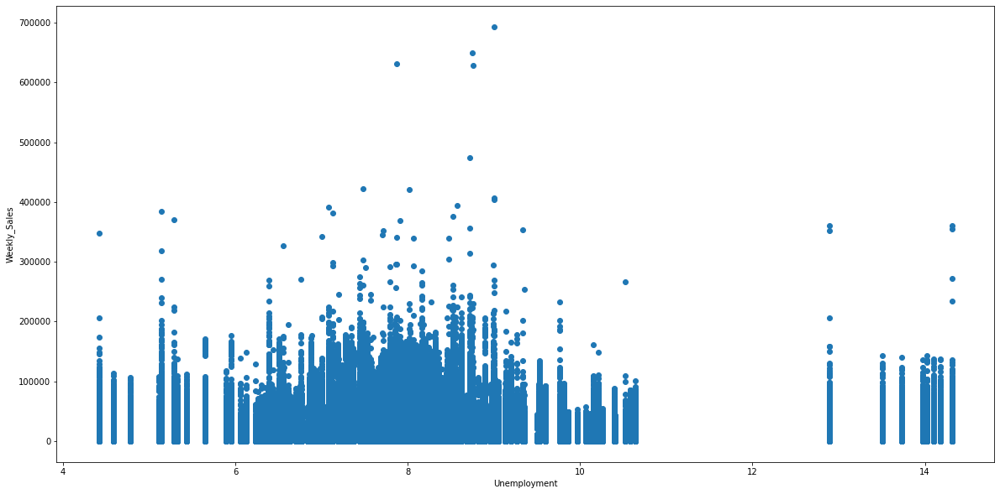

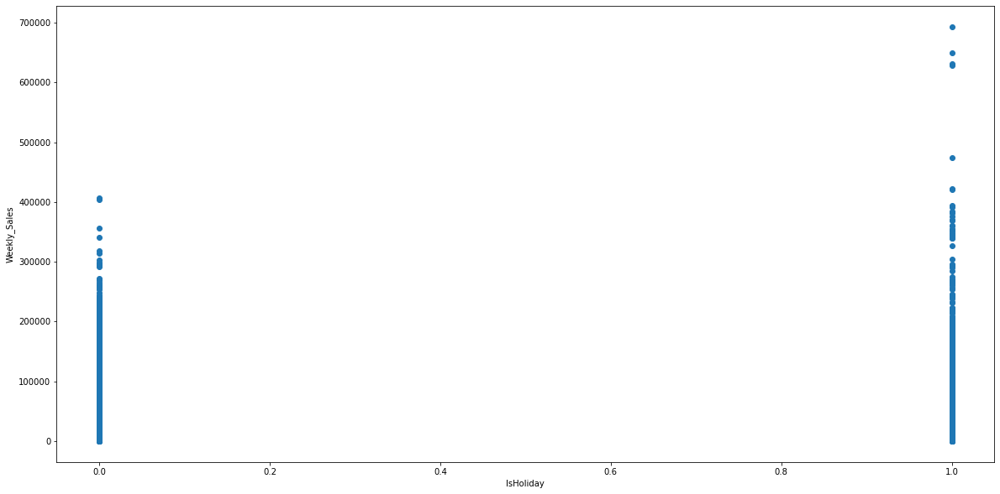

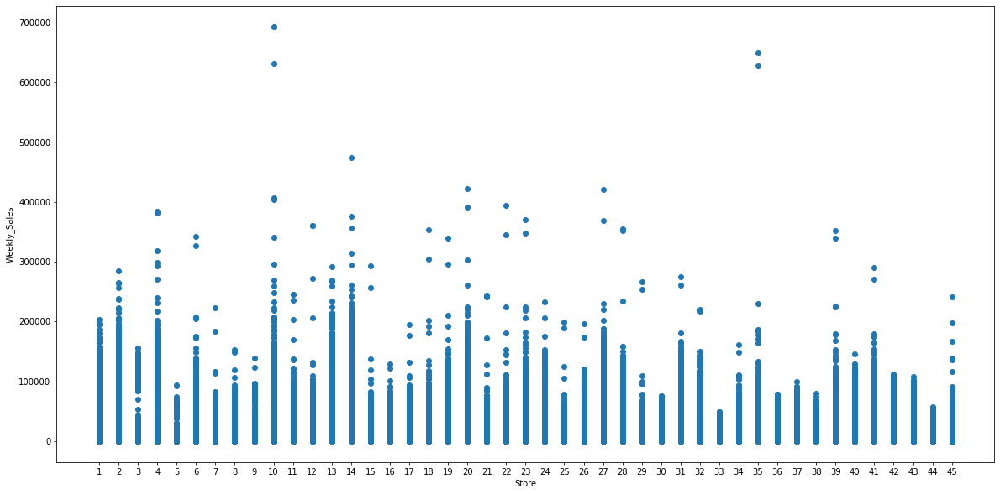

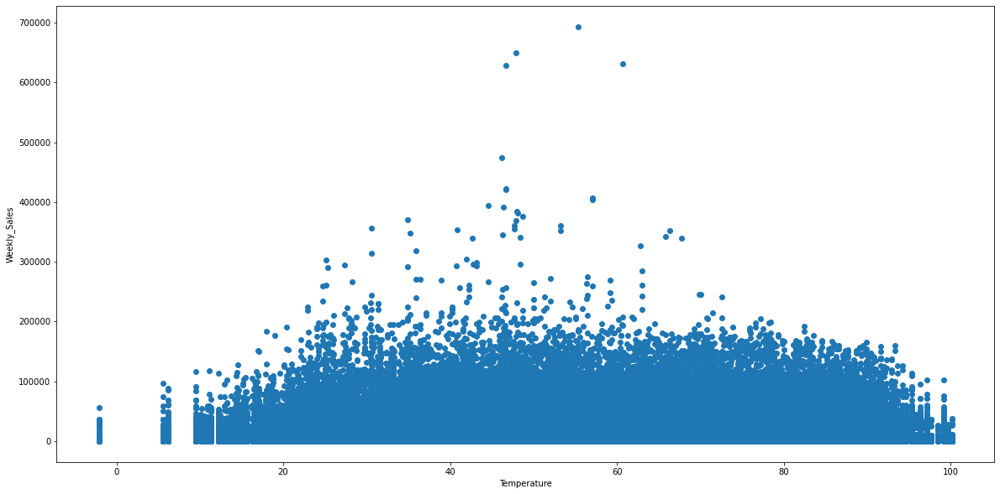

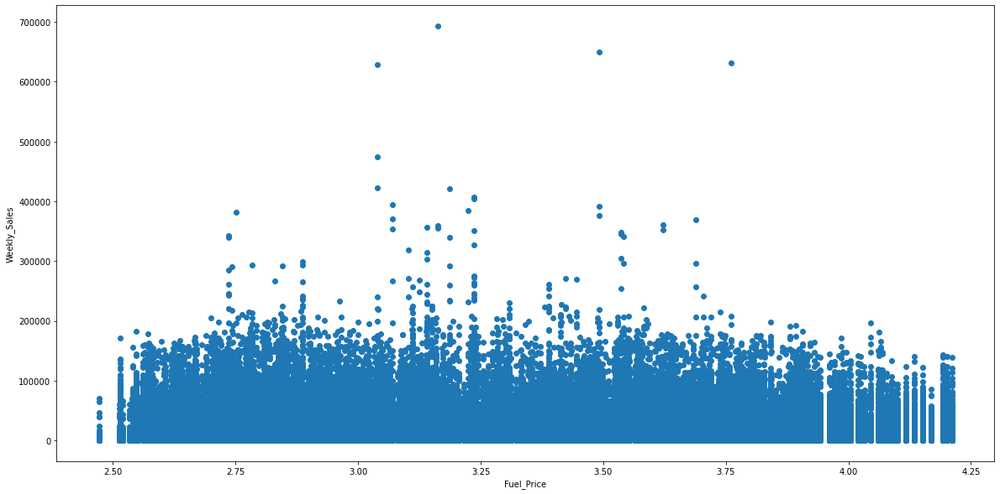

...

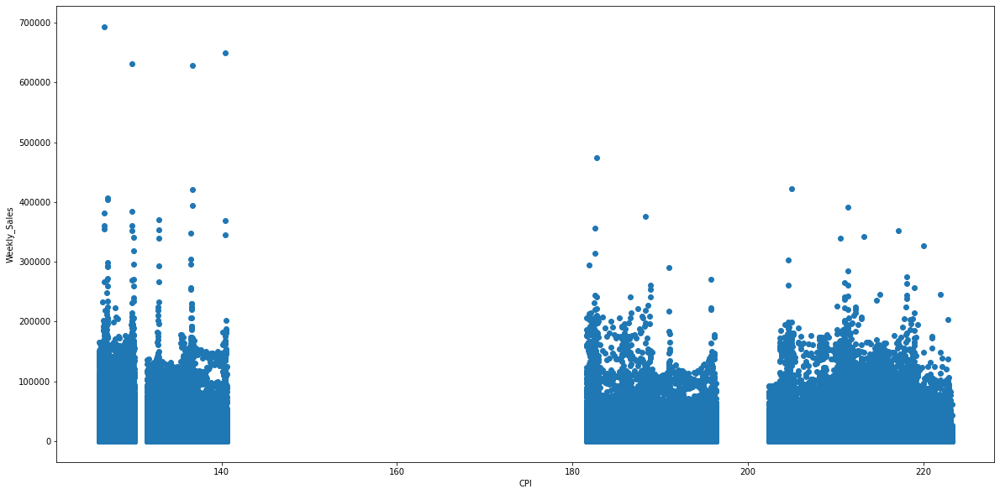

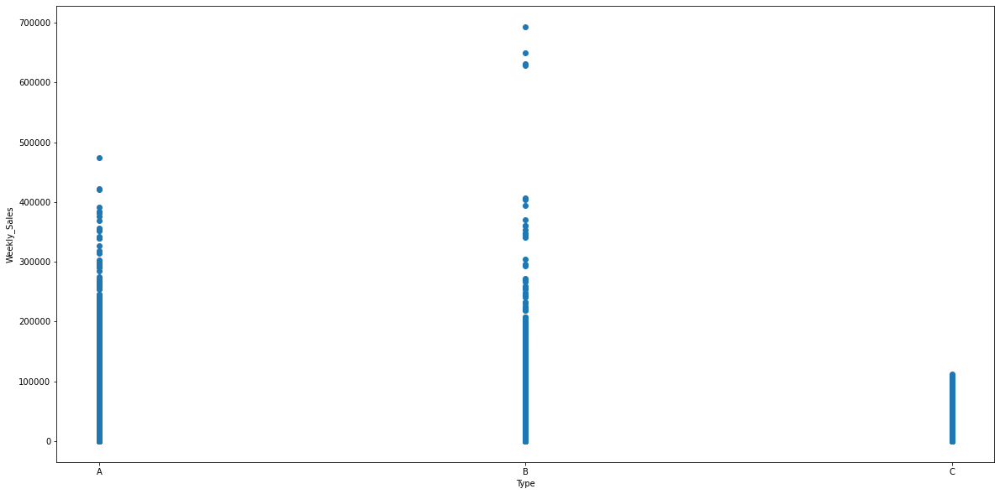

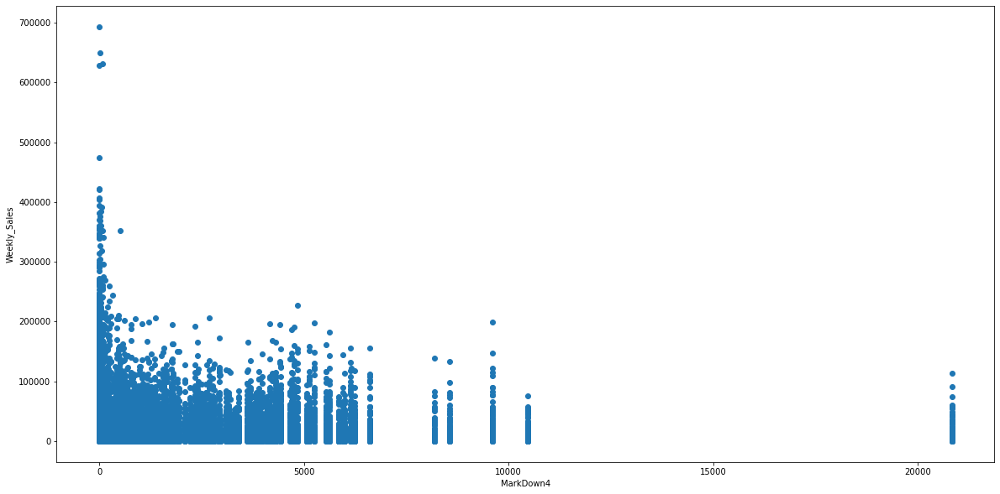

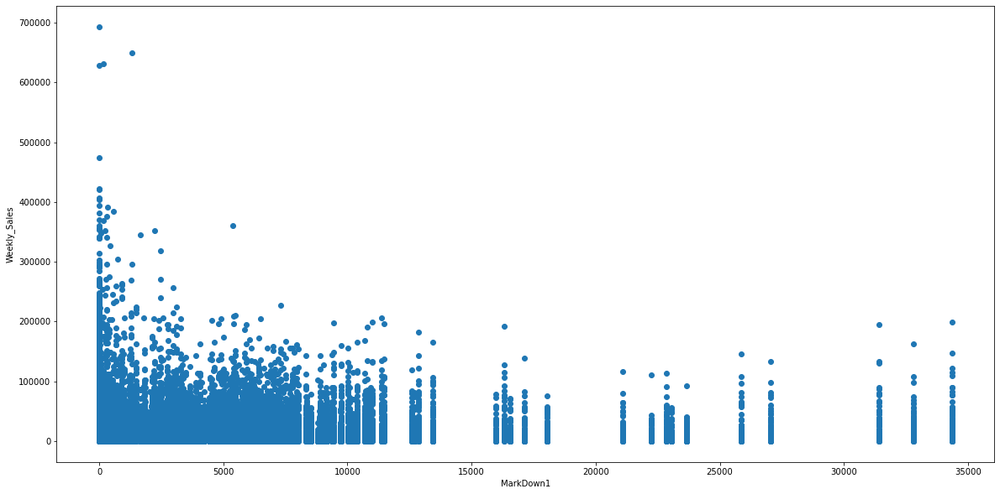

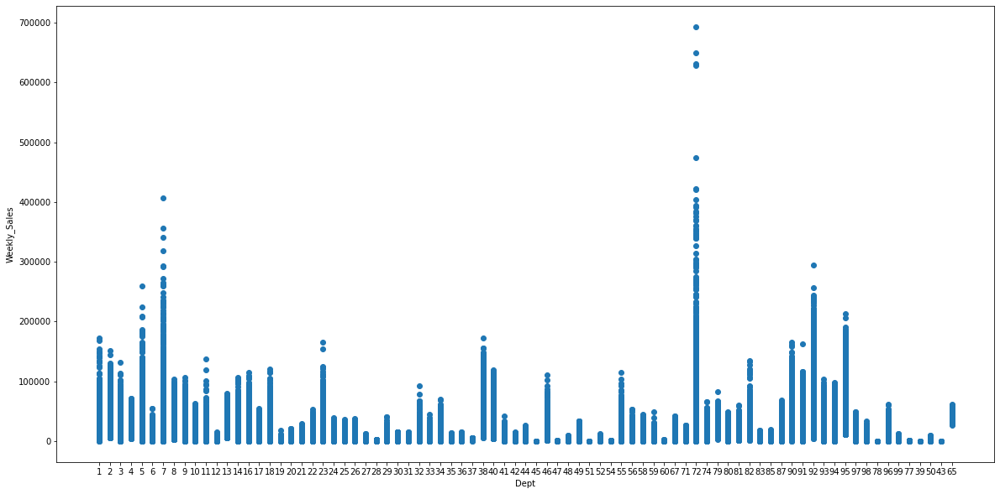

In [103]:
#Using scatter plot to check trend of predictors with dependent variable
var_list = [x for x in combined_data_train.columns]
columnstodrop = ['Weekly_Sales', 'Date']
var_list = list(set(var_list).difference(set(columnstodrop)))
for varname in var_list:
    plt.figure(figsize=(20,10))
    plt.scatter(combined_data_train[varname], combined_data_train['Weekly_Sales'])
    plt.xlabel(varname); plt.ylabel("Weekly_Sales")


In [104]:
#check trend of dependent variable with other variables
all_corr = combined_data_train.corr().unstack().reset_index()
print(all_corr.shape)
corr_table = all_corr[all_corr['level_1'] =='Weekly_Sales' ]
corr_table = corr_table.loc[ (corr_table['level_0'] != 'Weekly_Sales') ]
print(corr_table.shape)
corr_table.columns = ['var1', 'var2', 'corr_value']
corr_table['corr_abs'] = corr_table['corr_value'].abs()
corr_table = corr_table.sort_values(by= ['corr_abs'], ascending = False )
corr_table

(144, 3)
(11, 3)


,var1,var2,corr_value,corr_abs
132,Size,Weekly_Sales,0.242929,0.242929
72,MarkDown3,Weekly_Sales,0.044642,0.044642
96,MarkDown5,Weekly_Sales,0.038685,0.038685
48,MarkDown1,Weekly_Sales,0.035576,0.035576
84,MarkDown4,Weekly_Sales,0.031970,0.031970
120,Unemployment,Weekly_Sales,-0.025631,0.025631
108,CPI,Weekly_Sales,-0.021871,0.021871
60,MarkDown2,Weekly_Sales,0.016028,0.016028
12,IsHoliday,Weekly_Sales,0.013925,0.013925
24,Temperature,Weekly_Sales,-0.007911,0.007911


#  Date trends

In [105]:
#Adding the week number and year column 
combined_data_train['week_number'] = combined_data_train['Date2'].dt.week
combined_data_train['year_number'] = combined_data_train['Date2'].dt.year

/var/folders/70/xyz7khq54gx8qklx52wtt6tw0000gn/T/ipykernel_57814/2973467545.py:2: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  combined_data_train['week_number'] = combined_data_train['Date2'].dt.week
/var/folders/70/xyz7khq54gx8qklx52wtt6tw0000gn/T/ipykernel_57814/2973467545.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  combined_data_train['week_number'] = combined_data_train['Date2'].dt.week
/var/folders/70/xyz7khq54gx8qklx52wtt6tw0000gn/T/ipykernel_57814/2973467545.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: 

In [106]:
#Checking the holiday weeks with highest total sales 
temper = combined_data_train.groupby('Date', as_index=False).agg({'Weekly_Sales':'sum'})
print(temper['Weekly_Sales'].mean())
temper = combined_data_train.groupby(['Date', 'IsHoliday', 'week_number', 'year_number'], as_index=False).agg({'Weekly_Sales':'sum'})
temper.loc[temper['IsHoliday'] == 1].sort_values(by = 'Weekly_Sales', ascending=False)

47371515.06889997


,Date,IsHoliday,week_number,year_number,Weekly_Sales
94,2011-11-25,1,47,2011,66593835.85
42,2010-11-26,1,47,2010,65821216.26
1,2010-02-12,1,6,2010,48336800.10
53,2011-02-11,1,6,2011,47336816.90
83,2011-09-09,1,36,2011,46763760.42
99,2011-12-30,1,52,2011,46044300.91
31,2010-09-10,1,36,2010,45635418.66
47,2010-12-31,1,52,2010,40434740.42


In [107]:
#Checking the weeks with highest total sales..please note that most of them are non holidays
temper.sort_values(by = 'Weekly_Sales', ascending=False).head(20)

,Date,IsHoliday,week_number,year_number,Weekly_Sales
46,2010-12-24,0,51,2010,80931586.20
98,2011-12-23,0,51,2011,76999773.57
94,2011-11-25,1,47,2011,66593835.85
42,2010-11-26,1,47,2010,65821216.26
45,2010-12-17,0,50,2010,61821317.85
97,2011-12-16,0,50,2011,60086723.16
44,2010-12-10,0,49,2010,55667840.03
96,2011-12-09,0,49,2011,55561557.73
8,2010-04-02,0,13,2010,50424232.22
17,2010-06-04,0,22,2010,50188767.60


<AxesSubplot:title={'center':'Total Juxtaposed Weekly Sales'}, xlabel='week_number', ylabel='Weekly_Sales'>

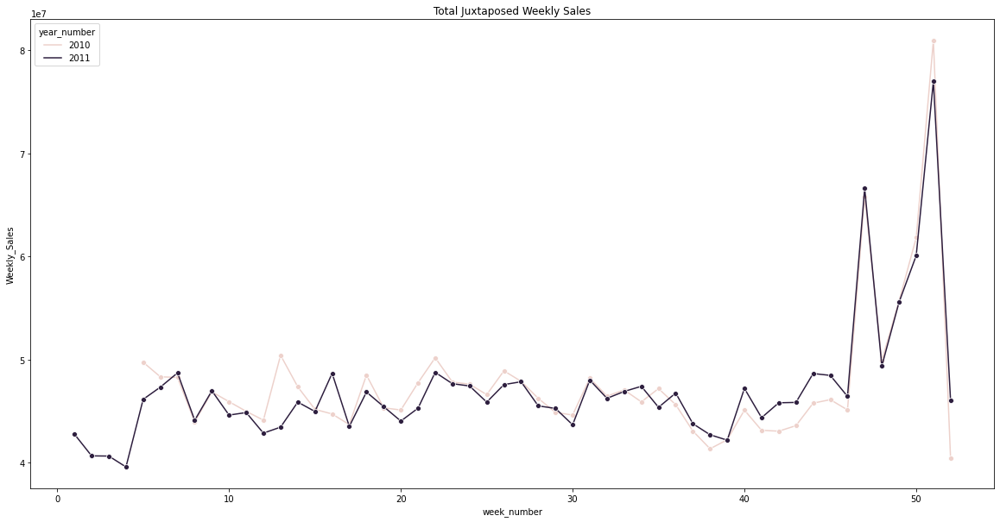

In [108]:
#Checking weekly Sales of different years juxtaposed
another_agg = combined_data_train.groupby(['week_number', 'year_number', 'IsHoliday'], as_index=False).agg({ 'Weekly_Sales' : 'sum'})
plt.figure(figsize=(20,10))
plt.title('Total Juxtaposed Weekly Sales')
sns.lineplot(x="week_number", y="Weekly_Sales", hue="year_number", data = another_agg, marker = 'o')

          Date2 Store  Weekly_Sales
2075 2010-12-24    14    3818686.45
2082 2010-12-24    20    3766687.43
2071 2010-12-24    10    3749057.69
4443 2011-12-23     4    3676388.98
2074 2010-12-24    13    3595903.20
4414 2011-12-23    13    3556766.03
4422 2011-12-23    20    3555379.47
2103 2010-12-24     4    3526713.39
4411 2011-12-23    10    3487986.89
2081 2010-12-24     2    3436154.68
          Date2 Dept  Weekly_Sales
3301 2010-11-26   72   10533640.92
7292 2011-11-25   72   10089874.40
3605 2010-12-24    7    6490778.39
3607 2010-12-24   72    6020196.03
7606 2011-12-23    7    5535941.35
7608 2011-12-23   72    5028104.79
7623 2011-12-23   92    4647997.52
7307 2011-11-25   92    4330784.59
3620 2010-12-24   92    4203774.33
7543 2011-12-16   92    4093797.82


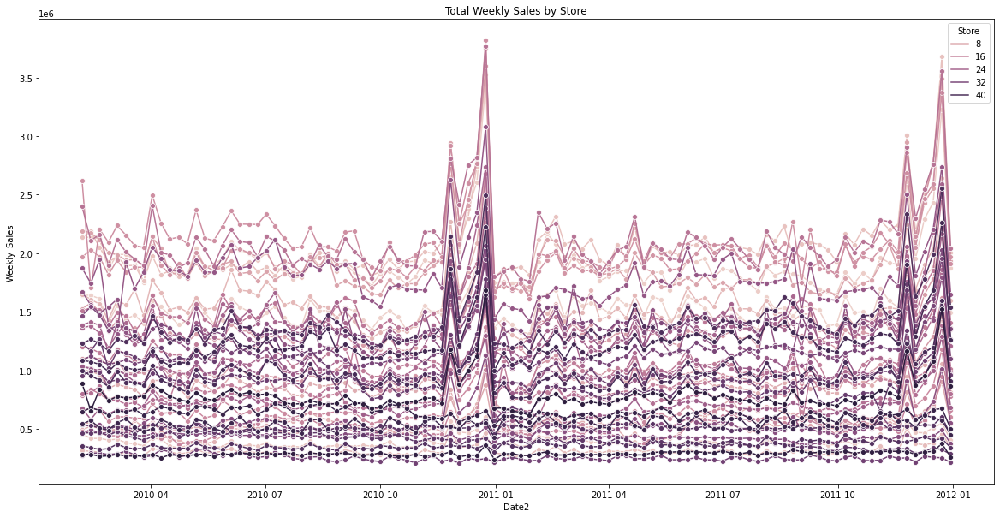

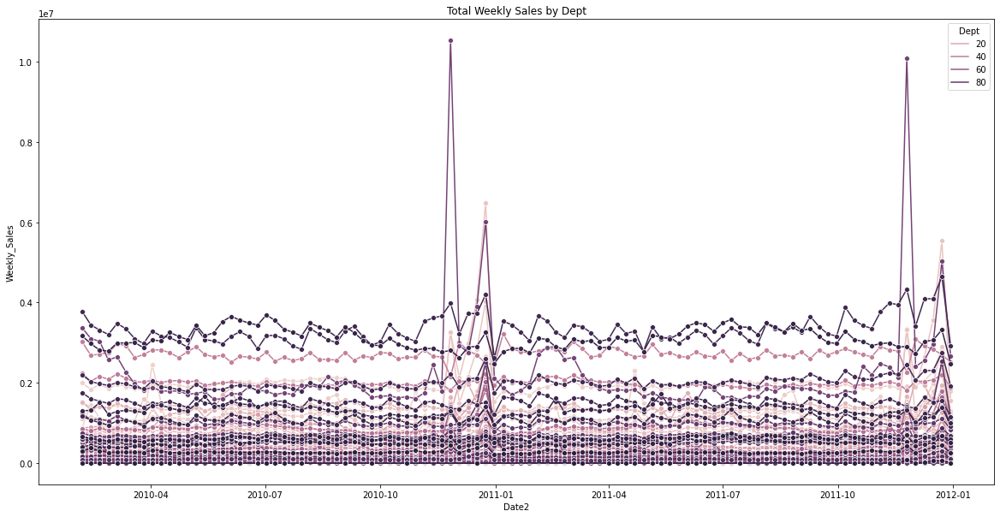

In [109]:
#Checking total weekly Sales of different Stores
for var in ['Store', 'Dept']:
    agg_temp = combined_data_train.groupby(['Date2', var], as_index=False).agg({ 'Weekly_Sales' : 'sum'})
    print(agg_temp.sort_values(by='Weekly_Sales', ascending=False).head(10))
    plt.figure(figsize=(20,10))
    plt.title('Total Weekly Sales by ' + var)
    agg_temp[var] = pd.to_numeric(agg_temp[var])#The hue variable has to be numerical 
    sns.lineplot(x="Date2", y="Weekly_Sales", hue=var, data = agg_temp, marker = 'o')

(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(7, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(6, 5)
(100, 5)
(100, 5)
(100, 5)
(89, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(98, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(9, 5)
(49, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(

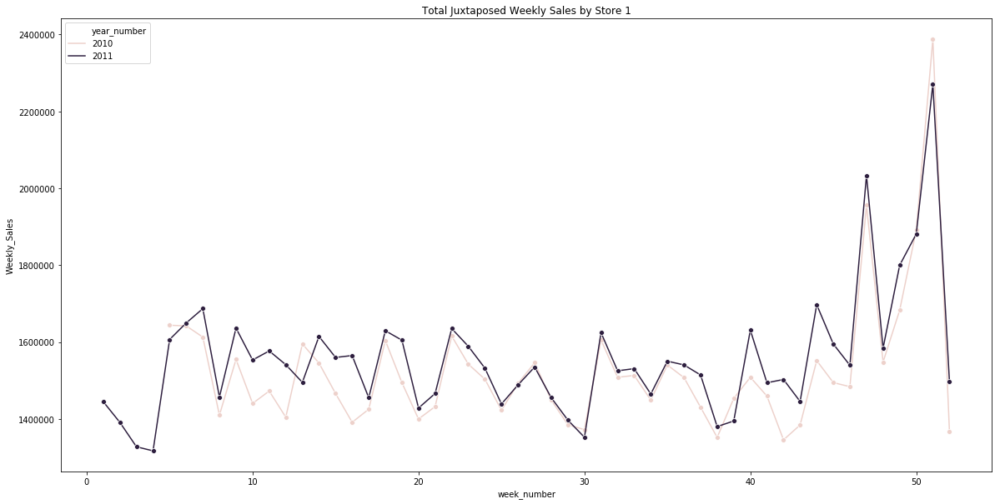

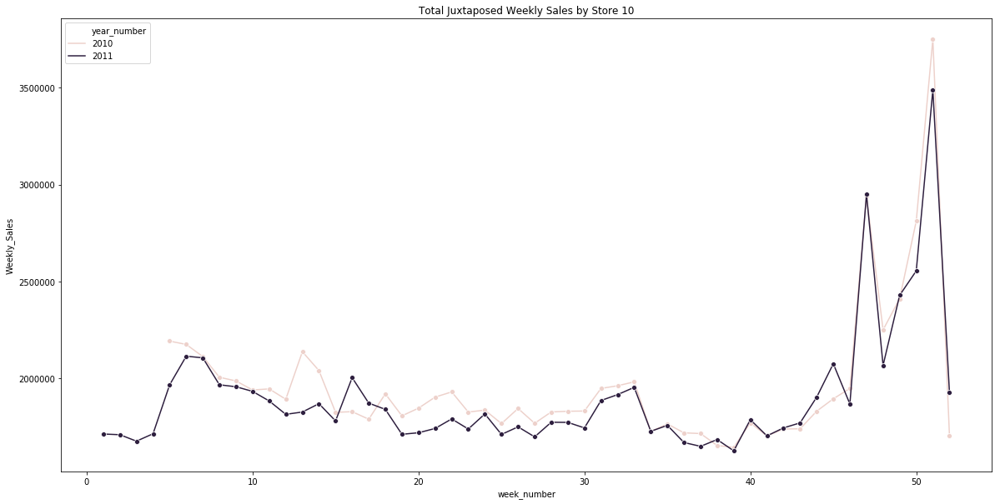

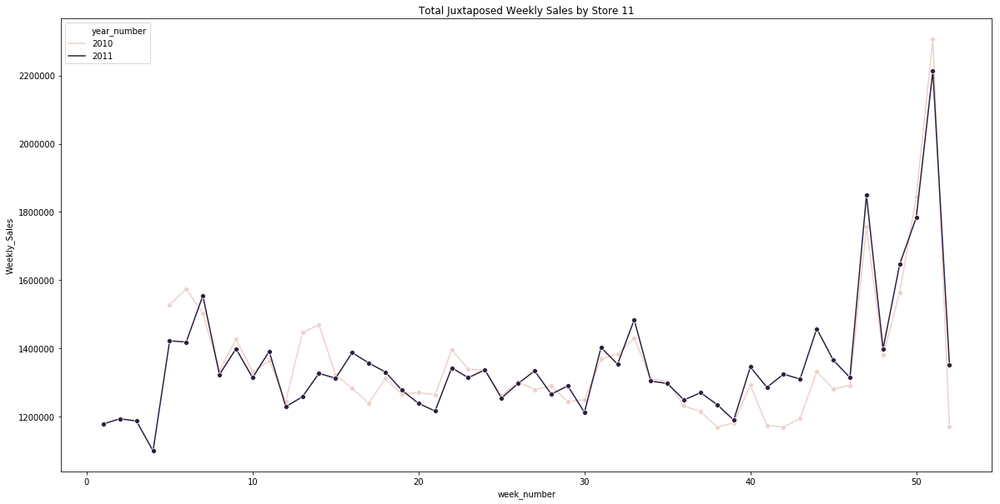

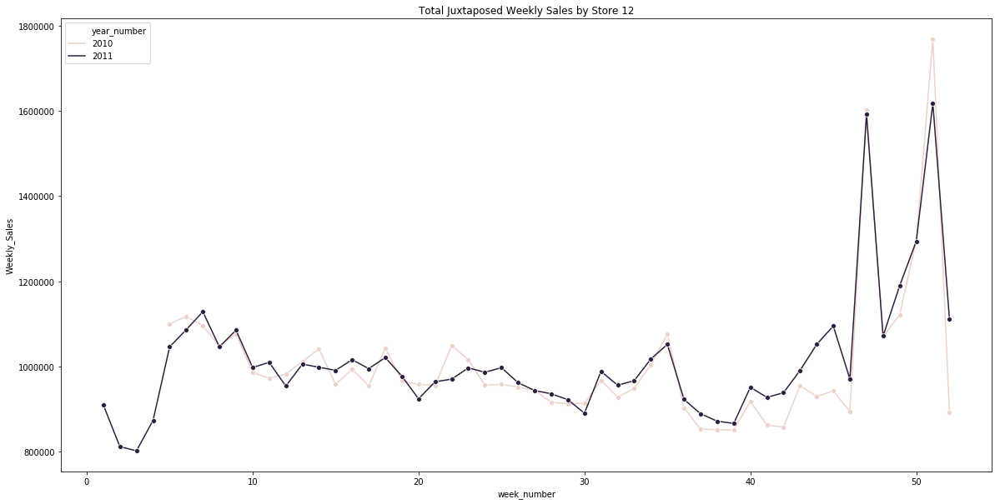

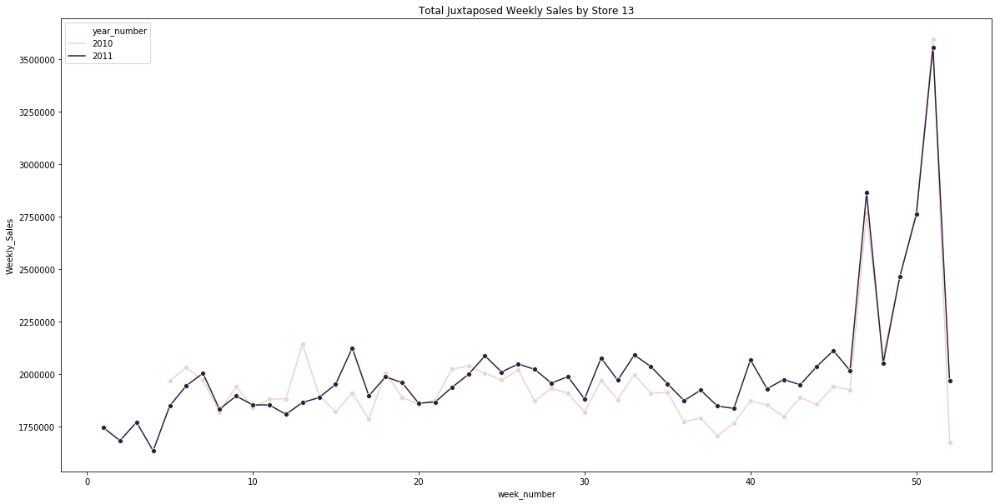

...

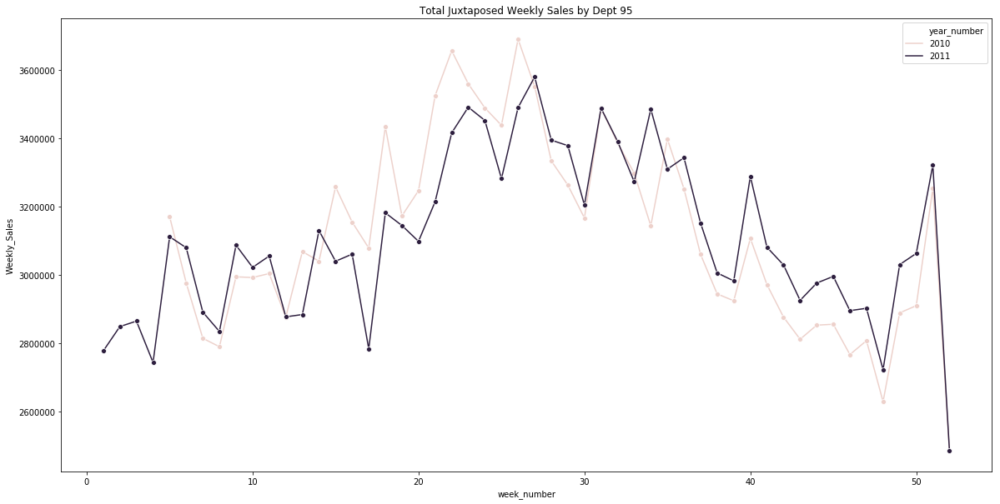

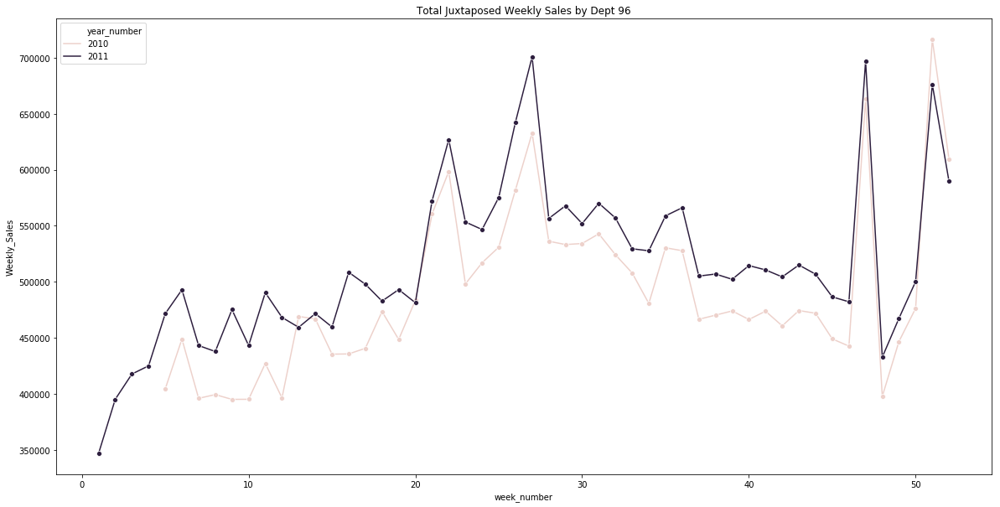

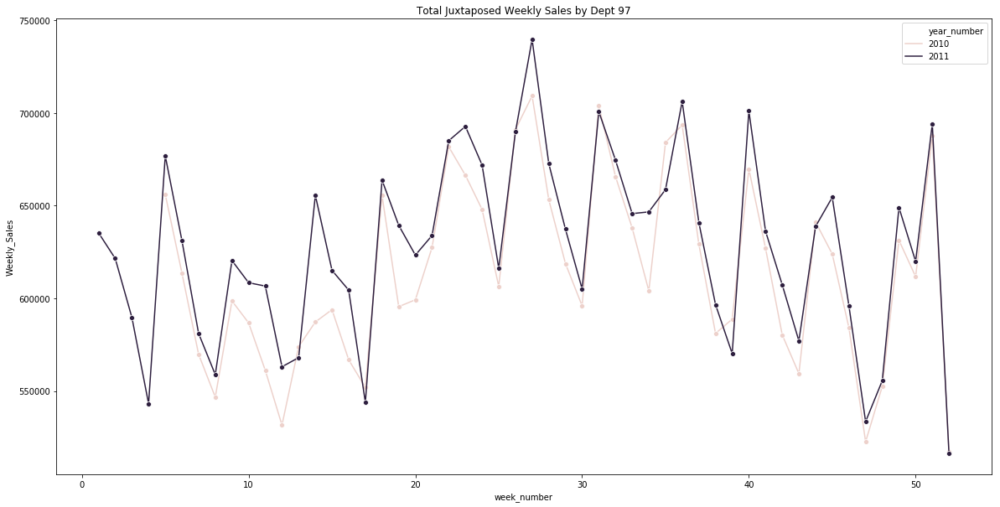

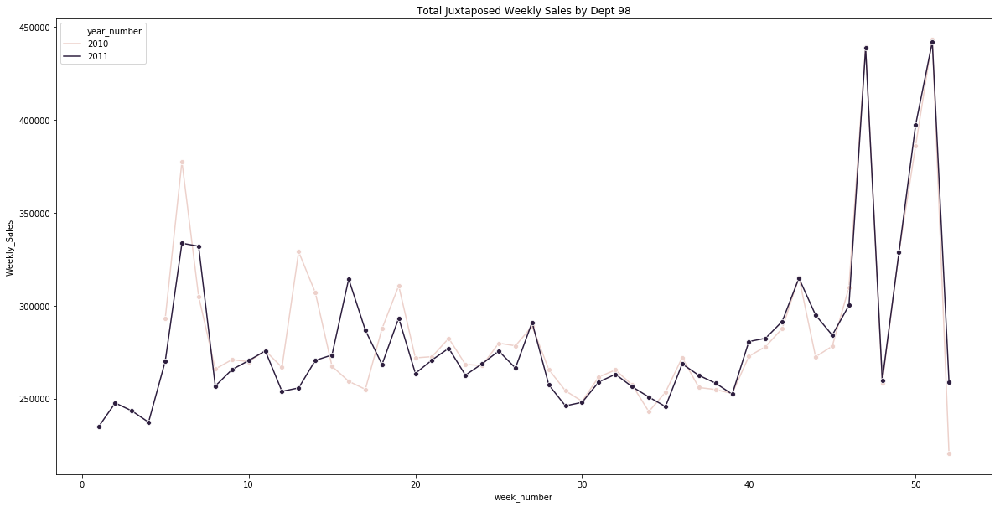

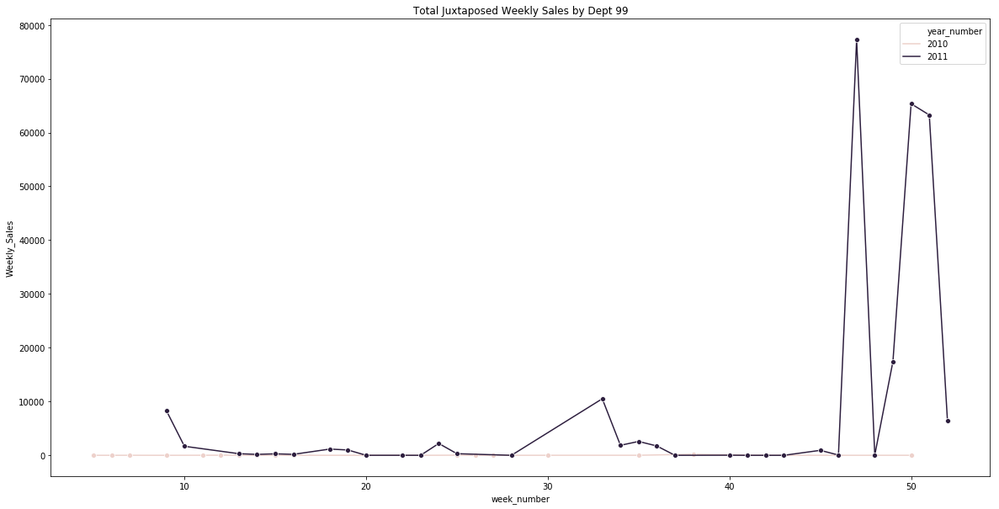

In [179]:
#Checking weekly Sales of different years juxtaposed..by Store and by Dept
for var in ['Store', 'Dept']:
    another_agg = combined_data_train.groupby([var, 'week_number', 'year_number', 'IsHoliday'], as_index=False).agg({ 'Weekly_Sales' : 'sum'})
    for idd in another_agg[var].unique() :
        temper = another_agg.loc[ another_agg[var] == idd ]
        print(temper.shape)
        plt.figure(figsize=(20,10))
        plt.title('Total Juxtaposed Weekly Sales by ' + var + " " + idd)
        sns.lineplot(x="week_number", y="Weekly_Sales", hue="year_number", data = temper, marker = 'o')


# Feature Creation

In [110]:
#marking the holiday names
conditions = [combined_data_train['IsHoliday'] == 0, combined_data_train['week_number'] == 52, combined_data_train['week_number'] == 47, \
             combined_data_train['week_number'] == 36, combined_data_train['week_number'] == 6]
choices = ['no_holiday', 'christmas', 'thanksgiving', 'labor_day', 'super_bowl']
combined_data_train['holiday_type' ] = np.select(conditions, choices, default=np.nan)
combined_data_train['holiday_type'].value_counts()

/var/folders/70/xyz7khq54gx8qklx52wtt6tw0000gn/T/ipykernel_57814/2458962466.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  combined_data_train['holiday_type' ] = np.select(conditions, choices, default=np.nan)


no_holiday      269595
thanksgiving      5946
christmas         5909
super_bowl        5879
labor_day         5875
Name: holiday_type, dtype: int64

In [111]:
#function to create sales rush weeks 
#getting it into a function running on the train and test data
def season_variables(df):
    df['week_number'] = df['Date2'].dt.week
    df['year_number'] = df['Date2'].dt.year
    conditions = [df['IsHoliday'] == 0, df['week_number'] == 52, df['week_number'] == 47, \
                 df['week_number'] == 36, df['week_number'] == 6]
    choices = ['no_holiday', 'christmas', 'thanksgiving', 'labor_day', 'super_bowl']
    df['holiday_type' ] = np.select(conditions, choices, default=np.nan)
    print(df['holiday_type'].value_counts())
    christmas_df = pd.DataFrame(df[df['holiday_type'] == 'christmas' ]['Date2'].unique())
    christmas_df.columns = ['christmas_week']
    christmas_df['minus1'] = christmas_df['christmas_week'] -  pd.to_timedelta(7, unit='d')
    christmas_df['minus2'] = christmas_df['christmas_week'] -  pd.to_timedelta(14, unit='d')
    christmas_df['minus3'] = christmas_df['christmas_week'] -  pd.to_timedelta(21, unit='d')
    #creating all the 5 binary variables
    df['christmas_week'] = np.where(df['Date2'].isin(list(christmas_df['christmas_week']) ),1,0 )
    df['christmas_minus1'] = np.where(df['Date2'].isin(list(christmas_df['minus1']) ),1,0 )
    df['christmas_minus2'] = np.where(df['Date2'].isin(list(christmas_df['minus2']) ),1,0 )
    df['christmas_minus3'] = np.where(df['Date2'].isin(list(christmas_df['minus3']) ),1,0 )
    df['thanksgiving_week'] = np.where(df['holiday_type'] == 'thanksgiving', 1, 0)
    print(df['christmas_week'].value_counts())
    print(df['christmas_minus1'].value_counts())
    print(df['christmas_minus2'].value_counts())
    print(df['christmas_minus3'].value_counts())
    print(df['thanksgiving_week'].value_counts())
    return df

In [112]:
combined_data_train = season_variables(combined_data_train)

/var/folders/70/xyz7khq54gx8qklx52wtt6tw0000gn/T/ipykernel_57814/1127882343.py:4: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['week_number'] = df['Date2'].dt.week
/var/folders/70/xyz7khq54gx8qklx52wtt6tw0000gn/T/ipykernel_57814/1127882343.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['week_number'] = df['Date2'].dt.week
/var/folders/70/xyz7khq54gx8qklx52wtt6tw0000gn/T/ipykernel_57814/1127882343.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.htm

no_holiday      269595
thanksgiving      5946
christmas         5909
super_bowl        5879
labor_day         5875
Name: holiday_type, dtype: int64
0    287295
1      5909
Name: christmas_week, dtype: int64
0    287234
1      5970
Name: christmas_minus1, dtype: int64
0    287251
1      5953
Name: christmas_minus2, dtype: int64
0    287266
1      5938
Name: christmas_minus3, dtype: int64
0    287258
1      5946
Name: thanksgiving_week, dtype: int64


/var/folders/70/xyz7khq54gx8qklx52wtt6tw0000gn/T/ipykernel_57814/1127882343.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['christmas_week'] = np.where(df['Date2'].isin(list(christmas_df['christmas_week']) ),1,0 )
/var/folders/70/xyz7khq54gx8qklx52wtt6tw0000gn/T/ipykernel_57814/1127882343.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['christmas_minus1'] = np.where(df['Date2'].isin(list(christmas_df['minus1']) ),1,0 )
/var/folders/70/xyz7khq54gx8qklx52wtt6tw0000gn/T/ipykernel_57814/1127882

In [113]:
combined_data_test = season_variables(combined_data_test)

no_holiday    121057
super_bowl      2994
labor_day       2957
Name: holiday_type, dtype: int64
0    127008
Name: christmas_week, dtype: int64
0    127008
Name: christmas_minus1, dtype: int64
0    127008
Name: christmas_minus2, dtype: int64
0    127008
Name: christmas_minus3, dtype: int64
0    127008
Name: thanksgiving_week, dtype: int64


/var/folders/70/xyz7khq54gx8qklx52wtt6tw0000gn/T/ipykernel_57814/1127882343.py:4: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['week_number'] = df['Date2'].dt.week
/var/folders/70/xyz7khq54gx8qklx52wtt6tw0000gn/T/ipykernel_57814/1127882343.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['week_number'] = df['Date2'].dt.week
/var/folders/70/xyz7khq54gx8qklx52wtt6tw0000gn/T/ipykernel_57814/1127882343.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.htm

In [114]:
#Creating another feature..Prediction based on Store and Dept
store_dept_median = combined_data_train.groupby(['Store', 'Dept'], as_index=False).agg({'Weekly_Sales' :  ['median']})
print(store_dept_median.shape)
store_dept_median.columns = ["_".join(x) for x in store_dept_median.columns.ravel()]
store_dept_median.columns = ['Store', 'Dept', 'Weekly_Sales_median']
print(store_dept_median.head())


(3292, 3)
  Store Dept  Weekly_Sales_median
0     1    1            18988.700
1     1   10            30870.720
2     1   11            23574.725
3     1   12            10607.065
4     1   13            37848.040


/var/folders/70/xyz7khq54gx8qklx52wtt6tw0000gn/T/ipykernel_57814/3015176126.py:4: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  store_dept_median.columns = ["_".join(x) for x in store_dept_median.columns.ravel()]


In [115]:
#Adding the feature into train and test data
print(combined_data_train.shape)
combined_data_train2 = pd.merge(combined_data_train, store_dept_median, on=['Store', 'Dept'], how='left')
print(combined_data_train2.shape)
print(combined_data_test.shape)
combined_data_test2 = pd.merge(combined_data_test, store_dept_median, on=['Store', 'Dept'], how='left')
print(combined_data_test2.shape)

(293204, 25)
(293204, 26)
(127008, 25)
(127008, 26)


In [116]:
#Filling the few missing values for new feature in test data with mean
combined_data_test2['Weekly_Sales_median'].fillna(combined_data_test2['Weekly_Sales_median'].mean() , inplace=True)

# Modeling

# Prediction 1

In [117]:
#Prediction based on Store, Dept and Week
simple_prediction = combined_data_train.groupby(['Store', 'Dept', 'week_number'], as_index=False).agg({'Weekly_Sales' :  ['mean', 'count' ]})
print(simple_prediction.shape)
simple_prediction.columns = ["_".join(x) for x in simple_prediction.columns.ravel()]
simple_prediction = simple_prediction.drop(['Weekly_Sales_count'], axis=1)
simple_prediction.columns = ['Store', 'Dept', 'week_number', 'Sales_prediction']
simple_prediction['prediction_type'] = 1
simple_prediction.head()

(155979, 5)


/var/folders/70/xyz7khq54gx8qklx52wtt6tw0000gn/T/ipykernel_57814/4272619903.py:4: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  simple_prediction.columns = ["_".join(x) for x in simple_prediction.columns.ravel()]


,Store,Dept,week_number,Sales_prediction,prediction_type
0,1,1,1,15984.24,1
1,1,1,2,17359.70,1
2,1,1,3,17341.47,1
3,1,1,4,18461.18,1
4,1,1,5,23295.13,1


In [118]:
pd.merge(combined_data_test, simple_prediction, on = ['Store', 'Dept', 'week_number']).shape

(124366, 27)

In [119]:
#Prediction based on Dept..since previous prediction will miss required combinations..
#this is being done to provide approximation for sales in a dept irrespective of size 
moresimple_prediction = combined_data_train.groupby(['Dept'], as_index=False).agg({'Weekly_Sales' :  ['mean', 'count' ]})
print(moresimple_prediction.shape)
moresimple_prediction.columns = ["_".join(x) for x in moresimple_prediction.columns.ravel()]
print(moresimple_prediction['Weekly_Sales_count'].describe())
moresimple_prediction = moresimple_prediction.drop(['Weekly_Sales_count'], axis=1)
moresimple_prediction.columns = ['Dept', 'Sales_prediction']
moresimple_prediction['prediction_type'] = 2
moresimple_prediction.head()

(81, 3)
count      81.000000
mean     3619.802469
std      1331.333180
min         6.000000
25%      3705.000000
50%      4115.000000
75%      4500.000000
max      4500.000000
Name: Weekly_Sales_count, dtype: float64


/var/folders/70/xyz7khq54gx8qklx52wtt6tw0000gn/T/ipykernel_57814/1335620719.py:5: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  moresimple_prediction.columns = ["_".join(x) for x in moresimple_prediction.columns.ravel()]


,Dept,Sales_prediction,prediction_type
0,1,19598.410840,2
1,10,18246.069967,2
2,11,14668.411385,2
3,12,4151.166962,2
4,13,30624.612680,2


In [120]:
#making sure there is no more than one entry for this combo
def score_direct(df_to_score, pred_df1, pred_df2):
    """
    We will use the 2 set of predictions made to estimate sales on the test data 
    """
    df_to_score['week_number'] =  df_to_score['Date2'].dt.week
    df_input = df_to_score[['Store', 'Dept', 'Date2',  'week_number']]
    print(df_input.shape)
    #checking if there is only 1 entry per combination being used to predict (i.e. Store, Dept, Week Number)
    print( df_input.groupby(['Store', 'Dept', 'week_number']).size().shape )
    #Using prediction1 and separate out combinations that remain unscored
    df_scored = pd.merge(df_input, pred_df1, on= ['Store', 'Dept', 'week_number'], how='left')
    df_present = df_scored[ pd.isnull(df_scored['prediction_type']) ==False ]
    df_missed =  df_scored[ pd.isnull(df_scored['prediction_type']) ]
    df_missed = df_missed.drop(['Sales_prediction', 'prediction_type'], axis=1)
    #using prediction2 to score the unscored test data
    df_missed_scored = pd.merge(df_missed, pred_df2, on= ['Dept'], how='left')
    print(df_missed_scored['prediction_type'].isna().sum())    
    #getting the scored test data in single DF
    df_full_scored = pd.concat( [df_present, df_missed_scored ] , axis=0)
    print(df_full_scored.shape)
    print(df_full_scored['prediction_type'].value_counts() )
    return df_full_scored

In [121]:
test_full_scored = score_direct(combined_data_test, simple_prediction, moresimple_prediction)

(127008, 4)
(127008,)
0
(127008, 6)
1.0    124366
2.0      2642
Name: prediction_type, dtype: int64


/var/folders/70/xyz7khq54gx8qklx52wtt6tw0000gn/T/ipykernel_57814/4267813546.py:6: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df_to_score['week_number'] =  df_to_score['Date2'].dt.week
/var/folders/70/xyz7khq54gx8qklx52wtt6tw0000gn/T/ipykernel_57814/4267813546.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_to_score['week_number'] =  df_to_score['Date2'].dt.week


# Prediction 2 - Random Forest Regression

In [122]:
#doing ohe of the categorical variables 
cat_columns = ['Type']
combined_data_train2 = pd.concat([combined_data_train2, pd.get_dummies(combined_data_train2[cat_columns], drop_first=True)], axis=1)
combined_data_test2 = pd.concat([combined_data_test2, pd.get_dummies(combined_data_test2[cat_columns], drop_first=True)], axis=1)

In [123]:
columnstodrop = ['Type' , 'Store', 'Dept', 'Date', 'Date2', 'Weekly_Sales', 'holiday_type', 'week_number', 'year_number']
X_train = combined_data_train2.drop(columnstodrop, axis = 1 )
X_test = combined_data_test2.drop(columnstodrop, axis = 1 )
print(X_train.shape)
print(X_test.shape)

(293204, 19)
(127008, 19)


In [124]:
#MarkDown4, 5  found to be over 60% correlated to other markdown variables
X_train = X_train.drop(['MarkDown4', 'MarkDown5'], axis = 1 )
X_test = X_test.drop(['MarkDown4', 'MarkDown5'], axis = 1 )


In [125]:
Y_train = combined_data_train2['Weekly_Sales']
Y_test = combined_data_test2['Weekly_Sales']
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

In [126]:
# RFR with hyper-parameter tuning
import time
aa = time.time()
rfr = RandomForestRegressor(random_state=42,  n_jobs = -1, max_depth = 5)#criterion = 'mse',
param_grid = { 
'n_estimators': [50, 100, 200]
}
CV_rfr = GridSearchCV(estimator = rfr, param_grid=param_grid, cv= 3)
CV_rfr.fit(X_train, Y_train)
rfr_best = CV_rfr.best_estimator_
print(rfr_best)
print(time.time() - aa)

RandomForestRegressor(max_depth=5, n_estimators=200, n_jobs=-1, random_state=42)
47.4393048286438


In [137]:
#important features
def get_FI(modelname, dfname):
    importance_list = pd.DataFrame(modelname.feature_importances_, columns=['importance'])
    varnames_list = pd.DataFrame(dfname.columns.tolist(), columns=['feature'])
    feature_importance = pd.concat([varnames_list, importance_list], axis=1)
    feature_importance = feature_importance.sort_values(by=['importance'], ascending=False)
    feature_importance['cum_importance'] = feature_importance['importance'].cumsum()
    return feature_importance

In [138]:
get_FI(rfr_best, X_train)

,feature,importance,cum_importance
14,Weekly_Sales_median,9.887667e-01,0.988767
10,christmas_minus1,6.642961e-03,0.995410
5,MarkDown3,2.713246e-03,0.998123
13,thanksgiving_week,1.440787e-03,0.999564
8,Size,2.606776e-04,0.999824
15,Type_B,7.955870e-05,0.999904
7,Unemployment,6.226944e-05,0.999966
1,Temperature,1.766254e-05,0.999984
3,MarkDown1,1.042452e-05,0.999994
6,CPI,5.580825e-06,1.000000


# Prediction 3 - ARIMA, another statistical technique

In [139]:
sales_data2.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,2010-02-05,24924.50,0
1,1,1,2010-02-12,46039.49,1
2,1,1,2010-02-19,41595.55,0
3,1,1,2010-02-26,19403.54,0
4,1,1,2010-03-05,21827.90,0


In [140]:
#Taking a example randomly to showcase ARIMA
particular_data = sales_data2.loc[(sales_data2['Store'] == '13') & (sales_data2['Dept'] == '17'), \
                                          ['Date', 'Weekly_Sales']   ]
particular_data['Date'] =  pd.to_datetime(particular_data['Date'])
particular_data.index = particular_data.Date
particular_data = particular_data.drop('Date', axis=1)
particular_data.head()

,Weekly_Sales
Date,
2010-02-05,22419.66
2010-02-12,21524.01
2010-02-19,23997.80
2010-02-26,22936.01
2010-03-05,21831.50


In [141]:
particular_data_train, particular_data_test  = particular_data[particular_data.index <= split_date],  particular_data[particular_data.index > split_date]
print(particular_data_train.shape)
print(particular_data_test.shape)

(100, 1)
(43, 1)


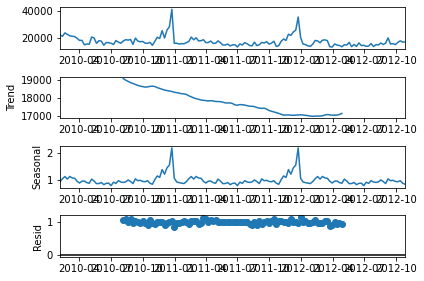

In [149]:
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(particular_data, model='multiplicative')
fig = result.plot()

In [150]:
from pandas.plotting import autocorrelation_plot

<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

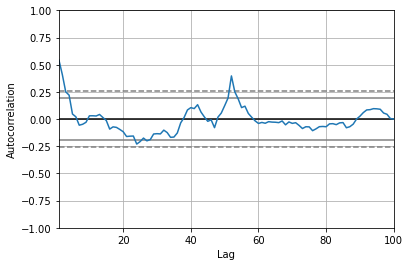

In [151]:
autocorrelation_plot(particular_data_train)

                               SARIMAX Results                                
Dep. Variable:           Weekly_Sales   No. Observations:                  100
Model:                 ARIMA(0, 1, 0)   Log Likelihood                -959.407
Date:                Mon, 29 Aug 2022   AIC                           1920.813
Time:                        10:10:57   BIC                           1923.408
Sample:                    02-05-2010   HQIC                          1921.863
                         - 12-30-2011                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      1.516e+07   6.77e+05     22.375      0.000    1.38e+07    1.65e+07
Ljung-Box (L1) (Q):                  14.55   Jarque-Bera (JB):              1415.18
Prob(Q):                              0.00   Pr

/opt/homebrew/Caskroom/miniforge/base/envs/tensorflow/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
/opt/homebrew/Caskroom/miniforge/base/envs/tensorflow/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
/opt/homebrew/Caskroom/miniforge/base/envs/tensorflow/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


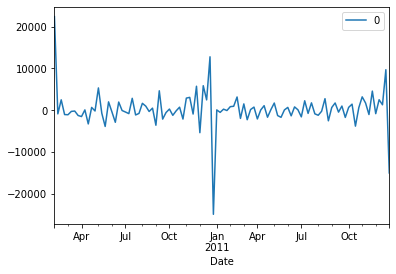

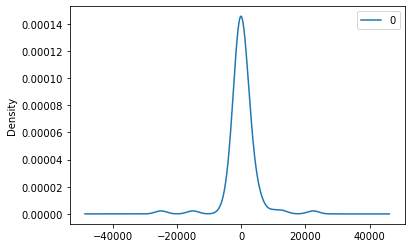

                  0
count    100.000000
mean     206.070400
std     4510.473031
min   -24984.130000
25%    -1117.455000
50%       45.340000
75%     1529.545000
max    22419.660000


In [155]:
#Running ARIMA model
# from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.arima.model import ARIMA
# fit model
model = ARIMA(particular_data_train, order=(0,1,0))
model_fit = model.fit()
print(model_fit.summary())
# plot residual errors
residuals = pd.DataFrame(model_fit.resid)
residuals.plot()
plt.show()
residuals.plot(kind='kde')
plt.show()
print(residuals.describe())

In [157]:
!pip install pmdarima

     |████████████████████████████████| 577 kB 3.1 MB/s eta 0:00:01
     |████████████████████████████████| 986 kB 12.9 MB/s eta 0:00:01


In [158]:
# Install pyramid using
# pip install --user pmdarima
#Hyper Parameter Tuning of ARIMA model..No seasonality taken.
from pmdarima import auto_arima
auto_model = auto_arima(particular_data_train, start_p=1, d=0, start_q=1,
                           max_p=3, max_q=3, m=1,
                           start_P=0, seasonal=False,
                           D=None, trace=True,
                           error_action='ignore'
                           )#suppress_warnings=True
auto_model.fit(particular_data_train)
print(auto_model)
test_arima = auto_model.predict(n_periods= len(particular_data_test))


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1926.145, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2255.538, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1944.558, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=2192.542, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=1927.869, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=1928.393, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=2083.681, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=1928.596, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1917.784, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1931.343, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1918.348, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1918.023, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1919.181, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : 

In [159]:
sales_data_train = combined_data_train[['Store', 'Dept', 'Date2', 'Weekly_Sales']]
sales_data_test = combined_data_test[['Store', 'Dept', 'Date2', 'Weekly_Sales']]

In [160]:
#checking the number of records for each store, dept combination
temper = sales_data_train.groupby(['Store', 'Dept'], as_index=False).agg({'Date2': 'count' })
temper = temper.rename(columns= {'Date2' : 'counter'})
temper.head()
temper2 = temper.groupby(['counter'], as_index=False).agg({'Store': 'count' })
temper2

,counter,Store
0,1,40
1,2,40
2,3,21
3,4,29
4,5,14
...,...,...
93,96,6
94,97,9
95,98,23
96,99,31


In [161]:
temper.shape

(3292, 3)

In [162]:
from sklearn.metrics import mean_absolute_error

In [163]:
def arima_modeler(df_train, df_test):
    """
    Now we will create a function to create these models after hyper-parameter tuning for all the combinations of Store and Dept
    in the data    
    """
    combos_train = df_train.groupby(['Store', 'Dept'], as_index=False).agg({'Date2' : {'min', 'max', 'count'} })
    print(combos_train.shape)
    combos_test = df_test.groupby(['Store', 'Dept'], as_index=False).agg({'Date2' :  'count' })
    combos_test = combos_test[['Store', 'Dept']]
    print(combos_test.shape)
    combos_common = pd.merge(combos_train, combos_test, on = ['Store', 'Dept'])
    print(combos_common.shape)
    combos_common.columns = ["_".join(x) for x in combos_common.columns.ravel()]
    combos_common = combos_common.rename(columns = {'Store_' : 'Store', 'Dept_' : 'Dept'})
    combos_common['total_weeks'] = (combos_common['Date2_max'] - combos_common['Date2_min']).astype('timedelta64[D]')/7 + 1
    combos_common['date_gap'] = combos_common['total_weeks'] - combos_common['Date2_count']
    combos_common_nogap = combos_common.loc[combos_common['date_gap'] ==0 ]
    print(combos_common_nogap.shape)
    combos_common_nogap = combos_common_nogap.loc[combos_common_nogap['Date2_max'] == split_date ]
    combos_common_nogap = combos_common_nogap.loc[combos_common_nogap['Date2_count'] == 100 ]
    combos_common_nogap = combos_common_nogap.sort_values(by=['Store', 'Dept'])
    combos_common_nogap.reset_index(inplace=True)
    print(combos_common_nogap.shape)
    print(combos_common_nogap.head(10))
    
    sales_data_train_nogap = pd.merge(df_train, combos_common_nogap[['Store', 'Dept']], on =  ['Store', 'Dept'] )
    print(sales_data_train_nogap.shape)
    sales_data_test_nogap = pd.merge(df_test, combos_common_nogap[['Store', 'Dept']], on =  ['Store', 'Dept'] )
    print(sales_data_test_nogap.shape)#The remaining data cant be predicted

    sales_data_train_nogap = sales_data_train_nogap.sort_values(by=['Store', 'Dept', 'Date2'])
    sales_data_test_nogap = sales_data_test_nogap.sort_values(by=['Store', 'Dept', 'Date2'])
#     sales_data_test_nogap = sales_data_test_nogap[0:10000]
    
    #creating a DF that will store all the model outputs
    all_scores = pd.DataFrame(columns = ['score'])

    for i in range(len(combos_common_nogap)):#
        print(i)
        store_id = combos_common_nogap.loc[i]['Store']
        dept_id = combos_common_nogap.loc[i]['Dept']    
        print("Now the model for Store " + store_id + " and Dept " + dept_id + " will be created")
        particular_data_train = sales_data_train_nogap.loc[(sales_data_train_nogap['Store'] == store_id) & (sales_data_train_nogap['Dept'] == dept_id), \
                                              ['Date2', 'Weekly_Sales']   ]
        print(particular_data_train.shape)
        particular_data_test = sales_data_test_nogap.loc[(sales_data_test_nogap['Store'] == store_id) & (sales_data_test_nogap['Dept'] == dept_id), \
                                                  ['Date2', 'Weekly_Sales']   ]#, 'Weekly_Sales'
        print(particular_data_test.shape)
        #The date is required as index for ARIMA models
        particular_data_train.index = particular_data_train.Date2
        particular_data_test.index = particular_data_test.Date2

        particular_data_train = particular_data_train.drop('Date2', axis=1)
        particular_data_test = particular_data_test.drop('Date2', axis=1)
        
        #Hyper Parameter tuning
        auto_model = auto_arima(particular_data_train, start_p=1, d=0, start_q=1,max_p=3, max_q=3, start_P=0, trace=True)
        auto_model.fit(particular_data_train)
        print(auto_model)
        test_arima = auto_model.predict(n_periods=len(particular_data_test))
        test_arima_df  = pd.DataFrame(test_arima, columns = ['score'] )
        #appending the new scores along with the scores already obtained
        all_scores = pd.concat([all_scores, test_arima_df], axis=0)
        all_scores = all_scores.reset_index()
        all_scores = all_scores.drop(['index'], axis=1)
        print(mean_absolute_error(particular_data_test, test_arima))
    
    #getting the model scores and actuals in one file for comparison
    sales_data_test2 = sales_data_test_nogap.reset_index()
    sales_data_test2 = sales_data_test2.drop(['index'], axis=1)
    print(sales_data_test2.head())
    test_data_scored = pd.concat([sales_data_test2, all_scores], axis=1)
    return test_data_scored

In [164]:
partialtest_scored_arima = arima_modeler(sales_data_train, sales_data_test)

(3292, 5)
(3196, 2)
(3165, 5)
(2704, 7)
(2654, 8)
   index Store Dept  Date2_count  Date2_min  Date2_max  total_weeks  date_gap
0      0     1    1          100 2010-02-05 2011-12-30        100.0       0.0
1      1     1   10          100 2010-02-05 2011-12-30        100.0       0.0
2      2     1   11          100 2010-02-05 2011-12-30        100.0       0.0
3      3     1   12          100 2010-02-05 2011-12-30        100.0       0.0
4      4     1   13          100 2010-02-05 2011-12-30        100.0       0.0
5      5     1   14          100 2010-02-05 2011-12-30        100.0       0.0
6      6     1   16          100 2010-02-05 2011-12-30        100.0       0.0
7      7     1   17          100 2010-02-05 2011-12-30        100.0       0.0
8      9     1   19          100 2010-02-05 2011-12-30        100.0       0.0
9     10     1    2          100 2010-02-05 2011-12-30        100.0       0.0
(265400, 4)
(114020, 4)
0
Now the model for Store 1 and Dept 1 will be created
(100, 2)
(43,

/var/folders/70/xyz7khq54gx8qklx52wtt6tw0000gn/T/ipykernel_57814/24706857.py:11: FutureWarning: merging between different levels is deprecated and will be removed in a future version. (2 levels on the left,1 on the right)
  combos_common = pd.merge(combos_train, combos_test, on = ['Store', 'Dept'])
/var/folders/70/xyz7khq54gx8qklx52wtt6tw0000gn/T/ipykernel_57814/24706857.py:13: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  combos_common.columns = ["_".join(x) for x in combos_common.columns.ravel()]


 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2086.124, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2132.819, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2093.937, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2087.398, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2312.076, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2088.278, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2086.511, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2084.936, Time=0.01 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=2086.462, Time=0.02 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=2089.764, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=2170.255, Time=0.04 sec

Best model:  ARIMA(0,0,2)(0,0,0)[0] intercept
Total fit time: 0.218 seconds
 ARIMA(0,0,2)(0,0,0)[0] intercept
5475.190273948609
1
Now the model for Store 1 and Dept 10 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] inter

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1948.088, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1623.750, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1624.454, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1629.295, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1622.415, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1622.938, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1624.842, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.203 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
740.3062551845081
11
Now the model for Store 1 and Dept 21 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1677.858, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1691.533, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1677.363, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept

 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2010.976, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1994.994, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1996.888, Time=0.01 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1998.793, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=2005.248, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.186 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
5704.122465878246
21
Now the model for Store 1 and Dept 30 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1549.214, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1624.589, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1558.689, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1595.144, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1925.901, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1546.201, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0] inte

 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1886.593, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1888.568, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.138 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
2217.7026398270505
31
Now the model for Store 1 and Dept 40 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1914.156, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1963.195, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1918.439, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1939.740, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2480.091, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1914.177, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1914.179, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1925.000, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercep

5508.602982012997
40
Now the model for Store 1 and Dept 56 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1767.301, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1951.380, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1765.354, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1872.679, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2013.207, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1767.186, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1767.700, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1765.548, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.108 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
3080.8120308944626
41
Now the model for Store 1 and Dept 58 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1753.232, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] 

 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1993.918, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1996.395, Time=0.05 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=1986.200, Time=0.03 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1987.737, Time=0.03 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=2290.321, Time=0.02 sec

Best model:  ARIMA(0,0,3)(0,0,0)[0] intercept
Total fit time: 0.204 seconds
 ARIMA(0,0,3)(0,0,0)[0] intercept
4919.172202861876
51
Now the model for Store 1 and Dept 8 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1809.177, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1809.785, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1807.271, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1809.055, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2377.528, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1805.872, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] inter

 ARIMA(3,0,3)(0,0,0)[0]             : AIC=2051.109, Time=0.09 sec

Best model:  ARIMA(3,0,3)(0,0,0)[0] intercept
Total fit time: 0.511 seconds
 ARIMA(3,0,3)(0,0,0)[0] intercept
4736.543885117099
60
Now the model for Store 1 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2013.233, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2015.393, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2014.976, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2004.817, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2496.697, Time=0.00 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2002.249, Time=0.01 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2002.711, Time=0.03 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=1980.598, Time=0.05 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1991.472, Time=0.04 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=2412.054, Time=0.01 sec

Best model:  ARIMA(0,0,3)(0

 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1996.737, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.127 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
4024.4640730451347
70
Now the model for Store 10 and Dept 12 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1651.196, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1711.627, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1656.540, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1680.686, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2112.770, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1652.663, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1652.419, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1671.363, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1652.371, Time=0.02 sec
 ARIMA(2,0,2)(0,0,0)[0] interce

 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1980.086, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1981.978, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.147 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
3816.600501340814
80
Now the model for Store 10 and Dept 23 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2218.354, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2246.528, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2218.292, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2229.477, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2514.093, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2216.818, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2218.723, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2218.815, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercep

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1792.393, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2053.192, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1764.296, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1764.296, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1768.860, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1762.229, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1762.958, Time=0.01 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1764.965, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1777.551, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.184 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
2067.636361063568
90
Now the model for Store 10 and Dept 32 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2129.197, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2150.385, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] int

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1994.937, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2066.836, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1998.988, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2033.801, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2183.225, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1994.951, Time=0.01 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1996.040, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2022.519, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1992.985, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1994.827, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1996.831, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1997.064, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.150 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
5359.623360025547
100
Now the model f

 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1578.481, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1622.788, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1747.472, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1574.218, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1573.543, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1601.523, Time=0.03 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1575.520, Time=0.03 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1575.423, Time=0.04 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=1586.312, Time=0.03 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=1577.411, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=1577.217, Time=0.03 sec

Best model:  ARIMA(1,0,2)(0,0,0)[0] intercept
Total fit time: 0.358 seconds
 ARIMA(1,0,2)(0,0,0)[0] intercept
936.2669234096206
110
Now the model for Store 10 and Dept 58 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] in

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1947.885, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1947.065, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.175 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
4624.5013638896135
119
Now the model for Store 10 and Dept 8 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1970.373, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1968.144, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1968.307, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1969.600, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2560.868, Time=0.00 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.048 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
2720.1889488372085
120
Now the model for Store 10 and Dept 80 will be created
(100, 2)
(43, 2)
Performing stepwise sea

 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1632.567, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1626.790, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2177.303, Time=0.00 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1626.715, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1628.873, Time=0.02 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=1629.012, Time=0.03 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1630.573, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=inf, Time=0.04 sec

Best model:  ARIMA(0,0,2)(0,0,0)[0] intercept
Total fit time: 0.250 seconds
 ARIMA(0,0,2)(0,0,0)[0] intercept
763.875638736636
129
Now the model for Store 10 and Dept 92 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1922.886, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1955.762, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1920.878, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercep

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1862.395, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1872.008, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1863.885, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1869.261, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2409.118, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1838.213, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1841.090, Time=0.09 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1839.556, Time=0.04 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1839.682, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1847.816, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1837.976, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0] intercept
Total fit time: 0.340 seconds
 ARIMA(3,0,0)(0,0,0)[0] intercept
2950.1656839674265
139
Now the model for Store 11 and Dept 14 will be created
(100, 2)
(43, 2)
Perform

 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1893.448, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1910.361, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.151 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
1807.8272034651557
148
Now the model for Store 11 and Dept 25 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1784.324, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1801.585, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1783.016, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1787.239, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2150.712, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1784.379, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1786.173, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1817.262, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.091 seconds
 ARIMA(1,0,0)(

(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1892.904, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1928.186, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1891.570, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1905.205, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2287.623, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1892.210, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1894.175, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1916.449, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.112 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
4248.096850683022
159
Now the model for Store 11 and Dept 35 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1607.719, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1642.200, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC

 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1750.932, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1755.573, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2081.398, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1752.721, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1754.845, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1782.803, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.098 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
1510.4233651939903
170
Now the model for Store 11 and Dept 5 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2208.802, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2235.732, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2211.542, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2222.827, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2415.221, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] in

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2335.029, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2345.388, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.078 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
8966.016958517968
179
Now the model for Store 11 and Dept 71 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1783.707, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1817.021, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1781.828, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1790.990, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2116.440, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1783.099, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1784.919, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1805.231, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.124 seconds
 ARIMA(1,0,0)(0

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1795.447, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1807.606, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1795.797, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1800.204, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2195.136, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1796.099, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1796.211, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1797.472, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1794.226, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1795.974, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1797.949, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.163 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
3050.048605156759
190
Now the model for St

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1817.978, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1844.986, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.117 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
1686.9999194796662
200
Now the model for Store 12 and Dept 1 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2083.614, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2116.038, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2086.172, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2082.967, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2265.312, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2082.569, Time=0.01 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2084.259, Time=0.01 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=2084.261, Time=0.01 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=2087.040, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0]   

 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1503.882, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1505.894, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.174 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
413.1981436819014
209
Now the model for Store 12 and Dept 2 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1927.565, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1958.849, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1928.981, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1940.602, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2525.267, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1929.052, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1928.814, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1937.546, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercep

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1303.575, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1386.101, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1306.938, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1344.552, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1657.878, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1305.468, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1305.514, Time=0.04 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1323.994, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1303.527, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1305.508, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1307.468, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.263 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
230.9125643145742
219
Now the model for Store 12 and Dept 29 will be created
(100, 2)
(43, 2)
Performi

 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1726.843, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1728.810, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1733.456, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.098 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
1676.7163365068948
228
Now the model for Store 12 and Dept 38 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2003.103, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2001.345, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2003.119, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2003.177, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2445.668, Time=0.00 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.045 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
10864.710562790691
229
Now the model for Store 12 and Dept 4 will be created
(100, 2)
(43, 2)
Performing stepwis

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2238.160, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2051.186, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2053.000, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2056.006, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2049.228, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2051.157, Time=0.01 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2053.160, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=2059.955, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.154 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
6149.651304060608
238
Now the model for Store 12 and Dept 56 will be created
(100, 2)
(42, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1535.192, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1670.973, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1537.576, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] in

 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1872.828, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.173 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
2870.99289748385
248
Now the model for Store 12 and Dept 8 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1804.423, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1821.033, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1805.911, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1811.676, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2415.459, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1804.827, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1804.738, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1808.669, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1803.689, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept

 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1576.756, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1585.970, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1578.062, Time=0.02 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1576.892, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1578.004, Time=0.02 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.218 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
770.9506483687655
257
Now the model for Store 12 and Dept 92 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1812.699, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1839.899, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1812.748, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1823.595, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2303.237, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1814.333, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[0] in

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1636.116, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1634.658, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1665.620, Time=0.03 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1635.105, Time=0.03 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1632.844, Time=0.02 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=1655.678, Time=0.03 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=1637.360, Time=0.04 sec

Best model:  ARIMA(1,0,3)(0,0,0)[0] intercept
Total fit time: 0.373 seconds
 ARIMA(1,0,3)(0,0,0)[0] intercept
932.1516806180097
266
Now the model for Store 13 and Dept 13 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1873.962, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1889.794, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1875.401, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] interce

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1978.874, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1982.011, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1982.751, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1977.178, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1978.729, Time=0.01 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1980.615, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1993.062, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.156 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
2604.3526449546357
275
Now the model for Store 13 and Dept 23 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2119.095, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2145.558, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2117.620, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2126.970, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]  

(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1772.198, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1821.060, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1771.548, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1782.445, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1968.881, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1771.819, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1773.886, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1787.078, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.104 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
1415.854899561401
285
Now the model for Store 13 and Dept 32 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1958.535, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1975.524, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC

 ARIMA(2,0,0)(0,0,0)[0] intercept
4256.961426904638
294
Now the model for Store 13 and Dept 41 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1796.055, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1860.802, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1794.056, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1816.231, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1944.496, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1796.066, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1798.024, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1802.099, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.115 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
1425.4021272530606
295
Now the model for Store 13 and Dept 42 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1609.782, 

 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2185.152, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2181.118, Time=0.02 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=2177.705, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=2186.720, Time=0.02 sec

Best model:  ARIMA(2,0,1)(0,0,0)[0] intercept
Total fit time: 0.221 seconds
 ARIMA(2,0,1)(0,0,0)[0] intercept
8942.184314081154
304
Now the model for Store 13 and Dept 56 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1913.518, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2073.195, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1911.959, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1997.404, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2125.294, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1913.215, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1914.829, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]   

 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1949.521, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1951.272, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1951.475, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1953.297, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.150 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
3182.0342532591826
314
Now the model for Store 13 and Dept 79 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1994.304, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1989.878, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1992.143, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1992.398, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2462.924, Time=0.00 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.048 seconds
 ARIMA(0,0,0)(0,0,0

 ARIMA(2,0,0)(0,0,0)[0] intercept
12248.633778623647
323
Now the model for Store 13 and Dept 90 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2112.206, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2161.844, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2126.557, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2145.974, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2613.376, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2107.445, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2111.473, Time=0.01 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2107.827, Time=0.03 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=2096.098, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2107.474, Time=0.03 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=2098.015, Time=0.06 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=2095.865, Time=0.06 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2404.366, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2275.123, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2275.806, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2274.616, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2273.076, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2275.098, Time=0.01 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2277.122, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=2295.762, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.152 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
14770.950083374255
333
Now the model for Store 14 and Dept 10 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1833.487, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1859.916, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1832.830, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] i

 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1786.401, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1784.842, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0] intercept
Total fit time: 0.253 seconds
 ARIMA(3,0,0)(0,0,0)[0] intercept
1668.8965114566913
342
Now the model for Store 14 and Dept 21 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1821.654, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1838.859, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1820.484, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1826.175, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2117.187, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1821.248, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1823.240, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]            

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2311.068, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2095.568, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2097.522, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2100.060, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.096 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
9435.662679615827
352
Now the model for Store 14 and Dept 30 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1665.425, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1765.294, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1680.738, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1724.554, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2063.425, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1665.938, Time=0.01 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1665.648, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0] in

1593.7581981043234
363
Now the model for Store 14 and Dept 42 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1669.242, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1683.340, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1669.009, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1675.818, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2084.359, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1663.612, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1664.791, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1665.041, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1664.908, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.172 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
1104.0184643921284
364
Now the model for Store 14 and Dept 44 will be created
(100, 2)
(43, 2)
P

 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1844.250, Time=0.01 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1846.200, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1855.065, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.163 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
3736.7062664509713
373
Now the model for Store 14 and Dept 59 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1873.310, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1945.162, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1872.682, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1895.845, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1962.085, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1872.817, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1874.834, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1873.928, Time=0.01 sec

Best model:  ARIMA(1,0,0

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1980.701, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1977.276, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1978.047, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1978.810, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2470.002, Time=0.01 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.055 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
6374.882286046523
383
Now the model for Store 14 and Dept 80 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1884.805, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1879.217, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1881.872, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1882.558, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2389.714, Time=0.01 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.058 seconds
 ARIMA(0,0,0)(0

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2112.921, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2504.359, Time=0.00 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.045 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
11406.179265116301
394
Now the model for Store 14 and Dept 94 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2077.418, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2132.722, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2101.993, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2120.671, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2512.873, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2051.266, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2057.722, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2052.570, Time=0.03 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=2043.132, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] i

 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2001.672, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2009.734, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2206.915, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2002.611, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2003.951, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2027.963, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.098 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
2754.3439115705614
404
Now the model for Store 15 and Dept 16 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2047.431, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2201.718, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2045.638, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2120.789, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2268.305, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] i

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1756.041, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1768.779, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1757.081, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1762.485, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2006.097, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1755.231, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1753.266, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1755.199, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1757.196, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1770.929, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.131 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
1221.2952314140275
415
Now the model for Store 15 and Dept 27 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] interce

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1594.126, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1874.364, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1588.586, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1589.137, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1591.617, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1586.739, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1588.042, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1589.966, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1603.505, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.198 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
611.6774126192407
425
Now the model for Store 15 and Dept 36 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1590.006, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1639.938, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] in

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2169.246, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2170.847, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2176.806, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2168.521, Time=0.01 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=2169.929, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=2171.838, Time=0.01 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.140 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
7850.946779153373
435
Now the model for Store 15 and Dept 50 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1584.474, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1583.163, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1582.382, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1582.381, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1830.439, Time=0.00 sec
 ARIMA(0,0,2)(0,0,0)[0] in

 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1827.624, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1829.331, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1880.537, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.102 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
1802.5128095099735
445
Now the model for Store 15 and Dept 79 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1677.581, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1685.356, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1677.647, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1680.655, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2096.392, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1676.737, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1674.847, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1675.245, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] i

 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1426.455, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1428.482, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=1801.086, Time=0.02 sec

Best model:  ARIMA(0,0,1)(0,0,0)[0] intercept
Total fit time: 0.157 seconds
 ARIMA(0,0,1)(0,0,0)[0] intercept
180.6514791675468
455
Now the model for Store 15 and Dept 92 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1789.807, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1842.990, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1796.178, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1816.836, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2246.416, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1790.150, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1790.387, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1799.720, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] in

 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1549.080, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1550.703, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.218 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
878.5234708248737
464
Now the model for Store 16 and Dept 13 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1692.417, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1797.660, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1693.982, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1748.566, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2213.855, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1692.170, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1690.728, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1691.402, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] interce

 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1887.791, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1903.978, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2161.312, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1888.985, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1891.021, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1908.110, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.092 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
1479.2443452274613
474
Now the model for Store 16 and Dept 24 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1622.364, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1657.517, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1621.685, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1634.926, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1852.322, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] i

 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1802.128, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1804.157, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1821.340, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.091 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
938.8743355206985
484
Now the model for Store 16 and Dept 33 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1590.186, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1611.414, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1588.463, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1595.882, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1837.048, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1589.483, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1589.578, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1617.236, Time=0.01 sec

Best model:  ARIMA(1,0,0)

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1841.012, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1920.899, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1839.072, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1866.165, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2210.323, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1840.946, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1842.997, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1851.827, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.140 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
3025.2468637874954
495
Now the model for Store 16 and Dept 5 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2087.605, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2109.132, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2087.574, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] in

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1590.152, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1640.649, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1591.466, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1615.817, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2016.944, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1584.165, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1586.581, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1585.628, Time=0.03 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1585.691, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1588.156, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1584.172, Time=0.02 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1586.621, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=1597.257, Time=0.05 sec

Best model:  ARIMA(2,0,1)(0,0,0)[0] intercept
Total fit time: 0.331 seconds
 ARIM

 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1866.540, Time=0.07 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1835.127, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1837.065, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1839.066, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.247 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
2986.269698956775
514
Now the model for Store 16 and Dept 95 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1857.444, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1988.890, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1855.392, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1921.767, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2320.767, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1857.391, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] interce

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1938.156, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1934.979, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1936.981, Time=0.01 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1936.964, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=inf, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=1937.487, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0]          
Total fit time: 0.361 seconds
 ARIMA(1,0,0)(0,0,0)[0]          
12937.4481751725
524
Now the model for Store 17 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1835.868, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1854.741, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1838.182, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1846.507, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2145.817, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercep

 ARIMA(1,0,1)(0,0,0)[0] intercept
1257.3781608814259
534
Now the model for Store 17 and Dept 27 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1516.905, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1554.081, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1517.903, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1529.116, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1745.393, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1518.471, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1518.331, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1523.545, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1516.785, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1518.268, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1520.265, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1526.230, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0]

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1523.659, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1536.302, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1525.397, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1529.478, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1773.756, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1523.979, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1523.406, Time=0.04 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1526.424, Time=0.02 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.07 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1525.001, Time=0.04 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=1526.540, Time=0.03 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=1530.856, Time=0.08 sec

Best model:  ARIMA(1,0,2)(0,0,0)[0] intercept
Total fit time: 0.478 seconds
 ARIMA(1,0,2)(0

 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2011.993, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2026.246, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2184.071, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1998.182, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1996.468, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1998.289, Time=0.01 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1999.605, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=2003.887, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.133 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
5293.183716199499
554
Now the model for Store 17 and Dept 59 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1360.162, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1430.317, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1361.214, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] in

 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1365.299, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1302.809, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1332.163, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1618.683, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1300.076, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1300.003, Time=0.05 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1314.159, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1298.197, Time=0.02 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1301.556, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1305.425, Time=0.02 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.268 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
166.57676478827963
565
Now the model for Store 17 and Dept 81 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1810.913, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] i

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1765.588, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1765.347, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1768.894, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1764.079, Time=0.04 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1766.133, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1771.481, Time=0.03 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.256 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
3015.4041617150274
573
Now the model for Store 17 and Dept 92 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2129.371, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2136.272, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2128.750, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2131.472, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2450.624, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] i

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2046.712, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2059.691, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2046.770, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2051.962, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2306.351, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2047.754, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2049.873, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2049.290, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2045.975, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2047.545, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2049.360, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=2065.796, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.161 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
4904.128673643325
583
Now the model for Store 18 and Dept 16 will be created
(100, 2)
(43, 2)
Per

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1898.435, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1910.381, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1897.006, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1901.967, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2127.315, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1897.127, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1898.769, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1930.768, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.085 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
2357.756395982829
592
Now the model for Store 18 and Dept 25 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1882.016, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1894.658, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1880.064, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] in

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1881.141, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1909.953, Time=0.23 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.312 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
2265.4947112693017
602
Now the model for Store 18 and Dept 34 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1947.534, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1998.338, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1953.189, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1977.483, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2281.048, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1948.395, Time=0.01 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1948.476, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1960.648, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1947.434, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] i

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1995.940, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2015.998, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.092 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
3680.7239581364283
612
Now the model for Store 18 and Dept 49 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1864.006, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1886.480, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1865.063, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1873.095, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2152.195, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1863.907, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1862.200, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1861.448, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1863.114, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0]  

(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1895.015, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1930.550, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1895.178, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1897.641, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2114.253, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1895.733, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1896.763, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1894.607, Time=0.03 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=1896.828, Time=0.01 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1898.088, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=1982.029, Time=0.03 sec

Best model:  ARIMA(0,0,2)(0,0,0)[0] intercept
Total fit time: 0.198 seconds
 ARIMA(0,0,2)(0,0,0)[0] intercept
2687.1843635093524
621
Now the model for Store 18 and Dept 7 will be created
(100, 2)
(43, 2)
Performing stepwis

 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1614.671, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1613.128, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1805.524, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1607.255, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1604.934, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1606.518, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1608.531, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1631.858, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.175 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
399.25046439408464
630
Now the model for Store 18 and Dept 87 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1871.860, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1882.334, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1872.266, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] i

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1708.054, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2046.497, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1659.851, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1665.327, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.150 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
841.3415702457146
640
Now the model for Store 19 and Dept 13 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1859.574, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1922.767, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1862.796, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1891.027, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2376.413, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1860.819, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[0] interce

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1869.039, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2192.095, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1855.149, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1855.157, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1875.392, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.095 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
2341.5210831637555
651
Now the model for Store 19 and Dept 26 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1804.760, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1829.519, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1804.652, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1814.197, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2090.980, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1803.406, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] i

 ARIMA(1,0,0)(0,0,0)[0] intercept
3234.268521777652
661
Now the model for Store 19 and Dept 35 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1627.598, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1663.491, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1629.440, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1641.527, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1915.488, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1628.599, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1628.900, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1637.422, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1627.295, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1627.019, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1629.026, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=1636.081, Time=0.02 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0] 

 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1733.620, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1735.545, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1736.593, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0] intercept
Total fit time: 0.140 seconds
 ARIMA(3,0,0)(0,0,0)[0] intercept
983.9123784646716
672
Now the model for Store 19 and Dept 5 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2234.737, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2265.956, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2237.535, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2250.719, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2392.706, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2235.590, Time=0.01 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2236.833, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercep

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1789.701, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1813.862, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1787.996, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1792.901, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2050.768, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1789.702, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1791.679, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1814.982, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.106 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
1691.6141627987715
683
Now the model for Store 19 and Dept 72 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2418.453, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2426.625, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] interce

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1828.515, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1837.312, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1827.856, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1832.123, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2228.264, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1824.578, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1825.662, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1825.826, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1827.573, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.163 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
2685.452026607515
693
Now the model for Store 19 and Dept 9 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2085.507, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercep

 ARIMA(1,0,0)(0,0,0)[0] intercept
1942.342412312157
702
Now the model for Store 19 and Dept 98 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1781.770, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1779.189, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1779.688, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1780.066, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2186.710, Time=0.00 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.047 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
1561.8996604651174
703
Now the model for Store 2 and Dept 1 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2169.018, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2210.700, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2178.713, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2167.735, Ti

 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1594.941, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1584.196, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1586.193, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1588.167, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.185 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
660.5346314942002
712
Now the model for Store 2 and Dept 2 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2005.708, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2004.851, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2003.714, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2004.317, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2505.433, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2004.929, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1331.763, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1462.192, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1331.541, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1395.062, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1655.324, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1332.206, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1333.141, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1337.367, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.186 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
310.49163875201594
722
Now the model for Store 2 and Dept 29 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1820.142, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1868.151, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercep

 ARIMA(1,0,0)(0,0,0)[0] intercept
1589.4470268064322
731
Now the model for Store 2 and Dept 37 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1539.442, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1564.177, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1543.526, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1553.163, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1969.266, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1536.070, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1534.149, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1535.952, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1537.903, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.165 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
409.9215200241528
732
Now the model for Store 2 and Dept 38 wil

10077.891689425385
741
Now the model for Store 2 and Dept 52 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1646.867, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1676.663, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1648.663, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1660.178, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1965.480, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1646.789, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1644.855, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1646.789, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1648.789, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.152 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
738.8446748294587
742
Now the model for Store 2 and Dept 55 will be created
(100, 2)
(43, 2)
Perf

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2395.652, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2394.921, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2394.567, Time=0.01 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2395.978, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=2405.379, Time=0.01 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0] intercept
Total fit time: 0.131 seconds
 ARIMA(3,0,0)(0,0,0)[0] intercept
18196.248991588727
751
Now the model for Store 2 and Dept 74 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1891.601, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1895.628, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1889.909, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1891.260, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2237.897, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1891.411, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] in

 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.089 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
4173.5590620318735
762
Now the model for Store 2 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2020.720, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2016.012, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2017.646, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2017.597, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2544.665, Time=0.00 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.045 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
4038.9584093023236
763
Now the model for Store 2 and Dept 92 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2272.543, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2288.

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2009.304, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2035.060, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.088 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
3975.7491101424857
772
Now the model for Store 20 and Dept 11 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2079.071, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2096.296, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2077.934, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2083.256, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2332.977, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2079.012, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2080.856, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2109.381, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.082 seconds
 ARIMA(1,0,0)(

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1976.536, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2015.034, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1978.475, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1996.073, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2213.043, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1977.004, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1978.779, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1984.919, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1974.964, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1976.976, Time=0.01 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1978.997, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1985.175, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.147 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
3030.1983039778365
782
Now the model for Store 20 and Dept 23 will be created
(100, 2)
(43, 2)
Pe

 ARIMA(1,0,0)(0,0,0)[0] intercept
1091.6885196493824
792
Now the model for Store 20 and Dept 32 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2085.864, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2100.862, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2084.372, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2089.028, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2228.468, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2085.431, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2087.433, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2110.577, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.080 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
3262.491191530887
793
Now the model for Store 20 and Dept 33 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1908.254, 

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2091.094, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1790.728, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1792.660, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1817.220, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.087 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
898.9694833186918
804
Now the model for Store 20 and Dept 46 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2047.523, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2088.185, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2045.562, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2056.779, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2376.323, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2047.479, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2049.551, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]   

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2050.605, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2158.942, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2048.241, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2050.224, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2072.440, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.081 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
3844.434910398226
814
Now the model for Store 20 and Dept 60 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1310.646, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1330.274, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1311.460, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1308.935, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1563.892, Time=0.00 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1309.766, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] in

 ARIMA(1,0,0)(0,0,0)[0] intercept
3748.102003738802
824
Now the model for Store 20 and Dept 82 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2177.920, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2210.015, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2176.557, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2186.320, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2371.782, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2177.727, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2179.754, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2197.389, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.078 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
2863.54730234874
825
Now the model for Store 20 and Dept 83 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1703.067, Ti

5549.771049742345
834
Now the model for Store 20 and Dept 95 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2171.391, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2193.392, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2170.264, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2175.514, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2669.912, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2172.086, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2172.545, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.110 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
9438.158919140238
835
Now the model for Store 20 and Dept 97 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1877.733, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] in

 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=1780.120, Time=0.06 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1779.693, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1768.692, Time=0.08 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1780.934, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1779.144, Time=0.01 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=1780.442, Time=0.04 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 0.498 seconds
 ARIMA(3,0,1)(0,0,0)[0] intercept
1540.2094352389133
844
Now the model for Store 21 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1707.269, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1746.119, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1705.606, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1717.553, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2075.675, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] i

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1526.409, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1619.817, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1525.380, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1555.999, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1795.660, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1526.602, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1528.696, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1535.031, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.146 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
503.75828066046574
855
Now the model for Store 21 and Dept 28 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1314.052, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1431.759, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1313.445, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] i

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1706.140, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1868.208, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1673.692, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1675.663, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1680.430, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.108 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
1135.1442041635278
865
Now the model for Store 21 and Dept 38 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1978.563, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1976.953, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1976.494, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1976.151, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2417.190, Time=0.00 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1978.298, Time=0.01 sec
 ARIMA(1,0,2)(0,0,0)[0] i

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1968.784, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1993.899, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.081 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
3276.052573716095
876
Now the model for Store 21 and Dept 56 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1607.054, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1749.483, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1608.890, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1666.240, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1817.572, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1601.161, Time=0.07 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1605.783, Time=0.01 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1607.613, Time=0.03 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1607.787, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] in

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1492.638, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1637.835, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1500.282, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1575.695, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1991.262, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1494.032, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1494.785, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1540.188, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1493.018, Time=0.01 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1494.388, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1494.708, Time=0.03 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.261 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
1027.7098592399248
887
Now the model for Store 21 and Dept 82 will be created
(100, 2)
(43, 2)
Performi

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1870.828, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.132 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
4390.626211077237
897
Now the model for Store 21 and Dept 97 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1427.909, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1443.929, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1428.348, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1433.146, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1902.349, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1429.218, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1426.890, Time=0.05 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1431.214, Time=0.04 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   

 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2015.449, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2018.376, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2462.809, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2014.938, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2016.598, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2016.828, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2018.603, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.03 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.184 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
2894.7650424050958
907
Now the model for Store 22 and Dept 20 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1670.813, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1698.156, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1674.187, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] interc

 ARIMA(2,0,0)(0,0,0)[0] intercept
287.2735664342387
916
Now the model for Store 22 and Dept 29 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1798.379, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1808.244, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1796.721, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1800.872, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2090.956, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1796.128, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1795.376, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1797.250, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1795.669, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0] intercept
Total fit time: 0.133 seconds
 ARIMA(3,0,0)(0,0,0)[0] intercept
791.4643310109684
917
Now the model for Store 22 and Dept 3 wil

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2509.670, Time=0.00 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.046 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
10534.859139534865
926
Now the model for Store 22 and Dept 4 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1868.910, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1881.803, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1868.829, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1873.054, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2358.540, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1867.564, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1868.678, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1869.481, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1870.809, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.03 sec

Best model:  ARIMA(2,0,0)(0,0,

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1757.295, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1770.312, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1758.169, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1762.481, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1928.059, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1758.338, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1756.708, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1761.084, Time=0.03 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1755.019, Time=0.04 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1756.987, Time=0.07 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=1757.179, Time=0.06 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1757.538, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1758.736, Time=0.02 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=1758.528, Time=0.10 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=1757.101, Time=0.07 sec

Best mode

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1392.699, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1487.648, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1407.855, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1445.647, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1740.220, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1394.630, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1394.605, Time=0.05 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1432.861, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1399.940, Time=0.01 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1396.738, Time=0.02 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1396.282, Time=0.03 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.276 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
220.382641295782
947
Now the model for Store 22 and Dept 81 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] int

 ARIMA(2,0,0)(0,0,0)[0] intercept
1906.2880252026405
955
Now the model for Store 22 and Dept 92 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2024.609, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2041.018, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2029.095, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2035.298, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2453.120, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2020.755, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2019.796, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2020.828, Time=0.01 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2022.365, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.126 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
4175.938669949766
956
Now the model for Store 22 and Dept 93 w

 ARIMA(1,0,0)(0,0,0)[0] intercept
3760.3777840415632
965
Now the model for Store 23 and Dept 16 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2107.836, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2295.099, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2105.971, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2190.729, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2361.630, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2107.908, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2101.354, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2100.313, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2104.157, Time=0.01 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=2102.212, Time=0.07 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=2101.106, Time=0.04 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=2099.710, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0]             

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1911.953, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1953.189, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1911.136, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1925.810, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2195.361, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1911.769, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1913.727, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1931.362, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.108 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
2889.791167317479
976
Now the model for Store 23 and Dept 27 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1677.049, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1733.506, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1675.059, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] in

 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1695.786, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1697.765, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1704.589, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.176 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
1087.4199784487232
986
Now the model for Store 23 and Dept 36 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1709.380, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1808.110, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1707.600, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1755.699, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1951.073, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1709.188, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1709.442, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1714.943, Time=0.01 sec

Best model:  ARIMA(1,0,0

(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2289.954, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2327.696, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2292.542, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2309.454, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2442.478, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2290.816, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2291.961, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2300.990, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2289.107, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2290.691, Time=0.04 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2292.615, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=2298.508, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.188 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
14037.785496460236
996
Now the model for Store

 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1965.796, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1966.879, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1967.967, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1968.841, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1993.885, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.149 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
2985.1494545217165
1004
Now the model for Store 23 and Dept 7 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2332.530, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2376.934, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2330.762, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2349.306, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2482.891, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2332.356, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] i

 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2031.562, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2006.976, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2018.225, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2355.615, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2003.660, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2001.971, Time=0.23 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2003.637, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2005.469, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.375 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
6056.037856439111
1014
Now the model for Store 23 and Dept 9 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2160.087, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2249.935, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] interce

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1926.250, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2332.012, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1917.257, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1919.036, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1939.495, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.111 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
2631.3049671623103
1023
Now the model for Store 24 and Dept 11 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2108.994, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2117.519, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2107.009, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2107.874, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2262.549, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2108.860, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] 

 ARIMA(1,0,0)(0,0,0)[0] intercept
1983.3035277241497
1033
Now the model for Store 24 and Dept 23 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2114.514, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2134.917, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2112.854, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2118.775, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2355.659, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2114.415, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2116.405, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2141.442, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.090 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
5658.307271293469
1034
Now the model for Store 24 and Dept 24 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1814.293

 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1969.908, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1971.893, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2001.186, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.090 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
2057.6161490092472
1044
Now the model for Store 24 and Dept 33 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1819.466, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1841.151, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1817.432, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1825.232, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2062.616, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1819.303, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1820.379, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1845.320, Time=0.01 sec

Best model:  ARIMA(1,0,

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1709.154, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1994.121, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1705.030, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1706.743, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1731.757, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.105 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
579.8022872380186
1055
Now the model for Store 24 and Dept 46 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1913.333, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1930.998, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1911.339, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1915.212, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2225.560, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1913.302, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] i

 ARIMA(0,0,1)(0,0,0)[0] intercept
2696.7826845503514
1065
Now the model for Store 24 and Dept 7 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2240.932, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2273.562, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2239.531, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2251.120, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2389.479, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2240.949, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2242.820, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2257.211, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.079 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
8595.87175138903
1066
Now the model for Store 24 and Dept 71 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1741.509, 

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1627.148, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1657.077, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1630.181, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1622.820, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1815.259, Time=0.00 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1625.034, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1626.700, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=1721.436, Time=0.02 sec

Best model:  ARIMA(0,0,1)(0,0,0)[0] intercept
Total fit time: 0.140 seconds
 ARIMA(0,0,1)(0,0,0)[0] intercept
441.81322498715406
1076
Now the model for Store 24 and Dept 87 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1910.193, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1913.747, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] interc

2092.9599591274437
1086
Now the model for Store 24 and Dept 98 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1730.285, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1731.454, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1728.522, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1729.773, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2127.252, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1728.908, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1730.350, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1779.633, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.090 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
760.5290058856334
1087
Now the model for Store 25 and Dept 1 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2105.226, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0

(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1968.948, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1983.912, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1968.716, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1973.195, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2390.529, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1967.379, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1969.102, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1969.243, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1970.984, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.141 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
2687.6436863933773
1096
Now the model for Store 25 and Dept 20 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=15

 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1282.737, Time=0.05 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1307.661, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1281.132, Time=0.01 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1284.586, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1287.873, Time=0.02 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.284 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
180.59930572744423
1105
Now the model for Store 25 and Dept 29 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1665.322, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1697.321, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1663.448, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1674.209, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1934.395, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1664.757, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] 

 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1506.929, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1494.395, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1496.322, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1498.274, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.228 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
313.9087155512369
1115
Now the model for Store 25 and Dept 38 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1978.236, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1974.974, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1976.233, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1976.266, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2432.162, Time=0.00 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.047 seconds
 ARIMA(0,0,0)(0,0,0

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1516.412, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1766.371, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1509.633, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1511.599, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1529.732, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.095 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
328.3017916903456
1126
Now the model for Store 25 and Dept 55 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1997.930, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2058.143, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1999.864, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2029.943, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2143.695, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1998.990, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] i

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1874.791, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1875.188, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1873.470, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1874.305, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2346.846, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1873.013, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1875.002, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1875.002, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1877.001, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.190 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
1195.7720656745994
1136
Now the model for Store 25 and Dept 81 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1567.590, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] inter

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1283.629, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1341.968, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1285.833, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1308.712, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1608.199, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1285.910, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1285.963, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1297.434, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1284.126, Time=0.02 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1287.596, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1291.957, Time=0.02 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.271 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
231.37023611975744
1146
Now the model for Store 25 and Dept 95 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] 

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1780.090, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2090.599, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1768.431, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1770.345, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1791.375, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.106 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
1143.6520764788422
1156
Now the model for Store 26 and Dept 19 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1438.800, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1472.207, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1442.994, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1452.193, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1730.366, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1439.553, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] 

(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1432.080, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1476.144, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1435.514, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1453.197, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1677.217, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1430.875, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1429.223, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1430.516, Time=0.04 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1432.468, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1437.826, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.202 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
232.27555362918073
1166
Now the model for Store 26 and Dept 28 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : A

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1555.642, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1608.636, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1554.815, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1577.419, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1728.808, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1555.185, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1556.465, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1567.448, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.138 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
495.191537587092
1176
Now the model for Store 26 and Dept 38 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2098.735, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2094.902, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2096.234, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] in

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1511.399, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1790.346, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1502.103, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1502.236, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1507.649, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1500.313, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1501.719, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1503.723, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1516.770, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.173 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
409.0318333079758
1186
Now the model for Store 26 and Dept 55 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1976.518, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2042.337, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] i

1146.0025244775843
1196
Now the model for Store 26 and Dept 8 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1830.840, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1828.840, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1829.760, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1830.406, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2338.569, Time=0.00 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.051 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
1620.069844186046
1197
Now the model for Store 26 and Dept 80 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1793.326, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1833.423, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1796.768, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1813.103, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0

 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2026.553, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.147 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
3817.538920254708
1205
Now the model for Store 26 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1992.005, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1986.661, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1987.786, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1986.988, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2401.025, Time=0.00 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.047 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
3662.8732186046504
1206
Now the model for Store 26 and Dept 92 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=21

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2101.146, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2125.704, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2099.273, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2107.964, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2299.046, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2101.037, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2103.075, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2123.628, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.092 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
7358.741756764149
1216
Now the model for Store 27 and Dept 12 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1569.257, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1642.644, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1581.228, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] i

 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1825.653, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1842.739, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.161 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
1922.9096705848365
1224
Now the model for Store 27 and Dept 21 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1735.944, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1748.373, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1734.514, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1738.978, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2063.448, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1735.259, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1737.204, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1771.598, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.084 seconds
 ARIMA(1,0,0)

 ARIMA(3,0,0)(0,0,0)[0] intercept
13003.883645746213
1234
Now the model for Store 27 and Dept 30 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1644.869, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1706.888, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1653.381, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1678.092, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1996.125, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1645.500, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1644.369, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1664.498, Time=0.03 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1645.978, Time=0.04 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=1661.409, Time=0.03 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=164

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1945.946, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1944.121, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1945.660, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1947.702, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.167 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
2891.5281376804105
1244
Now the model for Store 27 and Dept 40 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1990.120, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1989.375, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1988.518, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1989.887, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2517.188, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1984.551, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] inter

 ARIMA(2,0,2)(0,0,0)[0]             : AIC=1573.780, Time=0.05 sec

Best model:  ARIMA(2,0,2)(0,0,0)[0] intercept
Total fit time: 0.655 seconds
 ARIMA(2,0,2)(0,0,0)[0] intercept
888.270397230131
1253
Now the model for Store 27 and Dept 54 will be created
(100, 2)
(37, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1175.279, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1198.044, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1189.285, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1192.683, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1288.171, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1177.095, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1177.042, Time=0.05 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1191.225, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1186.066, Time=0.03 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[0]        

 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1948.321, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1950.308, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.150 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
3131.2049051371673
1263
Now the model for Store 27 and Dept 79 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1905.822, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1914.885, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1905.606, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1908.730, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2391.951, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1903.987, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1901.740, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1904.768, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0] inter

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2033.748, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2034.314, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2032.032, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2034.827, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2512.475, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2026.478, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2026.414, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2028.529, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2029.271, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0] intercept
Total fit time: 0.174 seconds
 ARIMA(3,0,0)(0,0,0)[0] intercept
6191.568415536706
1274
Now the model for Store 27 and Dept 92 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1888.895, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2281.774, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1869.375, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1868.802, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1868.250, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1870.319, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0] intercept
Total fit time: 0.140 seconds
 ARIMA(3,0,0)(0,0,0)[0] intercept
1667.8965862839202
1283
Now the model for Store 28 and Dept 11 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1866.880, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1883.390, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1865.715, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1870.865, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]      

(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1686.356, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1731.521, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1690.530, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1711.220, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2026.013, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1679.753, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1678.148, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1680.554, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.03 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.268 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
985.3180981965077
1292
Now the model for Store 28 and Dept 21 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1610.003

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1771.809, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1801.513, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1773.433, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1782.524, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2022.804, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1773.094, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1774.135, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1780.525, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1772.763, Time=0.02 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1771.026, Time=0.03 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1772.660, Time=0.04 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=1769.355, Time=0.08 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1773.400, Time=0.02 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=1761.240, Time=0.10 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=1767.352, Time=0.08 sec

Best mode

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2008.139, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2005.120, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2005.925, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2006.127, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2442.103, Time=0.00 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.055 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
6359.4232372093
1310
Now the model for Store 28 and Dept 4 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1868.873, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1864.410, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1866.440, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1866.679, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2335.835, Time=0.00 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.046 seconds
 ARIMA(0,0,0)(0,0

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2001.698, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2026.784, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2002.822, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2013.832, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2192.498, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2001.814, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2003.624, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2006.115, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1999.805, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2001.778, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2003.795, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=2012.744, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.171 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
5659.928753223372
1320
Now the model 

 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.168 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
3066.229279790119
1330
Now the model for Store 28 and Dept 8 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1811.262, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1814.261, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1810.582, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1812.506, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2370.924, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1804.184, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1806.337, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1806.028, Time=0.05 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1807.737, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0]

 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2167.193, Time=0.03 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=2154.526, Time=0.03 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=2156.041, Time=0.03 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=2420.022, Time=0.02 sec

Best model:  ARIMA(0,0,3)(0,0,0)[0] intercept
Total fit time: 0.196 seconds
 ARIMA(0,0,3)(0,0,0)[0] intercept
10873.494978642399
1340
Now the model for Store 28 and Dept 92 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2290.373, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2285.615, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2287.331, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2286.978, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2587.633, Time=0.01 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.045 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
18527.092955813954
1341
Now the model for Sto

 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1490.771, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1468.823, Time=0.01 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1469.735, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1470.074, Time=0.01 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.207 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
348.73331572586284
1351
Now the model for Store 29 and Dept 13 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1688.283, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1710.048, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1689.057, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1696.111, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2243.666, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1689.294, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1688.821, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] 

(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1761.432, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1788.351, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1759.334, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1768.213, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1988.097, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1761.245, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1762.671, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1782.749, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.103 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
1202.6848833989905
1361
Now the model for Store 29 and Dept 25 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1718.175, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1723.919, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : A

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1867.379, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2001.875, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1865.802, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1867.710, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1891.301, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.093 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
1394.6654816025002
1370
Now the model for Store 29 and Dept 33 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1744.840, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1768.132, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1743.074, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1747.351, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1970.597, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1744.710, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] 

 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2112.226, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2116.049, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2109.649, Time=0.01 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=2111.038, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=2113.887, Time=0.02 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.166 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
5942.477882836068
1381
Now the model for Store 29 and Dept 52 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1356.414, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1383.051, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1358.550, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1370.365, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1676.252, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1350.742, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] i

628.7111767441864
1392
Now the model for Store 29 and Dept 8 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1770.035, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1766.885, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1767.963, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1767.973, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2273.366, Time=0.00 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.051 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
1143.084209302324
1393
Now the model for Store 29 and Dept 81 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1520.909, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1517.909, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1519.296, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1519.300, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)

384.0489342523692
1403
Now the model for Store 29 and Dept 95 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1916.008, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1955.318, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1918.213, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1934.732, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2355.604, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1917.366, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1916.162, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1931.684, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1916.619, Time=0.01 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1920.634, Time=0.01 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.181 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
2569.135849854543
1404
Now the

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1512.381, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1512.483, Time=0.01 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1512.574, Time=0.02 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1514.808, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1512.144, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1528.432, Time=0.05 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1511.632, Time=0.02 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=1523.313, Time=0.06 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=1513.416, Time=0.07 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=1517.219, Time=0.04 sec

Best model:  ARIMA(1,0,3)(0,0,0)[0] intercept
Total fit time: 0.440 seconds
 ARIMA(1,0,3)(0,0,0)[0] intercept
490.51034872513105
1413
Now the model for Store 3 and Dept 19 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1536.394, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] i

 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1632.456, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1650.332, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1632.785, Time=0.01 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1632.526, Time=0.02 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1636.065, Time=0.01 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.216 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
760.9962072404493
1422
Now the model for Store 3 and Dept 27 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1328.966, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1394.391, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1331.427, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1357.990, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1552.151, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1330.864, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[0] in

 ARIMA(1,0,0)(0,0,0)[0] intercept
494.9930959509923
1431
Now the model for Store 3 and Dept 36 will be created
(100, 2)
(42, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1469.045, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1528.599, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1469.477, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1493.245, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1640.775, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1470.105, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1469.517, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1485.443, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1468.087, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1469.994, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1471.537, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1474.906, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] 

 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=2020.623, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=2020.561, Time=0.02 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.167 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
2577.4710048404204
1440
Now the model for Store 3 and Dept 52 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1423.946, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1434.476, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1421.814, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1419.191, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1666.109, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1421.083, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1422.714, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=1573.244, Time=0.01 sec

Best model:  ARIMA(0,0,1)(0,0,0)[0] intercept
Total fit time: 0.115 seconds
 ARIMA(0,0,1)(

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1584.561, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1593.557, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1584.901, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1589.020, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2060.481, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1582.106, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1580.344, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1582.220, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1584.105, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.154 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
608.1660027196702
1451
Now the model for Store 3 and Dept 8 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1573.930, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercep

 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1623.306, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1606.201, Time=0.02 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1608.858, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1610.659, Time=0.03 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.191 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
1953.0869867707308
1460
Now the model for Store 3 and Dept 95 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1713.662, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1833.306, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1719.620, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1778.029, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2204.774, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1714.969, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1715.047, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] i

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1790.681, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1509.220, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1507.823, Time=0.06 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1544.412, Time=0.02 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1510.545, Time=0.02 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1509.728, Time=0.02 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=1538.899, Time=0.04 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=1504.987, Time=0.10 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1512.057, Time=0.03 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=1509.776, Time=0.06 sec

Best model:  ARIMA(2,0,3)(0,0,0)[0] intercept
Total fit time: 0.556 seconds
 ARIMA(2,0,3)(0,0,0)[0] intercept
355.4506795509766
1469
Now the model for Store 30 and Dept 2 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] interce

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1561.243, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1663.171, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1571.147, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1619.312, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2051.394, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1563.075, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1562.811, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1593.953, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1562.514, Time=0.02 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1564.193, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1563.130, Time=0.02 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.246 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
719.3642024240596
1478
Now the model for Store 30 and Dept 52 will be created
(100, 2)
(42, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] i

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1671.384, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2157.599, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1608.446, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1608.782, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1657.199, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1616.076, Time=0.01 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1607.889, Time=0.04 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.318 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
605.8370319951366
1487
Now the model for Store 30 and Dept 82 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1750.791, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1784.395, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1748.886, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] interc

 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1855.827, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1857.196, Time=0.03 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.250 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
1737.037426295274
1496
Now the model for Store 30 and Dept 96 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1818.813, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1830.466, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1818.538, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1821.444, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2260.175, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1819.552, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1820.162, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.129 seconds
 ARIMA(1,0,0)(0,0,0

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1931.985, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2119.797, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1850.272, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1848.266, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1850.188, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1852.129, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1848.946, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.160 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
4118.735140541691
1506
Now the model for Store 31 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1743.375, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1770.589, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1742.113, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1751.717, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]  

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1488.656, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1488.719, Time=0.06 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1508.244, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1486.692, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1488.712, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1490.697, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1490.963, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.273 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
645.1036369189823
1516
Now the model for Store 31 and Dept 28 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1293.227, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1436.393, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1295.741, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1367.472, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]  

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1813.312, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1621.020, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1623.022, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1622.391, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.109 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
1014.2824472267112
1526
Now the model for Store 31 and Dept 37 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1479.710, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1483.531, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1477.585, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1477.794, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1900.168, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1479.540, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1481.727, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0] 

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2132.072, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1973.942, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1975.812, Time=0.01 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1975.926, Time=0.03 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1975.188, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1979.686, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1977.380, Time=0.02 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1974.544, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=1982.785, Time=0.02 sec

Best model:  ARIMA(2,0,1)(0,0,0)[0] intercept
Total fit time: 0.228 seconds
 ARIMA(2,0,1)(0,0,0)[0] intercept
2889.0485883056676
1538
Now the model for Store 31 and Dept 56 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1631.299, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1771.441, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] 

4850.28352092347
1548
Now the model for Store 31 and Dept 8 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1774.177, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1771.756, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1772.742, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1773.032, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2314.606, Time=0.01 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.057 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
887.5444302325587
1549
Now the model for Store 31 and Dept 80 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1735.074, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1763.809, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1737.404, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1747.117, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2187.680, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2207.976, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2187.396, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2194.063, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2634.685, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2188.664, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2188.785, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.098 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
9049.783484332997
1559
Now the model for Store 31 and Dept 93 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2061.118, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2066.816, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2059.088, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] interc

 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1526.416, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1521.589, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1521.396, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0] intercept
Total fit time: 0.161 seconds
 ARIMA(3,0,0)(0,0,0)[0] intercept
502.1647435323973
1569
Now the model for Store 32 and Dept 13 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1772.244, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1780.985, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1775.175, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1779.222, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2347.914, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1756.509, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1754.961, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] interc

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1859.976, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1891.082, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.095 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
1161.829845225763
1578
Now the model for Store 32 and Dept 23 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1969.409, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1993.392, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1968.856, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1976.656, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2257.472, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1968.589, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1970.571, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1970.595, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1972.580, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]  

 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1617.022, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1634.022, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1842.944, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1618.476, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1615.241, Time=0.06 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1618.563, Time=0.06 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1618.486, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1620.240, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1619.246, Time=0.01 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1618.751, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=1624.065, Time=0.04 sec

Best model:  ARIMA(2,0,1)(0,0,0)[0] intercept
Total fit time: 0.354 seconds
 ARIMA(2,0,1)(0,0,0)[0] intercept
966.2903895075259
1588
Now the model for Store 32 and Dept 32 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] i

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1759.106, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1802.218, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1757.401, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1767.621, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1907.210, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1759.110, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1760.900, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1770.457, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.097 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
2142.75458817053
1598
Now the model for Store 32 and Dept 42 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1623.129, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1646.567, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercep

 ARIMA(2,0,0)(0,0,0)[0] intercept
1067.9034204224429
1607
Now the model for Store 32 and Dept 59 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1495.080, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1565.280, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1493.321, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1517.323, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1667.184, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1495.073, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1497.142, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1502.857, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.135 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
525.6574892720222
1608
Now the model for Store 32 and Dept 6 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1925.459,

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1657.144, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1674.995, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1658.237, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1665.536, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2237.580, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1657.885, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1658.006, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1658.572, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1655.958, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1657.928, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1659.862, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.261 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
745.403658385997
1619
Now the model for Store 32 and Dept 82 will be created
(100, 2)
(43, 2)
Performi

 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=2114.358, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2128.469, Time=0.02 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=2116.035, Time=0.04 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=2115.499, Time=0.04 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=2120.124, Time=0.03 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=2113.024, Time=0.08 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=2117.616, Time=0.06 sec

Best model:  ARIMA(3,0,3)(0,0,0)[0] intercept
Total fit time: 0.418 seconds
 ARIMA(3,0,3)(0,0,0)[0] intercept
5599.721829741812
1627
Now the model for Store 32 and Dept 93 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1880.914, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1877.149, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1878.978, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1879.061, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]  

 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1467.013, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1474.427, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1700.697, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1465.146, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1463.201, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1465.179, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1467.116, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1479.209, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.142 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
328.9372330971218
1638
Now the model for Store 33 and Dept 16 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1221.401, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1240.364, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1228.512, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] i

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1528.727, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1528.365, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1554.509, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1528.098, Time=0.01 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1528.392, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1532.891, Time=0.01 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.190 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
1463.7051348447444
1647
Now the model for Store 33 and Dept 46 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1380.994, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1420.268, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1384.327, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1398.907, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1797.522, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] 

 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1470.342, Time=0.03 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=1469.572, Time=0.05 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1472.917, Time=0.06 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=inf, Time=0.04 sec

Best model:  ARIMA(0,0,3)(0,0,0)[0] intercept
Total fit time: 0.269 seconds
 ARIMA(0,0,3)(0,0,0)[0] intercept
522.7667914436448
1657
Now the model for Store 33 and Dept 83 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1713.041, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1806.702, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1711.415, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1747.082, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1917.870, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1712.975, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1717.397, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]       

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2028.496, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2063.059, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2032.200, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2027.161, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2278.688, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2026.958, Time=0.01 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2029.112, Time=0.01 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=2029.413, Time=0.02 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=2031.383, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=2125.192, Time=0.04 sec

Best model:  ARIMA(0,0,2)(0,0,0)[0] intercept
Total fit time: 0.153 seconds
 ARIMA(0,0,2)(0,0,0)[0] intercept
3830.3209344020293
1668
Now the model for Store 34 and Dept 10 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] interc

1466.4775046511636
1676
Now the model for Store 34 and Dept 20 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1556.378, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1556.650, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1554.357, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1554.800, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1889.961, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1556.301, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1558.344, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1604.970, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.090 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
339.1053634607649
1677
Now the model for Store 34 and Dept 21 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1580.791, Time=0.02 sec
 ARIMA(0,0,0)(0,0,

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1847.138, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1641.114, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1642.406, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1660.414, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.138 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
391.93059435552226
1686
Now the model for Store 34 and Dept 3 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1927.046, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2019.119, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1932.346, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1955.356, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2127.877, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1927.194, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1927.967, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] i

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1787.606, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1792.777, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1787.078, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1789.230, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2263.129, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1786.960, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1788.338, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1788.660, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1790.050, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.140 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
1028.0657010950206
1697
Now the model for Store 34 and Dept 40 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept  

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2029.916, Time=0.22 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.07 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1775.297, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1841.530, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1773.184, Time=0.01 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1772.742, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=inf, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1772.693, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1772.858, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=1771.221, Time=0.04 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=1771.747, Time=0.03 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=1773.311, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=1774.740, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=1774.870, Time=0.01 sec
 ARIMA(3,0,2)(0,0,0)[0]  

 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1700.448, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1701.108, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1702.177, Time=0.04 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1702.832, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.187 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
832.642845314565
1715
Now the model for Store 34 and Dept 8 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1791.766, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1796.534, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1793.770, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1795.663, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2327.444, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1781.995, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercep

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1942.527, Time=0.07 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1940.961, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1956.697, Time=0.02 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=1937.543, Time=0.05 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1946.810, Time=0.03 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=1940.470, Time=0.09 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=inf, Time=0.07 sec

Best model:  ARIMA(2,0,3)(0,0,0)[0] intercept
Total fit time: 0.516 seconds
 ARIMA(2,0,3)(0,0,0)[0] intercept
2446.7661235692285
1724
Now the model for Store 34 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1839.577, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1835.552, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1837.548, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1837.606, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]      

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1782.859, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1865.597, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1794.011, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1829.078, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2214.996, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1783.900, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1783.171, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1813.495, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1785.142, Time=0.01 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1784.255, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1784.962, Time=0.03 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.224 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
1389.8843595256142
1734
Now the model for Store 35 and Dept 11 will be created
(100, 2)
(43, 2)
Perform

 ARIMA(1,0,1)(0,0,0)[0] intercept
1879.6804665222005
1742
Now the model for Store 35 and Dept 21 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1616.979, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1642.187, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1617.386, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1625.244, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1952.192, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1618.178, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1618.282, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1622.308, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1616.573, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1617.203, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1619.186, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] int

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1996.532, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2180.041, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2005.191, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2086.755, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2256.320, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1990.871, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1991.676, Time=0.01 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1991.622, Time=0.03 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1994.590, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1997.024, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1990.810, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=1996.581, Time=0.02 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0] intercept
Total fit time: 0.206 seconds
 ARIMA(3,0,0)(0,0,0)[0] intercept
10071.697283312777
1752
Now the model for Store 35 and Dept 30 will be created
(100, 2)
(43, 2)
P

1606.5742727376492
1761
Now the model for Store 35 and Dept 40 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1889.722, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2064.385, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1904.159, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1997.981, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2391.731, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1889.776, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1890.253, Time=0.04 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1958.896, Time=0.07 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1888.596, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1889.842, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1891.702, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.03 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.308 secon

 ARIMA(0,0,0)(0,0,0)[0] intercept
4698.712846511627
1771
Now the model for Store 35 and Dept 60 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1092.698, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1099.081, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1090.706, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1091.028, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1237.460, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1092.677, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1094.679, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1122.411, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.150 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
31.856337881929665
1772
Now the model for Store 35 and Dept 67 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1819.565

 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1978.879, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.088 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
1735.11158249358
1781
Now the model for Store 35 and Dept 83 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1651.043, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1774.645, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1663.456, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1720.411, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1905.920, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1652.444, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1652.435, Time=0.06 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1700.602, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1656.230, Time=0.01 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1654.804, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[0]   

 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=2028.924, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=2027.816, Time=0.03 sec

Best model:  ARIMA(1,0,2)(0,0,0)[0] intercept
Total fit time: 0.268 seconds
 ARIMA(1,0,2)(0,0,0)[0] intercept
3590.1303554639385
1790
Now the model for Store 35 and Dept 97 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1549.111, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1692.954, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1572.134, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1633.840, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1946.652, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1559.331, Time=0.08 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1551.224, Time=0.06 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1616.286, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1565.056, Time=0.03 sec
 ARIMA(2,0,2)(0,0,0)[0] 

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1082.590, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1403.511, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1070.681, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1070.293, Time=0.06 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1082.416, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1075.706, Time=0.03 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1071.354, Time=0.02 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.383 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
49.90140496978648
1799
Now the model for Store 36 and Dept 26 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1323.591, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1321.791, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1322.824, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] interc

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1247.642, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1253.396, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1246.045, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1247.685, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1497.331, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1247.443, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1249.429, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1286.222, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.133 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
102.8158167438063
1809
Now the model for Store 36 and Dept 74 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1253.253, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1319.094, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1263.396, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] i

 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=1843.915, Time=0.03 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=inf, Time=0.08 sec

Best model:  ARIMA(3,0,2)(0,0,0)[0] intercept
Total fit time: 0.523 seconds
 ARIMA(3,0,2)(0,0,0)[0] intercept
3463.797626094758
1817
Now the model for Store 36 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1747.767, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1801.834, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1752.186, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1752.011, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2162.869, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1762.332, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1742.013, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1739.333, Time=0.03 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept  

 ARIMA(0,0,1)(0,0,0)[0]             : AIC=1933.217, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=1601.335, Time=0.07 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=1568.732, Time=0.07 sec

Best model:  ARIMA(1,0,2)(0,0,0)[0]          
Total fit time: 0.874 seconds
 ARIMA(1,0,2)(0,0,0)[0]          
559.0670641705811
1824
Now the model for Store 36 and Dept 98 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1707.176, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1767.485, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1711.761, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1732.107, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2132.947, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1705.904, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1710.376, Time=0.01 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1698.153, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] i

 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1212.479, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.155 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
71.90497384594201
1833
Now the model for Store 37 and Dept 2 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1656.678, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1668.612, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1659.009, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1663.653, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2225.182, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1654.646, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1653.108, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1654.273, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1656.215, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,

30.188306976744173
1842
Now the model for Store 37 and Dept 46 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1599.369, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1617.539, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1602.517, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1607.992, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2093.522, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1599.614, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1597.788, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1604.354, Time=0.02 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1597.563, Time=0.11 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1598.303, Time=0.07 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=1599.365, Time=0.05 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1599.524, Time=0.04 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1600.017, Time=0.03 sec
 AR

 ARIMA(0,0,0)(0,0,0)[0] intercept
967.9319813953497
1852
Now the model for Store 37 and Dept 80 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1586.709, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1591.652, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1585.096, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1585.783, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2137.123, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1586.890, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1588.515, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.121 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
671.8282044202509
1853
Now the model for Store 37 and Dept 81 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1560.694, Time

 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1846.573, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0] intercept
Total fit time: 0.171 seconds
 ARIMA(3,0,0)(0,0,0)[0] intercept
2878.9739889048733
1862
Now the model for Store 37 and Dept 95 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1855.597, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1869.508, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1858.653, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1863.634, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2452.980, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1855.079, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1854.620, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1853.336, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1855.285, Time=0.04 sec
 ARIMA(3,0,0)(0,0,0)[0]      

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1357.635, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1405.657, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1372.824, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1385.101, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1648.161, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1359.291, Time=0.07 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1358.794, Time=0.05 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1381.210, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1367.839, Time=0.01 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1351.851, Time=0.08 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1346.897, Time=0.08 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1357.203, Time=0.10 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=1350.402, Time=0.09 sec
 ARIMA(3,0,2)(0,0,0)[

 ARIMA(2,0,2)(0,0,0)[0]             : AIC=inf, Time=0.07 sec

Best model:  ARIMA(1,0,3)(0,0,0)[0]          
Total fit time: 0.717 seconds
 ARIMA(1,0,3)(0,0,0)[0]          
528.3147072182222
1880
Now the model for Store 38 and Dept 40 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1655.693, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1694.964, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1663.517, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1676.805, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2221.203, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1655.473, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1656.569, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1655.081, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1653.906, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0

(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1213.829, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1255.452, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1215.790, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1232.548, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1488.409, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1214.792, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1215.389, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1214.825, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1212.977, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1214.719, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1216.697, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1225.364, Time=0.03 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.305 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
105.02568788492734
1891
Now the model for Stor

(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1852.349, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1906.114, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1868.205, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1887.878, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2370.597, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1849.871, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1858.290, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1843.437, Time=0.04 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1851.037, Time=0.02 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1814.044, Time=0.04 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1837.383, Time=0.07 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=1812.036, Time=0.07 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=1825.488, Time=0.03 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=1826.124, Time=0.09 sec

Best model:  ARIMA(3,0,3

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2128.113, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2162.147, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2132.769, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2126.865, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2307.166, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2126.993, Time=0.01 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2128.501, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=2237.131, Time=0.01 sec

Best model:  ARIMA(0,0,1)(0,0,0)[0] intercept
Total fit time: 0.090 seconds
 ARIMA(0,0,1)(0,0,0)[0] intercept
5437.892749861514
1910
Now the model for Store 39 and Dept 10 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1795.140, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1828.211, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1797.510, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] i

 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2043.818, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.165 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
8286.5328527241
1918
Now the model for Store 39 and Dept 20 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1748.195, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1756.979, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1747.864, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1751.114, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2074.564, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1747.780, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1748.725, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1749.365, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1750.388, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]         

 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2104.026, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2144.660, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2320.512, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2079.583, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2080.157, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2147.738, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2080.960, Time=0.01 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=2080.708, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=2082.314, Time=0.01 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.166 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
11850.98565093815
1929
Now the model for Store 39 and Dept 30 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1547.695, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1625.087, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] i

 ARIMA(2,0,0)(0,0,0)[0] intercept
5267.683168374646
1938
Now the model for Store 39 and Dept 40 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1856.695, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1933.541, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1869.212, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1903.955, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2473.086, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1856.693, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1857.153, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1858.396, Time=0.03 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1853.679, Time=0.07 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1855.153, Time=0.02 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1855.919, Time=0.07 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC

 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2112.616, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=2117.691, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.225 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
5826.683042512968
1947
Now the model for Store 39 and Dept 56 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1765.458, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1938.180, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1763.520, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1860.272, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2007.948, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1765.422, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1765.775, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1763.891, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.129 seconds
 ARIMA(1,0,0)(

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=1890.449, Time=0.12 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1890.814, Time=0.04 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=1889.920, Time=0.15 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=1890.578, Time=0.06 sec

Best model:  ARIMA(2,0,2)(0,0,0)[0] intercept
Total fit time: 0.694 seconds
 ARIMA(2,0,2)(0,0,0)[0] intercept
4544.785260384165
1957
Now the model for Store 39 and Dept 8 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1901.075, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1907.618, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1899.872, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1902.504, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2380.429, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1899.673, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] interce

 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2053.614, Time=0.03 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=2041.693, Time=0.06 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=2052.137, Time=0.03 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=2042.382, Time=0.06 sec

Best model:  ARIMA(2,0,2)(0,0,0)[0] intercept
Total fit time: 0.503 seconds
 ARIMA(2,0,2)(0,0,0)[0] intercept
4719.907274334007
1966
Now the model for Store 39 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1921.951, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1922.335, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1922.397, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1923.437, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2483.754, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1901.723, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] interc

8474.198056688334
1975
Now the model for Store 4 and Dept 10 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1951.388, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1977.905, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1955.304, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1965.730, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2385.359, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1950.808, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1949.689, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1950.166, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1952.071, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.166 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
5461.558759666295
1976
Now the model for Store 4 and Dept 11 will be created
(100, 2)
(43, 2)
Per

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1717.497, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1718.490, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1716.008, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1716.822, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2099.947, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1717.500, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1719.187, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1767.372, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.114 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
1134.1470594816415
1985
Now the model for Store 4 and Dept 21 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1723.567, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1740.774, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1722.144, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] i

 ARIMA(1,0,1)(0,0,0)[0] intercept
266.1321235064779
1993
Now the model for Store 4 and Dept 29 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1891.928, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1924.132, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1890.889, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1901.855, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2128.243, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1891.856, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1893.800, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1914.122, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.084 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
947.4349256290144
1994
Now the model for Store 4 and Dept 3 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2068.170, Ti

 ARIMA(0,0,0)(0,0,0)[0] intercept
6654.543641860467
2004
Now the model for Store 4 and Dept 4 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1957.007, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1963.366, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1959.022, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1961.676, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2471.388, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1951.994, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1950.465, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1952.218, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1953.853, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.155 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
3313.1984306407558
2005
Now the model for Store 4 and Dept 40 wi

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1239.882, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1358.718, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1204.576, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1204.671, Time=0.05 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1229.143, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1207.885, Time=0.04 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1203.046, Time=0.02 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.472 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
105.71177371807948
2014
Now the model for Store 4 and Dept 55 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2089.931, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2138.114, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2089.778, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] interc

 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=2456.708, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=2456.952, Time=0.03 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.186 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
18134.503330168864
2024
Now the model for Store 4 and Dept 74 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1899.141, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1920.817, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1897.296, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1902.878, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2274.536, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1899.141, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1901.117, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1926.638, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.096 seconds
 ARIMA(1,0,0)(

 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2087.286, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2065.608, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2072.280, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2371.392, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2066.429, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2068.407, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2095.553, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.128 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
8009.993489717264
2034
Now the model for Store 4 and Dept 90 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2078.630, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2120.982, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2093.430, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2109.077, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]   

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1919.131, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2215.259, Time=0.00 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1920.834, Time=0.01 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1922.505, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=2118.809, Time=0.02 sec

Best model:  ARIMA(0,0,1)(0,0,0)[0] intercept
Total fit time: 0.107 seconds
 ARIMA(0,0,1)(0,0,0)[0] intercept
1383.1868551940606
2043
Now the model for Store 40 and Dept 1 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2036.396, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2065.403, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2037.085, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2038.157, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2272.630, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2036.978, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] i

 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1960.642, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1962.462, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2327.472, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1959.479, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1960.634, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1961.152, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1962.657, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.189 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
2069.823552781972
2052
Now the model for Store 40 and Dept 20 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1607.056, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1631.570, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1607.481, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] interc

 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1185.650, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1188.960, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.229 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
98.0073673970428
2061
Now the model for Store 40 and Dept 29 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1683.002, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1702.180, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1681.308, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1687.204, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1920.835, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1682.821, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1684.863, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1710.742, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.324 seconds
 ARIMA(1,0,0)(0

371.7519730022892
2071
Now the model for Store 40 and Dept 38 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1986.617, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1985.130, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1985.158, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1985.626, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2383.329, Time=0.01 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.048 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
4221.455818604648
2072
Now the model for Store 40 and Dept 4 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1800.475, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1837.652, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1808.709, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1821.325, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)

 ARIMA(2,0,1)(0,0,0)[0]             : AIC=1986.978, Time=0.02 sec

Best model:  ARIMA(2,0,1)(0,0,0)[0] intercept
Total fit time: 0.245 seconds
 ARIMA(2,0,1)(0,0,0)[0] intercept
4412.404953829199
2081
Now the model for Store 40 and Dept 56 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1801.191, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1945.381, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1799.144, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1870.575, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2002.553, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1801.153, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1803.158, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1800.078, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.101 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
2983.2345762577534
2082
Now the model for Stor

 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1843.607, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1844.549, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2370.333, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1842.178, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1844.171, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1844.204, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1846.190, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.173 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
2118.0287679221724
2091
Now the model for Store 40 and Dept 80 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1730.080, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1756.000, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1731.287, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] inter

(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2159.767, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2156.846, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2157.822, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2157.901, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2579.179, Time=0.00 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.047 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
9543.378604651161
2101
Now the model for Store 40 and Dept 93 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1933.979, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1929.679, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1931.629, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1931.654, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2330.257, Time=0.00 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] int

(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1553.111, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1652.636, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1562.759, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1609.358, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1958.038, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1552.881, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1551.541, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1552.530, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1554.520, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.152 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
748.617270869393
2111
Now the model for Store 41 and Dept 13 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1845

 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1806.426, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1818.771, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2018.027, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1806.098, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1805.815, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1803.862, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1801.553, Time=0.04 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1803.467, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1808.214, Time=0.02 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1803.163, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=inf, Time=0.04 sec

Best model:  ARIMA(2,0,1)(0,0,0)[0] intercept
Total fit time: 0.309 seconds
 ARIMA(2,0,1)(0,0,0)[0] intercept
1347.2660940140695
2121
Now the model for Store 41 and Dept 25 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] inter

 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1813.778, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1822.467, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2037.000, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1813.576, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1813.955, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1810.133, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1811.991, Time=0.03 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1811.636, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1816.121, Time=0.02 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1811.156, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=inf, Time=0.07 sec

Best model:  ARIMA(2,0,1)(0,0,0)[0] intercept
Total fit time: 0.301 seconds
 ARIMA(2,0,1)(0,0,0)[0] intercept
1401.0846607731141
2131
Now the model for Store 41 and Dept 34 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] inter

 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1751.327, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1751.372, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1747.451, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1748.400, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1750.059, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1762.078, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.206 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
528.9449808836272
2140
Now the model for Store 41 and Dept 46 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1950.782, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1980.674, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1950.217, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1961.509, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2332.449, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] i

 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1622.221, Time=0.05 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=1625.404, Time=0.07 sec

Best model:  ARIMA(1,0,3)(0,0,0)[0] intercept
Total fit time: 0.371 seconds
 ARIMA(1,0,3)(0,0,0)[0] intercept
609.0326251140891
2148
Now the model for Store 41 and Dept 6 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1966.368, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1962.603, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1964.297, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1964.352, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2061.375, Time=0.01 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.047 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
1651.431455813954
2149
Now the model for Store 41 and Dept 60 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC

 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1714.631, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.03 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0] intercept
Total fit time: 0.179 seconds
 ARIMA(3,0,0)(0,0,0)[0] intercept
1822.982083092202
2158
Now the model for Store 41 and Dept 81 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1733.064, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1760.143, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1741.688, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1752.291, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2262.855, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1720.681, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1719.041, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1720.835, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1722.672, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0]       

 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=2183.342, Time=0.03 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=2167.059, Time=0.09 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=2170.382, Time=0.05 sec

Best model:  ARIMA(3,0,3)(0,0,0)[0] intercept
Total fit time: 0.434 seconds
 ARIMA(3,0,3)(0,0,0)[0] intercept
11193.143094256004
2167
Now the model for Store 41 and Dept 93 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1937.508, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1934.418, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1935.937, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1936.281, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2375.376, Time=0.00 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.048 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
4429.997353488361
2168
Now the model for Store 41 and Dept 94 will be created
(100, 2)
(43, 2)
Performing stepw

 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1663.800, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1665.604, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1667.456, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.189 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
1220.1185960888668
2178
Now the model for Store 42 and Dept 14 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1576.221, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1578.110, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1574.266, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1574.748, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1770.471, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1576.247, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1578.263, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]      

 ARIMA(0,0,0)(0,0,0)[0] intercept
8452.703279069754
2187
Now the model for Store 42 and Dept 4 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1680.259, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1683.994, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1680.982, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1682.382, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2205.124, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1679.810, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1679.120, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1678.650, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1679.600, Time=0.04 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.04 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0] intercept
Total fit time: 0.208 seconds
 ARIMA(3,0,0)(0,0,0)[0] intercept
834.3490563959657
2188
Now the model for Store 42 and Dept 40 w

 ARIMA(0,0,1)(0,0,0)[0] intercept
357.2400906261279
2197
Now the model for Store 42 and Dept 79 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1682.174, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1681.455, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1683.176, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1682.491, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2193.091, Time=0.01 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.059 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
1091.6189069767456
2198
Now the model for Store 42 and Dept 8 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1646.088, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1681.894, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1658.372, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1669.900,

 ARIMA(0,0,3)(0,0,0)[0] intercept
5068.7761765717705
2207
Now the model for Store 42 and Dept 92 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2173.667, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2181.085, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2178.693, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2171.072, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2551.327, Time=0.00 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2170.846, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2170.979, Time=0.02 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=2154.291, Time=0.02 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=2161.944, Time=0.04 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=2467.556, Time=0.02 sec

Best model:  ARIMA(0,0,3)(0,0,0)[0] intercept
Total fit time: 0.158 seconds
 ARIMA(0,0,3)(0,0,0)[0] intercept
10871.413879923568
2208
Now the model for Store 42 and D

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1458.436, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1464.796, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1458.499, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1460.563, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1597.546, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1459.247, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1455.947, Time=0.07 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1460.044, Time=0.03 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1459.350, Time=0.04 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=1461.140, Time=0.03 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=1460.877, Time=0.04 sec

Best model:  ARIMA(1,0,2)(0,0,0)[0] intercept
Total fit time: 0.520 seconds
 ARIMA(1,0,2)(0

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2470.887, Time=0.00 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.051 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
9138.334681395341
2226
Now the model for Store 43 and Dept 4 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1785.190, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1804.431, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1785.567, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1791.247, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2252.621, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1786.525, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1783.215, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1788.508, Time=0.03 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1778.981, Time=0.11 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1770.978, Time=0.08 sec
 ARIMA(3,0,1)(0,0,0)[0] in

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1626.072, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1707.356, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1645.605, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1681.438, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2184.716, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1611.781, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1612.200, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1612.806, Time=0.02 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1614.289, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1614.992, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1610.846, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0] intercept
Total fit time: 0.231 seconds
 ARIMA(3,0,0)(0,0,0)[0] intercept
508.09573545193257
2236
Now the model for 

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1933.670, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2041.956, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1941.821, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2003.670, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2455.977, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1935.103, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1934.603, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1969.030, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1938.082, Time=0.02 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1937.065, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1936.520, Time=0.03 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.201 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
3311.177969899253
2246
Now the model for Store 43 and Dept 95 will be created
(100, 2)
(43, 2)
Performi

 ARIMA(2,0,1)(0,0,0)[0]             : AIC=897.549, Time=0.03 sec

Best model:  ARIMA(2,0,1)(0,0,0)[0] intercept
Total fit time: 0.557 seconds
 ARIMA(2,0,1)(0,0,0)[0] intercept
36.49066332360925
2254
Now the model for Store 44 and Dept 13 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1531.133, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1535.277, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1532.690, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1534.069, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2059.827, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1529.580, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1529.524, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1527.578, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1528.827, Time=0.04 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(3,0,0)(0,0,

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1551.103, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1553.167, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1544.371, Time=0.04 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1543.005, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.03 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0] intercept
Total fit time: 0.224 seconds
 ARIMA(3,0,0)(0,0,0)[0] intercept
898.2650207851353
2265
Now the model for Store 44 and Dept 40 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1611.747, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1614.577, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1610.823, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1612.340, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2203.794, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1610.023, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] interc

 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1263.783, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1264.243, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.314 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
240.0660573476506
2275
Now the model for Store 44 and Dept 79 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1474.674, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1475.137, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1475.340, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1475.636, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1961.693, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1469.759, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1470.525, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1468.555, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1468.241, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0]  

 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=1921.216, Time=0.06 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=1929.138, Time=0.05 sec

Best model:  ARIMA(3,0,2)(0,0,0)[0] intercept
Total fit time: 0.435 seconds
 ARIMA(3,0,2)(0,0,0)[0] intercept
5130.625151653316
2285
Now the model for Store 44 and Dept 93 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1684.466, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1704.318, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1689.852, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1696.381, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2135.908, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1679.571, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1679.642, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1679.628, Time=0.03 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1675.418, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[0] i

 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2018.906, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.099 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
4676.11966231487
2294
Now the model for Store 45 and Dept 12 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1505.932, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1577.360, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1516.693, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1544.416, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1924.451, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1507.756, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1506.684, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1534.381, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1507.648, Time=0.04 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1508.774, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[0]   

 ARIMA(2,0,0)(0,0,0)[0] intercept
950.299915661744
2302
Now the model for Store 45 and Dept 21 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1591.101, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1592.680, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1589.952, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1591.568, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1955.600, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1587.390, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1588.942, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1588.653, Time=0.04 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1590.703, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.155 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
535.1435690844147
2303
Now the model for Store 45 and Dept 22 w

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1893.496, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2013.957, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1895.097, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1945.171, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2142.692, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1893.474, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1891.690, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1892.019, Time=0.01 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1893.938, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1900.562, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.149 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
4144.993989464965
2312
Now the model for Store 45 and Dept 30 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1530.664, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] i

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1809.066, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1825.695, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.094 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
1069.0603842174612
2323
Now the model for Store 45 and Dept 42 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1518.762, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1545.087, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1520.073, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1530.832, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1960.680, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1514.534, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1512.979, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1514.167, Time=0.05 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1516.318, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] 

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1218.004, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.170 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
45.85797836818174
2333
Now the model for Store 45 and Dept 67 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1899.734, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1919.908, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1900.029, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1899.013, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2079.316, Time=0.00 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1899.497, Time=0.01 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1901.489, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=2002.280, Time=0.02 sec

Best model:  ARIMA(0,0,1)(0,0,0)[0] intercept
Total fit time: 0.091 seconds
 ARIMA(0,0,1)(0,0,0

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1692.785, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1704.294, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1695.871, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1700.313, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2024.544, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1686.602, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1684.938, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1686.362, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1688.318, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.142 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
1602.9203695976091
2345
Now the model for Store 45 and Dept 9 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1931.446, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] interc

 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1671.784, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1673.153, Time=0.03 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.07 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1672.859, Time=0.03 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=1674.632, Time=0.01 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=1671.025, Time=0.10 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=1671.257, Time=0.11 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=1681.251, Time=0.05 sec

Best model:  ARIMA(2,0,3)(0,0,0)[0] intercept
Total fit time: 0.602 seconds
 ARIMA(2,0,3)(0,0,0)[0] intercept
1116.8255213030645
2354
Now the model for Store 5 and Dept 11 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1725.451, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1781.902, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept  

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1675.641, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1868.408, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1662.853, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1659.888, Time=0.06 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1672.673, Time=0.03 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1662.097, Time=0.07 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1652.591, Time=0.05 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=1673.722, Time=0.04 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=1651.890, Time=0.05 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=1649.004, Time=0.08 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.03 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=1657.483, Time=0.09 sec

Best model:  ARIMA(3,0,3)(0,0,0)[0] intercept
Total fit time: 0.588 seconds
 ARIMA(3,0,3)(0,0,0)[0] intercept
513.7434814028402
2364
Now the model for Store 5 and Dept 23 will be created
(100, 2)
(43, 2)
Performi

 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1326.106, Time=0.06 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1347.796, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1324.647, Time=0.01 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1325.797, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1327.865, Time=0.02 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.269 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
154.1700688831644
2373
Now the model for Store 5 and Dept 31 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1404.729, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1446.489, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1403.123, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1417.524, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1603.094, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1404.557, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] in

 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1366.994, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=1491.435, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1388.842, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=1368.948, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=1368.933, Time=0.04 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=1440.187, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1377.772, Time=0.02 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=1370.287, Time=0.05 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0]          
Total fit time: 0.528 seconds
 ARIMA(1,0,1)(0,0,0)[0]          
670.1454238122055
2383
Now the model for Store 5 and Dept 42 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1475.861, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1473.233, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1474.891, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] in

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2173.500, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2170.546, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2171.631, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2171.845, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2237.320, Time=0.01 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.046 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
2368.0709348837217
2394
Now the model for Store 5 and Dept 74 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1646.395, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1644.413, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1644.742, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1644.388, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1923.877, Time=0.00 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1645.639, Time=0.01 sec
 ARIMA(1,0,2)(0,0,0)[0] i

 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1335.809, Time=0.06 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1339.835, Time=0.08 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.395 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
392.70498106740183
2404
Now the model for Store 5 and Dept 92 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1616.689, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1696.171, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1616.666, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1652.800, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2070.720, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1615.833, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1617.577, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1617.759, Time=0.04 sec
 ARIMA(3,0,1)(0,0,0)[0] interc

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2009.697, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2238.395, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2009.014, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2180.514, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2359.496, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2009.122, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2009.001, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1997.279, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2010.307, Time=0.03 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=2013.223, Time=0.09 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=2001.806, Time=0.03 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=2011.867, Time=0.03 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=2002.665, Time=0.05 sec
 ARIMA(2,0,2)(0,0,0)[

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1893.803, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2205.241, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1857.563, Time=0.01 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1857.399, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1877.305, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1856.092, Time=0.01 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1859.007, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1861.860, Time=0.02 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.180 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
2407.495967629637
2423
Now the model for Store 6 and Dept 26 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1825.944, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1866.175, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1823.960, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] in

 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1856.468, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.177 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
3364.3851395846923
2433
Now the model for Store 6 and Dept 35 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1586.736, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1612.693, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1591.829, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1599.585, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1926.327, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1586.180, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1586.247, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1585.243, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1583.313, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0]       

 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0] intercept
Total fit time: 0.159 seconds
 ARIMA(3,0,0)(0,0,0)[0] intercept
1462.8176457075917
2443
Now the model for Store 6 and Dept 5 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2221.216, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2249.976, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2222.212, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2234.417, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2410.726, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2222.399, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2224.165, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2226.980, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2220.516, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2222.343, Time=0.01 sec
 ARIMA(3,0,1)(0,0,0)[0] interce

(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1761.364, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1771.631, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1760.466, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1763.172, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2031.868, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1761.026, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1762.732, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1796.216, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.092 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
1195.5416391270983
2453
Now the model for Store 6 and Dept 72 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2416.480, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2418.005, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AI

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1960.396, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2003.817, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1973.304, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1987.913, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2394.919, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1956.517, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1958.553, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1957.365, Time=0.18 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1954.283, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1956.561, Time=0.02 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1953.767, Time=0.08 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=1954.766, Time=0.06 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=1955.934, Time=0.05 sec

Best model:  ARIMA(3

 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1808.275, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.155 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
1652.4878081411284
2472
Now the model for Store 6 and Dept 98 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1782.733, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1815.459, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1780.728, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1790.192, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2121.925, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1782.750, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1784.557, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1806.544, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.093 seconds
 ARIMA(1,0,0)(0,0,0

1488.5075201641116
2481
Now the model for Store 7 and Dept 2 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1852.480, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1939.776, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1850.583, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1889.184, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2288.675, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1852.359, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1852.524, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.107 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
3146.4574243821044
2482
Now the model for Store 7 and Dept 20 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1582.948, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] i

 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1543.760, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1545.656, Time=0.03 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.251 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
453.90703787551325
2489
Now the model for Store 7 and Dept 27 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1250.154, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1323.491, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1253.553, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1286.954, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1577.265, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1252.801, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1252.070, Time=0.06 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1265.364, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1250.745, Time=0.04 sec
 ARIMA(2,0,2)(0,0,0)[0] i

 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1626.286, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1628.277, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1630.242, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.210 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
931.0998020864926
2498
Now the model for Store 7 and Dept 35 will be created
(100, 2)
(42, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1333.841, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1367.835, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1332.018, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1343.772, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1542.742, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1333.791, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1335.734, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]        

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2102.016, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2238.408, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2095.989, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2098.090, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2098.382, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2094.507, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2095.834, Time=0.01 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2097.234, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=2107.935, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.140 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
4107.5702917928265
2508
Now the model for Store 7 and Dept 52 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1450.746, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1535.122, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] i

 ARIMA(2,0,0)(0,0,0)[0] intercept
7174.09863855473
2517
Now the model for Store 7 and Dept 74 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1702.977, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1780.556, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1704.158, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1736.587, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2121.499, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1704.562, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1703.761, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1721.699, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1703.233, Time=0.02 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1701.776, Time=0.05 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1705.902, Time=0.04 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=1703.946, Time=0.05 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : 

(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1891.331, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2013.116, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1890.894, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1953.152, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2319.053, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1890.947, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1892.038, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.101 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
3317.544569213669
2528
Now the model for Store 7 and Dept 93 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1403.583, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1536.694, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1406

 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1987.791, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1995.946, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2172.277, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1986.995, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1989.294, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1993.632, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1986.975, Time=0.01 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1986.648, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1987.277, Time=0.03 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.167 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
2289.47633378505
2538
Now the model for Store 8 and Dept 16 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1945.234, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2163.154, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] int

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1792.561, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1826.762, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1791.943, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1796.304, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1989.698, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1792.133, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1794.224, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1812.580, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.120 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
1261.64331888082
2547
Now the model for Store 8 and Dept 25 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1718.718, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1727.686, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept

(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1921.300, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1942.658, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1919.563, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1923.064, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2064.073, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1921.158, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1923.217, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1942.033, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.084 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
2254.2028474983163
2556
Now the model for Store 8 and Dept 33 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1778.619, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1807.020, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AI

711.5981517224801
2565
Now the model for Store 8 and Dept 42 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1545.692, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1547.883, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1544.215, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1545.997, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1997.621, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1542.530, Time=0.01 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1542.523, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1544.521, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1543.820, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0] intercept
Total fit time: 0.159 seconds
 ARIMA(3,0,0)(0,0,0)[0] intercept
514.2476633654572
2566
Now the model for Store 8 and Dept 44 will be created
(100, 2)
(43, 2)
Per

 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=1794.142, Time=0.09 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1802.038, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1792.678, Time=0.05 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1802.101, Time=0.02 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 0.718 seconds
 ARIMA(3,0,1)(0,0,0)[0] intercept
3796.9238765063274
2573
Now the model for Store 8 and Dept 59 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1644.414, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1727.276, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1648.223, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1667.255, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1756.685, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1645.831, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1646.294, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] i

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1758.619, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1755.025, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1756.677, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1756.916, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2317.758, Time=0.01 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.078 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
2222.618227906976
2583
Now the model for Store 8 and Dept 80 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1600.174, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1617.093, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1599.723, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1604.191, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2108.205, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1600.206, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] in

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2083.682, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2121.266, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.109 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
4842.928463952416
2593
Now the model for Store 8 and Dept 93 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1925.222, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1934.355, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1924.028, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1923.156, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2327.671, Time=0.00 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1924.665, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1926.583, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=2216.884, Time=0.02 sec

Best model:  ARIMA(0,0,1)(0,0,0)[0] intercept
Total fit time: 0.107 seconds
 ARIMA(0,0,1)(0

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1721.554, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1725.035, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1723.037, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1724.774, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2283.753, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1712.618, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1710.739, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1712.646, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1714.576, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.174 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
1600.1087152926289
2603
Now the model for Store 9 and Dept 14 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   

 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1893.887, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1882.752, Time=0.01 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1883.689, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1885.592, Time=0.03 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.199 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
1679.291657209832
2612
Now the model for Store 9 and Dept 24 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1643.407, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1689.249, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1641.412, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1654.596, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1863.534, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1643.359, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1645.390, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]   

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1881.394, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1897.401, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1879.435, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1882.116, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2012.209, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1881.393, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1883.380, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1903.512, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.079 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
1501.3895724918746
2622
Now the model for Store 9 and Dept 33 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1622.542, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1653.111, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] interce

570.2298586760932
2631
Now the model for Store 9 and Dept 44 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1583.479, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1662.963, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1587.751, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1624.437, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1911.187, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1583.989, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1585.595, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1597.923, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1582.015, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1584.027, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1585.988, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.200 seconds

7188.524074626089
2641
Now the model for Store 9 and Dept 74 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1740.751, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1737.641, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1738.725, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1738.713, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2063.430, Time=0.01 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.051 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
890.4271581395341
2642
Now the model for Store 9 and Dept 79 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1648.550, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1645.603, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1646.639, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1646.946, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1305.997, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1305.874, Time=0.06 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1344.697, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1304.498, Time=0.04 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1305.874, Time=0.05 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1307.602, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1308.160, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.425 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
260.12108717185544
2651
Now the model for Store 9 and Dept 92 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1772.492, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1891.048, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1782.266, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1833.676, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]  

In [174]:
partialtest_scored_arima.shape

(114020, 5)

In [175]:
sales_data_test_arima = pd.merge(sales_data_test, partialtest_scored_arima.drop(['Weekly_Sales'], axis=1), on=['Store', 'Dept', 'Date2'], how='left' )
sales_data_test_arima.isna().sum()

Store               0
Dept                0
Date2               0
Weekly_Sales        0
score           12988
dtype: int64

In [176]:
#Making the prediction for cases where ARIMA couldnt make the prediction due to lack of data  
sales_data_test_missing =sales_data_test_arima.loc[pd.isnull(sales_data_test_arima['score']) ]
sales_data_test_mp = pd.merge(sales_data_test_missing.drop('score', axis=1) , moresimple_prediction.rename(columns = {'Sales_prediction':'score'}) , on='Dept' )
sales_data_test_mp.head()

,Store,Dept,Date2,Weekly_Sales,score,prediction_type
0,1,18,2012-01-06,7018.32,9317.080835,2
1,1,18,2012-01-13,1700.85,9317.080835,2
2,1,18,2012-01-20,1468.65,9317.080835,2
3,1,18,2012-01-27,1842.47,9317.080835,2
4,1,18,2012-02-03,3558.71,9317.080835,2


In [177]:
sales_data_test_mp.drop('prediction_type', axis=1, inplace=True)
fullyscored_test_arima = pd.concat([partialtest_scored_arima, sales_data_test_mp ], axis=0)
fullyscored_test_arima.shape

(127008, 5)

# Model Comparison

In [178]:
#Getting the sales numbers in the data
test_scored_stats = pd.merge(test_full_scored, sales_data_test, on = ['Store', 'Dept', 'Date2'])
test_scored_stats.shape

(127008, 7)

In [179]:
def rf_scorer(X_df, Y_df, model_name):
    """
    obtain the prediction and compare with the actual
    """
    scored_rf = pd.DataFrame({ 'Sales_prediction' : model_name.predict(X_df)} ) 
    scored_actuals_rf = pd.concat( [scored_rf, Y_df.reset_index() ] , axis=1)
    scored_actuals_rf = scored_actuals_rf.drop(['index'], axis = 1)
    scored_actuals_rf['error_abs_rf'] = (scored_actuals_rf['Sales_prediction'] - scored_actuals_rf['Weekly_Sales']).abs()
    print(scored_actuals_rf['error_abs_rf'].describe())
    return scored_actuals_rf

In [180]:
#Creating absolute error metric in each dataframe
test_scored_stats['error_abs_st'] = (test_scored_stats['Weekly_Sales'] - test_scored_stats['Sales_prediction']).abs()
test_rf = rf_scorer(X_test, Y_test, rfr_best)
fullyscored_test_arima['error_abs_ar'] = (fullyscored_test_arima['Weekly_Sales'] - fullyscored_test_arima['score']).abs()

count    127008.000000
mean       2615.606296
std        4475.372598
min           0.006828
25%         361.662981
50%        1179.496119
75%        2955.842488
max      136025.266490
Name: error_abs_rf, dtype: float64


In [448]:
#Getting Mean Absolute Error
from sklearn.metrics import mean_squared_error
import math
print( "MAE Prediction Stats =   " + str((mean_absolute_error(test_scored_stats['Weekly_Sales'],  test_scored_stats['Sales_prediction'])) ) )  
print( "MAE Prediction Random Forest =   " + str((mean_absolute_error(test_rf['Weekly_Sales'],  test_rf['Sales_prediction'])) )  )
print( "MAE Prediction ARIMA  = " + str((mean_absolute_error(fullyscored_test_arima['Weekly_Sales'],  fullyscored_test_arima['score'])) )  )

MAE Prediction Stats =   2027.7982926946327
MAE Prediction Random Forest =   2615.606295674436
MAE Prediction ARIMA  = 3289.2029561364275


In [443]:
#Getting RMSE
from sklearn.metrics import mean_squared_error
import math
print( "RMSE Prediction Stats =   " + str(math.sqrt(mean_squared_error(test_scored_stats['Weekly_Sales'],  test_scored_stats['Sales_prediction'])) ) )  
print( "RMSE Prediction Random Forest =   " + str(math.sqrt(mean_squared_error(test_rf['Weekly_Sales'],  test_rf['Sales_prediction'])) )  )
print( "RMSE Prediction ARIMA  = " + str(math.sqrt(mean_squared_error(fullyscored_test_arima['Weekly_Sales'],  fullyscored_test_arima['score'])) )  )

RMSE Prediction Stats =   4199.500329822869
RMSE Prediction Random Forest =   5183.647218460856
RMSE Prediction ARIMA  = 6646.406821419302


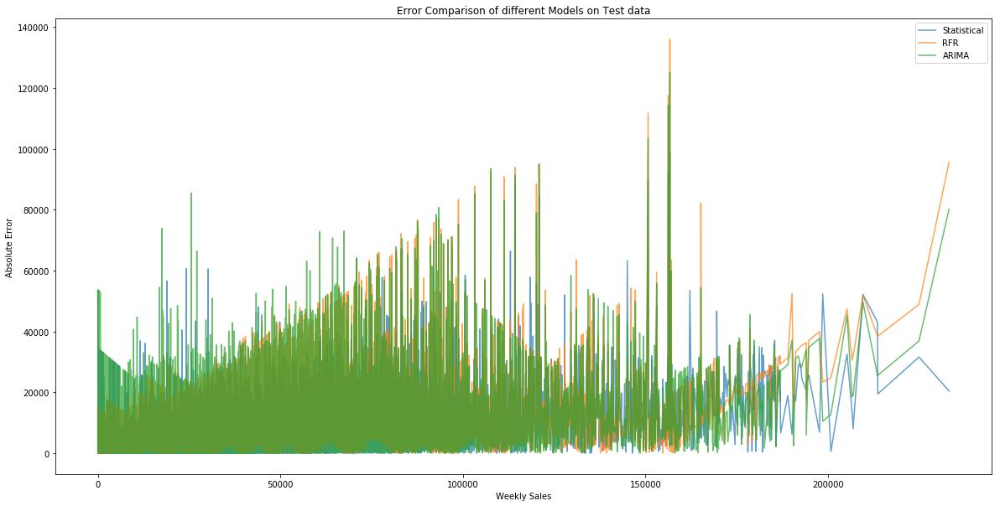

In [419]:
#Plotting the absolute error with the weekly sales for all the 3 predictions
temper1 = test_scored_stats.sort_values(by=['Weekly_Sales'])
temper2 = test_rf.sort_values(by=['Weekly_Sales'])
temper3 = fullyscored_test_arima.sort_values(by=['Weekly_Sales'])

plt.figure(figsize=(20,10))
plt.title('Error Comparison of different Models on Test data')
plt.xlabel('Weekly Sales')
plt.ylabel('Absolute Error')
plt.plot(temper1['Weekly_Sales'], temper1['error_abs_st'], label ='Statistical', alpha = 0.7)
plt.plot(temper2['Weekly_Sales'], temper2['error_abs_rf'], label = 'RFR', alpha = 0.7)
plt.plot(temper3['Weekly_Sales'], temper3['error_abs_ar'], label = 'ARIMA', alpha = 0.7)
plt.legend()

# Discussion and Conclusion

In [ ]:
# Macro Economic Indicators did not help in prediction of weekly sales. The sales data is very similar over different years \
# and this consistency helped to predict the sales. 